In [1]:
from __future__ import print_function, division

import os
import numpy as np
import pandas as pd
import copy
import time
import random
import seaborn as sns
from collections import defaultdict

#import Augmentor
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import torchvision
from torchvision import datasets, models, transforms
from torchsummary import summary
import matplotlib.pyplot as plt

#from PIL import Image
import PIL.Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# see https://github.com/pytorch/pytorch/issues/7068
SEED = 0
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)
torch.backends.cudnn.deterministic=True

In [3]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
    
device = torch.device("cuda:0" if train_on_gpu else "cpu")

CUDA is available!  Training on GPU ...


In [4]:
# These are referred to in many places so set now 
checkpt = ""
state_dicts_name = ""

In [5]:
def get_learning_rate(optimizer):
    lr=[]
    for param_group in optimizer.param_groups:
       lr +=[ param_group['lr'] ]
    return lr

In [6]:
data_dir = 'flower_data'
train_dir = data_dir + '/train/'
valid_dir = data_dir + '/valid/'
test_dir  = data_dir + '/test/'
testset_dir = data_dir + '/testset/'
testset_subdir = data_dir + '/testset/testdir/'

In [7]:
img_means = None
img_std = None

### Determine actual mean and standard deviations

In [8]:
# Run if resetting manually after reloading (skipping remaining steps)
img_means = [0.5178, 0.4110, 0.3295]
img_std   = [0.2972, 0.2494, 0.2856]

----

In [9]:
image_size = 224
tfms_basic = transforms.Compose([
        transforms.Resize(image_size + (image_size//7)),
        transforms.CenterCrop(image_size),
        transforms.ToTensor()
])

dataset1 = datasets.ImageFolder(train_dir, transform=tfms_basic)
dataloader1 = torch.utils.data.DataLoader(dataset1, batch_size=128)
dataset2 = datasets.ImageFolder(valid_dir, transform=tfms_basic)
dataloader2 = torch.utils.data.DataLoader(dataset2, batch_size=128)

In [10]:
# Get the mean and standard deviation of all images in train and valid datasets
red_chan = []
gre_chan = []
blu_chan = []

for images, labels in dataloader1:
    for image in images:
        red_chan.append(image[0])
        gre_chan.append(image[1])
        blu_chan.append(image[2])
        
for images, labels in dataloader2:
    for image in images:
        red_chan.append(image[0])
        gre_chan.append(image[1])
        blu_chan.append(image[2])    
        
red_channels = torch.cat(red_chan, dim=0)
green_channels = torch.cat(gre_chan, dim=0)
blue_channels = torch.cat(blu_chan, dim=0)        

In [11]:
red_channels.min(), green_channels.min(), blue_channels.min()

(tensor(0.), tensor(0.), tensor(0.))

In [12]:
red_channels.max(), green_channels.max(), blue_channels.max()

(tensor(1.), tensor(1.), tensor(1.))

In [13]:
red_channels.mean(), green_channels.mean(), blue_channels.mean()

(tensor(0.5178), tensor(0.4110), tensor(0.3295))

In [14]:
red_channels.std(), green_channels.std(), blue_channels.std()

(tensor(0.2972), tensor(0.2494), tensor(0.2856))

In [15]:
img_means = round(red_channels.mean().item(), 4), round(green_channels.mean().item(), 4), round(blue_channels.mean().item(), 4)

In [16]:
img_means = list(img_means)

In [17]:
img_means

[0.5178, 0.411, 0.3295]

In [18]:
img_std = round(red_channels.std().item(), 4), round(green_channels.std().item(), 4), round(blue_channels.std().item(), 4)

In [19]:
img_std = list(img_std)

In [20]:
img_std

[0.2972, 0.2494, 0.2856]

In [21]:
del dataloader1
del dataloader2
del red_chan, gre_chan, blu_chan
del red_channels, green_channels, blue_channels

### End of determining true mean and std

In [22]:
print(img_means)
print(img_std)

None
None


In [23]:
def imshow(image, ax=None, title=None, filename=None, normalize=True):
    """Imshow for Tensor."""
    
    global img_means, img_std
    
    if img_means is not None:
        imgmeans = img_means
    else: 
        imgmeans = [0.485, 0.456, 0.406]

    if img_std is not None:
        imgstd = img_std
    else: 
        imgstd = [0.229, 0.224, 0.225]
        
    if isinstance(image, torch.Tensor): image = copy.deepcopy(image.numpy())
        
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    if isinstance(image, np.ndarray):     # type(image).__module__ == "numpy":    #
        image = image.transpose((1, 2, 0))
    else:
        image = image.numpy.transpose((1, 2, 0))
    
    
    if normalize:
        # Undo preprocessing
        mean = np.array(imgmeans)
        std = np.array(imgstd)
        image = std * image + mean
        # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
        image = np.clip(image, 0, 1)

    if title is not None:
        ax.set_title(title)
    if filename is not None: 
        ax.set_xlabel(filename)
        
    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')
    
    return ax

In [24]:
def unfreeze(model):
    for name, child in model.named_children():
        for param in child.parameters():
            param.requires_grad = True
        unfreeze(child)

In [25]:
batch_size = 64  # 16 if unfreezing
num_workers = 4

In [26]:
batch_size = 16 # if unfreezing
num_workers = 4

#### Increase image size to try and kick training up a notch (from 224 to 256, then ? )

In [27]:
image_size = 256 # 224  # 256

if img_means is not None:
    imgmeans = img_means
else: 
    imgmeans = [0.485, 0.456, 0.406]

if img_std is not None:
    imgstd = img_std
else: 
    imgstd = [0.229, 0.224, 0.225]
        
data_transforms = {
    'train': transforms.Compose([transforms.RandomAffine(45, translate=(0.1, 0.1), scale=(1.0, 1.5), 
                                                         shear=None, resample=PIL.Image.BILINEAR, fillcolor=0),
                                       transforms.Resize(image_size + (image_size//7), interpolation=PIL.Image.BILINEAR),
                                       transforms.CenterCrop(image_size),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.05), 
                                       transforms.ToTensor(),
                                       transforms.Normalize(imgmeans, imgstd)
                                ]), 
    'valid': transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                       transforms.CenterCrop(image_size),
                                       transforms.ToTensor(),
                                       transforms.Normalize(imgmeans, imgstd)
                                ]),
    'test' : transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                      transforms.CenterCrop(image_size),
                                      transforms.ToTensor(),
                                      transforms.Normalize(imgmeans, imgstd)
                                ]),
    'testset' : transforms.Compose([transforms.Resize(image_size + (image_size//7)),
                                      transforms.CenterCrop(image_size),
                                      transforms.ToTensor(),
                                      transforms.Normalize(imgmeans, imgstd)
                                ])
}    

In [28]:
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'valid', 'test']}

class_names = image_datasets['train'].classes
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'valid', 'test']}

In [29]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False if x[:4]=='test' else True, 
                                              num_workers=num_workers)
              for x in ['train', 'valid', 'test']}

### Use ImageFolderWithPaths wrapper as alternative datasets and loaders for test and kaggle images
 
Seems to only work with num_workers = 0

In [30]:
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

In [124]:
test_datasets = {x: ImageFolderWithPaths(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['valid', 'test', 'testset']}

test_dataloaders = {x: torch.utils.data.DataLoader(test_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False)
              for x in ['valid', 'test', 'testset']}

In [32]:
import json

with open('cat_to_name.json', 'r') as f:
    cat_to_name = json.load(f)

class_to_idx = dataloaders['train'].dataset.class_to_idx

idx_to_class =  {y:x for x,y in class_to_idx.items()}

In [33]:
class_counts = defaultdict(int)
for _, c in image_datasets["train"].imgs:
    class_counts[c] += 1

class_weights = [1-(float(class_counts[class_id])/len(image_datasets["train"].imgs))
                 for class_id in range(len(image_datasets["train"].classes))]
class_weights = torch.FloatTensor(class_weights)
class_weights.to(device)

tensor([0.9959, 0.9942, 0.9947, 0.9925, 0.9945, 0.9896, 0.9889, 0.9942, 0.9933,
        0.9942, 0.9945, 0.9908, 0.9901, 0.9942, 0.9925, 0.9930, 0.9948, 0.9928,
        0.9890, 0.9947, 0.9948, 0.9950, 0.9945, 0.9916, 0.9905, 0.9945, 0.9907,
        0.9927, 0.9945, 0.9953, 0.9957, 0.9950, 0.9905, 0.9860, 0.9933, 0.9950,
        0.9933, 0.9918, 0.9852, 0.9925, 0.9847, 0.9889, 0.9950, 0.9760, 0.9907,
        0.9913, 0.9942, 0.9918, 0.9889, 0.9686, 0.9898, 0.9893, 0.9928, 0.9915,
        0.9860, 0.9924, 0.9869, 0.9915, 0.9947, 0.9870, 0.9945, 0.9927, 0.9936,
        0.9936, 0.9866, 0.9922, 0.9945, 0.9934, 0.9930, 0.9950, 0.9922, 0.9902,
        0.9882, 0.9776, 0.9783, 0.9855, 0.9873, 0.9687, 0.9829, 0.9948, 0.9893,
        0.9875, 0.9794, 0.9875, 0.9841, 0.9899, 0.9927, 0.9927, 0.9922, 0.9823,
        0.9766, 0.9937, 0.9899, 0.9910, 0.9919, 0.9948, 0.9799, 0.9846, 0.9890,
        0.9918, 0.9896, 0.9924], device='cuda:0')

---

### Data Exploration

In [34]:
for flower in sorted(cat_to_name.items(), key=lambda x: int(x[0])):
    print(flower)

('1', 'pink primrose')
('2', 'hard-leaved pocket orchid')
('3', 'canterbury bells')
('4', 'sweet pea')
('5', 'english marigold')
('6', 'tiger lily')
('7', 'moon orchid')
('8', 'bird of paradise')
('9', 'monkshood')
('10', 'globe thistle')
('11', 'snapdragon')
('12', "colt's foot")
('13', 'king protea')
('14', 'spear thistle')
('15', 'yellow iris')
('16', 'globe-flower')
('17', 'purple coneflower')
('18', 'peruvian lily')
('19', 'balloon flower')
('20', 'giant white arum lily')
('21', 'fire lily')
('22', 'pincushion flower')
('23', 'fritillary')
('24', 'red ginger')
('25', 'grape hyacinth')
('26', 'corn poppy')
('27', 'prince of wales feathers')
('28', 'stemless gentian')
('29', 'artichoke')
('30', 'sweet william')
('31', 'carnation')
('32', 'garden phlox')
('33', 'love in the mist')
('34', 'mexican aster')
('35', 'alpine sea holly')
('36', 'ruby-lipped cattleya')
('37', 'cape flower')
('38', 'great masterwort')
('39', 'siam tulip')
('40', 'lenten rose')
('41', 'barbeton daisy')
('42', 

In [35]:
print("Training data files per class:")
print("-----------------------------------")
for i in range (1, 103):
    x=len(os.listdir(train_dir+str(i))) 
    print('{:<3} {:<25} {:>5}'. format(i, cat_to_name[str(i)], x))

Training data files per class:
-----------------------------------
1   pink primrose                27
2   hard-leaved pocket orchid    49
3   canterbury bells             36
4   sweet pea                    44
5   english marigold             54
6   tiger lily                   35
7   moon orchid                  33
8   bird of paradise             70
9   monkshood                    41
10  globe thistle                38
11  snapdragon                   68
12  colt's foot                  73
13  king protea                  38
14  spear thistle                44
15  yellow iris                  38
16  globe-flower                 36
17  purple coneflower            60
18  peruvian lily                65
19  balloon flower               38
20  giant white arum lily        46
21  fire lily                    34
22  pincushion flower            47
23  fritillary                   72
24  red ginger                   35
25  grape hyacinth               34
26  corn poppy                   

In [36]:
print("Validation data files per class:")
print("-----------------------------------")
for i in range (1, 103):
    x=len(os.listdir(valid_dir+str(i))) 
    print('{:<3} {:<25} {:>5}'. format(i, cat_to_name[str(i)], x))

Validation data files per class:
-----------------------------------
1   pink primrose                 8
2   hard-leaved pocket orchid     6
3   canterbury bells              2
4   sweet pea                     6
5   english marigold              7
6   tiger lily                    1
7   moon orchid                   1
8   bird of paradise              5
9   monkshood                     3
10  globe thistle                 4
11  snapdragon                   10
12  colt's foot                   5
13  king protea                   5
14  spear thistle                 1
15  yellow iris                   7
16  globe-flower                  2
17  purple coneflower            16
18  peruvian lily                11
19  balloon flower                4
20  giant white arum lily         7
21  fire lily                     4
22  pincushion flower             8
23  fritillary                   12
24  red ginger                    5
25  grape hyacinth                2
26  corn poppy                 

In [37]:
print("Testing data files per class:")
print("-----------------------------------")
for i in range (1, 103):
    x=len(os.listdir(test_dir+str(i))) 
    print('{:<3} {:<25} {:>5}'. format(i, cat_to_name[str(i)], x))

Testing data files per class:
-----------------------------------
1   pink primrose                 5
2   hard-leaved pocket orchid     5
3   canterbury bells              2
4   sweet pea                     6
5   english marigold              4
6   tiger lily                    9
7   moon orchid                   6
8   bird of paradise             10
9   monkshood                     2
10  globe thistle                 3
11  snapdragon                    9
12  colt's foot                   9
13  king protea                   6
14  spear thistle                 3
15  yellow iris                   4
16  globe-flower                  3
17  purple coneflower             9
18  peruvian lily                 6
19  balloon flower                7
20  giant white arum lily         3
21  fire lily                     2
22  pincushion flower             4
23  fritillary                    7
24  red ginger                    2
25  grape hyacinth                5
26  corn poppy                    

In [38]:
images, labels = next(iter(dataloaders['train']))

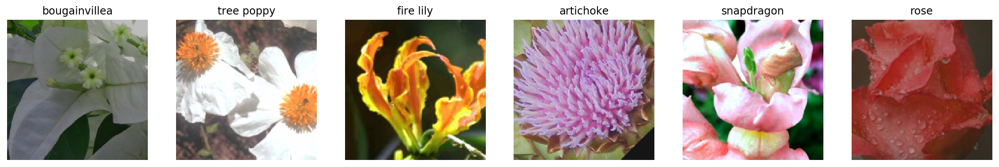

In [39]:
fig, axes = plt.subplots(figsize=(20, 6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, filename=None, normalize=True)

In [40]:
images, labels = next(iter(dataloaders['valid']))

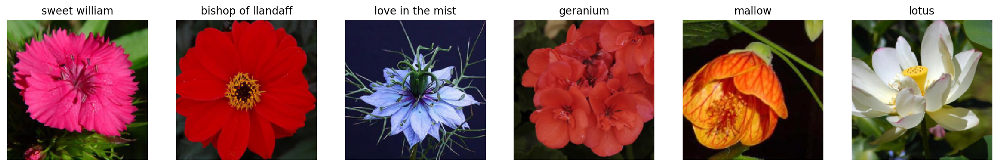

In [41]:
fig, axes = plt.subplots(figsize=(20,6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, filename=None, normalize=True)

In [42]:
images, labels = next(iter(dataloaders['test']))

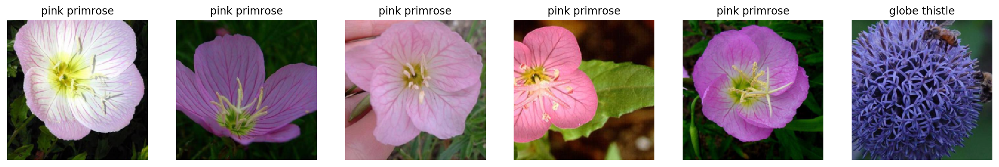

In [43]:
fig, axes = plt.subplots(figsize=(20,6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    title = cat_to_name[idx_to_class[labels[ii].item()]]
    imshow(images[ii], ax=ax, title=title, filename=None, normalize=True)

#### Kaggle test set is not organised with labels folders, need to match image file name and class prediction

In [44]:
images, labels, paths = next(iter(test_dataloaders['testset']))

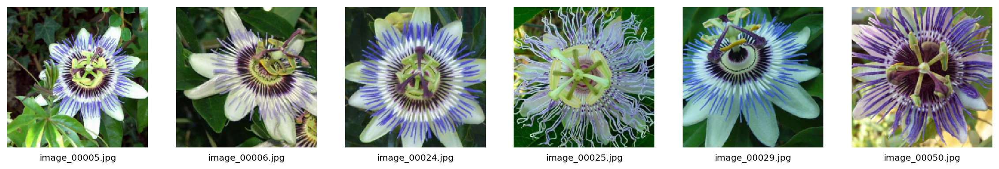

In [45]:
fig, axes = plt.subplots(figsize=(20,6), ncols=6)

for ii in range(6):
    ax = axes[ii]
    filename = os.path.basename(paths[ii])
    imshow(images[ii], ax=ax, title=None, filename=filename, normalize=True)

----

# Model, swap last 2 layers with fastai approach 

In [46]:
# From fastai...
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=None):
        super().__init__()
        sz = sz or (1,1)
        self.ap = nn.AdaptiveAvgPool2d(sz)
        self.mp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)

In [47]:
class Flatten(nn.Module):
    def __init__(self):
        super(Flatten, self).__init__()

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return x

In [48]:
def get_resnet_model(modelname='resnet50', swap=False, sm=False):
    if modelname == 'resnet18':
        model = models.resnet18(pretrained=True)   
    elif modelname == 'resnet34':    
        model = models.resnet34(pretrained=True)   
    elif modelname == 'resnet50':    
        model = models.resnet50(pretrained=True)
    elif modelname == 'resnet101':    
        model = models.resnet101(pretrained=True)
    elif modelname == 'resnet152':    
        model = models.resnet152(pretrained=True)
    else:
        model = models.resnet50(pretrained=True)
        
    for param in model.parameters():
        param.requires_grad = False    
        
    clf_input_size = model.fc.in_features
    clf_output_size = 102 # len(class_names)
    nf = clf_input_size * 2 # For flattening ...
    
    if swap==True:
        # swapping last 2 layers for new ones - adaptive max pooling and more layers
        # per the fastai resnet implementation...
        Resnetlayers = []
        Resnetlayers.append(AdaptiveConcatPool2d())
        Resnetlayers.append(Flatten())
        Resnetlayers.append(nn.BatchNorm1d(nf, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=nf, out_features=512, bias=True))
        Resnetlayers.append(nn.ReLU())
        Resnetlayers.append(nn.BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True))
        Resnetlayers.append(nn.Dropout(p=0.25))
        Resnetlayers.append(nn.Linear(in_features=512, out_features=clf_output_size, bias=True))        
        if sm==True:
            Resnetlayers.append(nn.LogSoftmax())
            
        Resnetlist = list(model.children())[:-2] + Resnetlayers
        model = torch.nn.Sequential(*Resnetlist)
    else:    
        # standard replacing the fc layer to suit the number of classes
        classifier = nn.Linear(clf_input_size, clf_output_size)
        model.fc = classifier

    model.class_to_idx = class_to_idx
    
    return model

In [49]:
del model

In [50]:
model_name = "resnet152"

In [51]:
model = get_resnet_model(model_name, swap=True, sm=False)
model = model.to(device)

In [52]:
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

            ReLU-253          [-1, 256, 14, 14]               0
          Conv2d-254          [-1, 256, 14, 14]         589,824
     BatchNorm2d-255          [-1, 256, 14, 14]             512
            ReLU-256          [-1, 256, 14, 14]               0
          Conv2d-257         [-1, 1024, 14, 14]         262,144
     BatchNorm2d-258         [-1, 1024, 14, 14]           2,048
            ReLU-259         [-1, 1024, 14, 14]               0
      Bottleneck-260         [-1, 1024, 14, 14]               0
          Conv2d-261          [-1, 256, 14, 14]         262,144
     BatchNorm2d-262          [-1, 256, 14, 14]             512
            ReLU-263          [-1, 256, 14, 14]               0
          Conv2d-264          [-1, 256, 14, 14]         589,824
     BatchNorm2d-265          [-1, 256, 14, 14]             512
            ReLU-266          [-1, 256, 14, 14]               0
          Conv2d-267         [-1, 1024, 14, 14]         262,144
     BatchNorm2d-268         [-1, 1024, 

          Conv2d-509           [-1, 2048, 7, 7]       1,048,576
     BatchNorm2d-510           [-1, 2048, 7, 7]           4,096
            ReLU-511           [-1, 2048, 7, 7]               0
      Bottleneck-512           [-1, 2048, 7, 7]               0
AdaptiveMaxPool2d-513           [-1, 2048, 1, 1]               0
AdaptiveAvgPool2d-514           [-1, 2048, 1, 1]               0
AdaptiveConcatPool2d-515           [-1, 4096, 1, 1]               0
         Flatten-516                 [-1, 4096]               0
     BatchNorm1d-517                 [-1, 4096]           8,192
         Dropout-518                 [-1, 4096]               0
          Linear-519                  [-1, 512]       2,097,664
            ReLU-520                  [-1, 512]               0
     BatchNorm1d-521                  [-1, 512]           1,024
         Dropout-522                  [-1, 512]               0
          Linear-523                  [-1, 102]          52,326
Total params: 60,303,014
Trainable

In [53]:
print(model)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1

)


## Criterion, 2 versions - with and without weights...

In [54]:
# Passing in class_weights previously determined (first phase)
use_weights = True
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device), reduction='sum')   

In [55]:
# OR, not using weights (subsequent phases)...
use_weights = False
criterion = nn.CrossEntropyLoss()

In [56]:
use_weights

False

## Set up optimizer

In [57]:
learning_rate=0.0001

In [58]:
learning_rate=0.000001

In [59]:
learning_rate=0.00001

In [60]:
learning_rate=0.001

#### Ended phase one with learning rate `1.0000000000000002e-06` and accuracy `0.966993`

In [61]:
print("{:.10f}".format(1.0000000000000002e-06))

0.0000010000


In [62]:
learning_rate=0.000001

In [63]:
# Set training parameters
parameters = filter(lambda p: p.requires_grad, model.parameters())

optimizer = optim.Adam(parameters, lr=learning_rate)

## Scheduler

In [64]:
multistep = False
OnPlateau = False

# Decay LR by a factor of 0.1 every 14 epochs (9 for inception)
if OnPlateau == True:
    #exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5, min_lr=0.000001)
    exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)
elif multistep==True:
    exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [7, 13, 23], gamma=0.05) # gamma=0.1
else:
    # exp_lr_scheduler = lr_scheduler.StepLR(optimizer, 10, gamma=0.1)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer, 7, gamma=0.05)
    # exp_lr_scheduler = lr_scheduler.StepLR(optimizer, 5, gamma=0.1)

In [65]:
get_learning_rate(optimizer)

[0.0001]

## Get best learning rate

In [66]:
import math

def find_lr(model, optimizer, init_value = 1e-8, final_value=10., beta = 0.98):
    num = len(dataloaders['train'])-1
    mult = (final_value / init_value) ** (1/num)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    avg_loss = 0.
    best_loss = 0.
    batch_num = 0
    losses = []
    log_lrs = []
    
    for images, labels in dataloaders['train']:
        batch_num += 1
        
        #Get the loss for this mini-batch of images/outputs
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        output = model.forward(images)
        
        loss = criterion(output, labels)
        
        #Compute the smoothed loss
        avg_loss = beta * avg_loss + (1-beta) * loss.item()
        smoothed_loss = avg_loss / (1 - beta**batch_num)
        
        #Stop if the loss is exploding
        if batch_num > 1 and smoothed_loss > 4 * best_loss:
            return log_lrs, losses
        
        #Record the best loss
        if smoothed_loss < best_loss or batch_num==1:
            best_loss = smoothed_loss
        
        #Store the values
        losses.append(smoothed_loss)
        log_lrs.append(math.log10(lr))
        
        #Do the SGD step
        loss.backward()
        optimizer.step()
        
        #Update the lr for the next step
        lr *= mult
        optimizer.param_groups[0]['lr'] = lr
    
    return log_lrs, losses
    

In [67]:
model.to(device);

In [68]:
logs, losses = find_lr(model, optimizer)

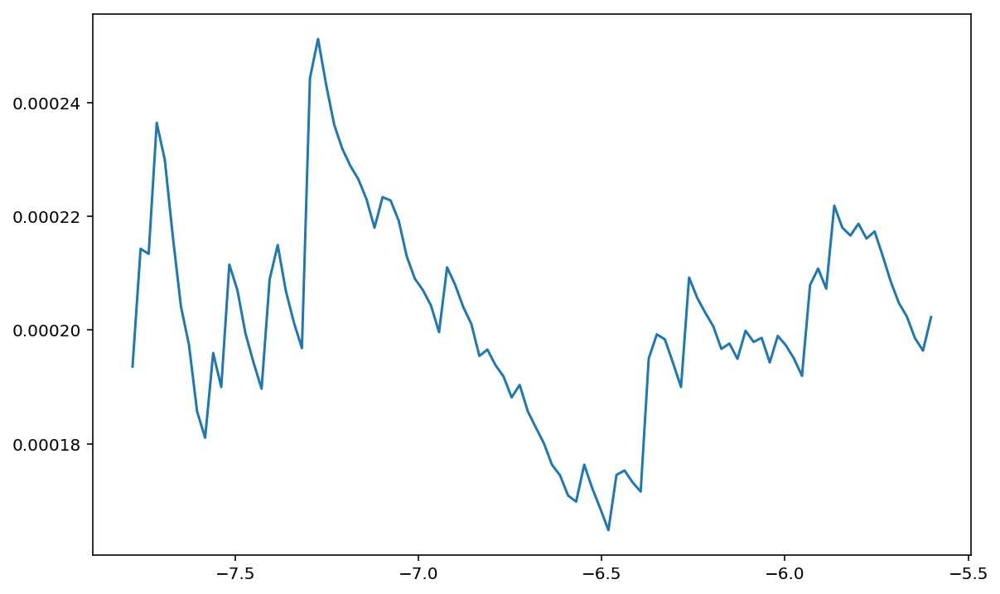

In [69]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(logs[10:-5],losses[10:-5])

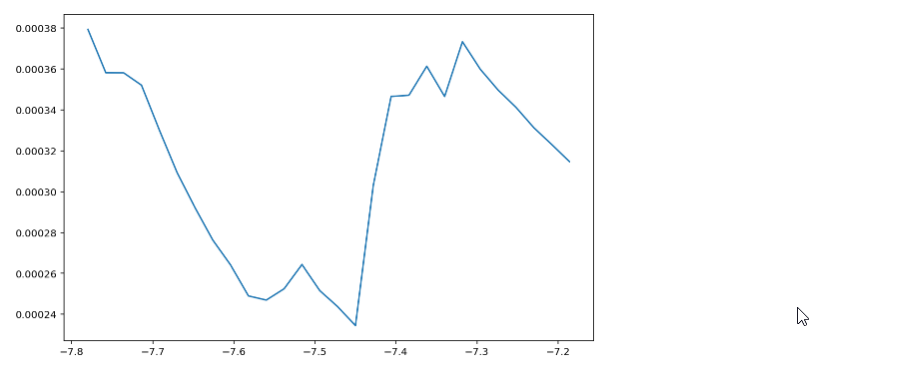

In [70]:
print("{:.10f}".format(1.0000000000000002e-06))
print("{:.10f}".format(8e-07))
print("{:.10f}".format(1.0000000000000002e-07))
print("{:.10f}".format(0.5e-06))
print()
print("{:.10f}".format(1e-07))
print("{:.10f}".format(8e-07))
print()
print("{:.10f}".format(0.8e-07))
print("{:.10f}".format(0.77e-07))
print("{:.10f}".format(7.7e-08))
print("{:.10f}".format(7.8e-08))
print("{:.10f}".format(1e-08))


0.0000010000
0.0000008000
0.0000001000
0.0000005000

0.0000001000
0.0000008000

0.0000000800
0.0000000770
0.0000000770
0.0000000780
0.0000000100


In [71]:
print("{:.10f}".format(2.5e-06))
print("{:.10f}".format(1.25e-06))
print("{:.10f}".format(1e-06))
print()
print("{:.10f}".format(7.5e-07))
print("{:.10f}".format(5e-07))
print("{:.10f}".format(2.5e-07))
print("{:.10f}".format(1.25e-07))
print("{:.10f}".format(1e-07))
print()
print("{:.10f}".format(7.5e-08))
print("{:.10f}".format(5e-08))
print("{:.10f}".format(2.5e-08))
print("{:.10f}".format(1.25e-08))
print("{:.10f}".format(1e-08))

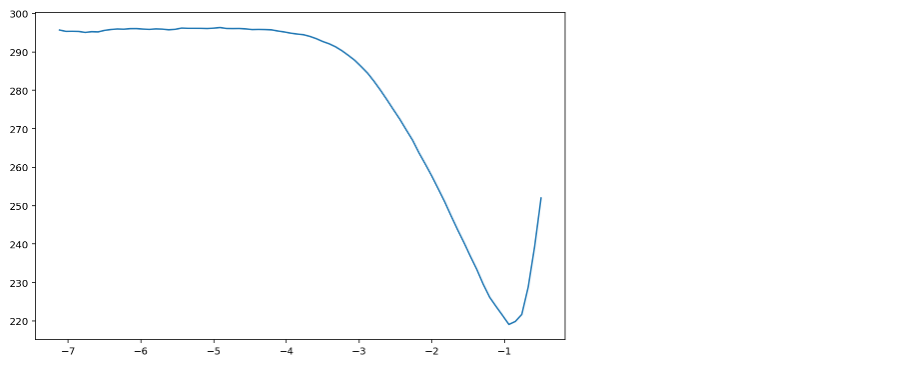

In [72]:
print("{:5f}".format(1e-2))
print("{:5f}".format(1e-3))
print("{:5f}".format(1e-4))

0.010000
0.001000
0.000100


# Training loop

### Only reset starting variables if setting up or starting a new training...

In [73]:
train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []
best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

In [74]:
# train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []
# best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

def train_model(model, criterion, optimizer, scheduler, use_scheduler=False, use_weights=False, 
                num_epochs=25, first_epoch=0, ufilename=None, is_inception=False):
    
# Define these outside the program so that training can continue from the previous point
#     train_losses, valid_losses = [], []
#     val_acc_history = []
#     best_acc = 0.0
#     best_epoch = 0
#     epoch_loss_min = np.Inf   # track change in validation loss

    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_epoch, epoch_loss_min
    global model_name
    
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_optim_wts = copy.deepcopy(optimizer.state_dict())

    curr_lr = get_learning_rate(optimizer)
    
    # if first_epoch is used assume its to restart training at that point using 1-based indexing
    # so decrement by 1 then add the value to num_epochs
    if first_epoch > 0:
        first_epoch -= 1
        num_epochs = first_epoch + num_epochs
    
    for epoch in range(first_epoch, num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 11)

        # Each epoch has a training and validation phase
        for phase in ['train', 'valid']:
            if phase == 'train':
                if use_scheduler==True: 
                    if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                        # using best accuracy - the max setting
                        scheduler.step(best_acc)
                    else:    
                        scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                    
                    outputs = model(inputs)
                    
                    if isinstance(outputs, tuple):
                        if epoch == first_epoch:
                            print("Outputs:", outputs)
                        
                        if is_inception and phase == 'train':
                            loss1 = criterion(outputs[0], labels)
                            loss2 = criterion(outputs[1], labels)
                            loss = loss1 + 0.4*loss2
                        else:    
                            loss = sum((criterion(o,labels) for o in outputs))
                    else:
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)
                    
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * (1 if use_weights==True else inputs.size(0))
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                train_losses.append(epoch_loss)
                curr_lr = get_learning_rate(optimizer)
                lr_hist.append(curr_lr)
                
                print("Learning rate: {}".format(curr_lr))
                
            if phase == 'valid':
                valid_losses.append(epoch_loss)
                val_acc_history.append(epoch_acc.item())
                                
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'valid' and epoch_acc > best_acc:
                filename = model_name + '_acc_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                filename = filename + str(epoch+1) 
                
                print('Accuracy has increased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                    best_acc, epoch_acc,
                    filename))
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                best_optim_wts = copy.deepcopy(optimizer.state_dict())
                torch.save(best_model_wts, filename + '.pt')
                torch.save(best_optim_wts, filename + '_optimizer.pt')               
                
            if phase == 'valid' and epoch_loss <= epoch_loss_min:
                filename = model_name + '_'
                if ufilename is not None:
                    filename = filename + ufilename + '_'
                else:    
                    if use_scheduler==True:
                        filename = filename + 'schd_'
                    if use_weights==True:
                        filename = filename + 'wgts_'
                filename = filename + str(epoch+1) 
                
                print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model as {}...'.format(
                epoch_loss_min,
                epoch_loss,
                filename))
                
                best_epoch = epoch+1
                
                torch.save(model.state_dict(), filename + '.pt')
                torch.save(optimizer.state_dict(), filename + '_optimizer.pt')
                epoch_loss_min = epoch_loss

        print()

    time_elapsed = time.time() - since
    
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best validation Accuracy: {:4f}'.format(best_acc))
    print('Best validation Loss    : {:4f}'.format(epoch_loss_min))
    print('Best epoch: {}'.format(best_epoch))
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    optimizer.load_state_dict(best_optim_wts)
    
    return model

# Train the model...

### Define tracking variables outside the program so that training can continue from the previous point

**Only run these if starting from scratch, otherwise preserve them**

Remove unwanted array elements if resetting back to an earlier epoch rather than starting again after the last one...

In [75]:
train_losses, valid_losses, val_acc_history, lr_hist = [], [], [], []

In [76]:
best_acc, best_epoch, epoch_loss_min = 0.0, 0, np.Inf

In [77]:
print(best_acc, best_epoch, epoch_loss_min)

0.0 0 inf


In [78]:
use_weights

True

In [79]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=20,
                    first_epoch=0,
                    ufilename="One",
                    is_inception=(model_name=="inception"))

Epoch 1/20
-----------
Learning rate: [0.001]
train Loss: 1.9428 Acc: 0.6517
valid Loss: 0.6458 Acc: 0.9046
Accuracy has increased (0.000000 --> 0.904645).  Saving model as resnet152_acc_One_1...
Validation loss decreased (inf --> 0.645843).  Saving model as resnet152_One_1...

Epoch 2/20
-----------
Learning rate: [0.001]
train Loss: 0.5884 Acc: 0.8956
valid Loss: 0.3131 Acc: 0.9499
Accuracy has increased (0.904645 --> 0.949878).  Saving model as resnet152_acc_One_2...
Validation loss decreased (0.645843 --> 0.313054).  Saving model as resnet152_One_2...

Epoch 3/20
-----------
Learning rate: [0.001]
train Loss: 0.3451 Acc: 0.9296
valid Loss: 0.2481 Acc: 0.9523
Accuracy has increased (0.949878 --> 0.952323).  Saving model as resnet152_acc_One_3...
Validation loss decreased (0.313054 --> 0.248110).  Saving model as resnet152_One_3...

Epoch 4/20
-----------
Learning rate: [0.001]
train Loss: 0.2508 Acc: 0.9458
valid Loss: 0.2092 Acc: 0.9548
Accuracy has increased (0.952323 --> 0.954768

### 20 epochs with weights, lr_scheduler.StepLR(optimizer, 5, gamma=0.1)
```
Epoch 1/20
-----------
Learning rate: [0.001]
train Loss: 1.9428 Acc: 0.6517
valid Loss: 0.6458 Acc: 0.9046
Accuracy has increased (0.000000 --> 0.904645).  Saving model as resnet152_acc_One_1...
Validation loss decreased (inf --> 0.645843).  Saving model as resnet152_One_1...

Epoch 2/20
-----------
Learning rate: [0.001]
train Loss: 0.5884 Acc: 0.8956
valid Loss: 0.3131 Acc: 0.9499
Accuracy has increased (0.904645 --> 0.949878).  Saving model as resnet152_acc_One_2...
Validation loss decreased (0.645843 --> 0.313054).  Saving model as resnet152_One_2...

Epoch 3/20
-----------
Learning rate: [0.001]
train Loss: 0.3451 Acc: 0.9296
valid Loss: 0.2481 Acc: 0.9523
Accuracy has increased (0.949878 --> 0.952323).  Saving model as resnet152_acc_One_3...
Validation loss decreased (0.313054 --> 0.248110).  Saving model as resnet152_One_3...

Epoch 4/20
-----------
Learning rate: [0.001]
train Loss: 0.2508 Acc: 0.9458
valid Loss: 0.2092 Acc: 0.9548
Accuracy has increased (0.952323 --> 0.954768).  Saving model as resnet152_acc_One_4...
Validation loss decreased (0.248110 --> 0.209166).  Saving model as resnet152_One_4...

Epoch 5/20
-----------
Learning rate: [0.001]
train Loss: 0.2091 Acc: 0.9518
valid Loss: 0.2018 Acc: 0.9584
Accuracy has increased (0.954768 --> 0.958435).  Saving model as resnet152_acc_One_5...
Validation loss decreased (0.209166 --> 0.201790).  Saving model as resnet152_One_5...

Epoch 6/20
-----------
Learning rate: [0.0001]
train Loss: 0.1668 Acc: 0.9602
valid Loss: 0.1812 Acc: 0.9609
Accuracy has increased (0.958435 --> 0.960880).  Saving model as resnet152_acc_One_6...
Validation loss decreased (0.201790 --> 0.181187).  Saving model as resnet152_One_6...

Epoch 7/20
-----------
Learning rate: [0.0001]
train Loss: 0.1516 Acc: 0.9647
valid Loss: 0.1714 Acc: 0.9621
Accuracy has increased (0.960880 --> 0.962103).  Saving model as resnet152_acc_One_7...
Validation loss decreased (0.181187 --> 0.171382).  Saving model as resnet152_One_7...

Epoch 8/20
-----------
Learning rate: [0.0001]
train Loss: 0.1418 Acc: 0.9686
valid Loss: 0.1663 Acc: 0.9584
Validation loss decreased (0.171382 --> 0.166346).  Saving model as resnet152_One_8...

Epoch 9/20
-----------
Learning rate: [0.0001]
train Loss: 0.1404 Acc: 0.9663
valid Loss: 0.1567 Acc: 0.9645
Accuracy has increased (0.962103 --> 0.964548).  Saving model as resnet152_acc_One_9...
Validation loss decreased (0.166346 --> 0.156719).  Saving model as resnet152_One_9...

Epoch 10/20
-----------
Learning rate: [0.0001]
train Loss: 0.1305 Acc: 0.9696
valid Loss: 0.1570 Acc: 0.9645

Epoch 11/20
-----------
Learning rate: [1.0000000000000003e-05]
train Loss: 0.1224 Acc: 0.9712
valid Loss: 0.1560 Acc: 0.9621
Validation loss decreased (0.156719 --> 0.156006).  Saving model as resnet152_One_11...

Epoch 12/20
-----------
Learning rate: [1.0000000000000003e-05]
train Loss: 0.1178 Acc: 0.9745
valid Loss: 0.1556 Acc: 0.9658
Accuracy has increased (0.964548 --> 0.965770).  Saving model as resnet152_acc_One_12...
Validation loss decreased (0.156006 --> 0.155558).  Saving model as resnet152_One_12...

Epoch 13/20
-----------
Learning rate: [1.0000000000000003e-05]
train Loss: 0.1206 Acc: 0.9748
valid Loss: 0.1564 Acc: 0.9645

Epoch 14/20
-----------
Learning rate: [1.0000000000000003e-05]
train Loss: 0.1218 Acc: 0.9737
valid Loss: 0.1540 Acc: 0.9621
Validation loss decreased (0.155558 --> 0.153956).  Saving model as resnet152_One_14...

Epoch 15/20
-----------
Learning rate: [1.0000000000000003e-05]
train Loss: 0.1204 Acc: 0.9712
valid Loss: 0.1561 Acc: 0.9621

Epoch 16/20
-----------
Learning rate: [1.0000000000000002e-06]
train Loss: 0.1194 Acc: 0.9728
valid Loss: 0.1548 Acc: 0.9633

Epoch 17/20
-----------
Learning rate: [1.0000000000000002e-06]
train Loss: 0.1186 Acc: 0.9737
valid Loss: 0.1525 Acc: 0.9670
Accuracy has increased (0.965770 --> 0.966993).  Saving model as resnet152_acc_One_17...
Validation loss decreased (0.153956 --> 0.152514).  Saving model as resnet152_One_17...

Epoch 18/20
-----------
Learning rate: [1.0000000000000002e-06]
train Loss: 0.1171 Acc: 0.9744
valid Loss: 0.1533 Acc: 0.9670

Epoch 19/20
-----------
Learning rate: [1.0000000000000002e-06]
train Loss: 0.1209 Acc: 0.9757
valid Loss: 0.1535 Acc: 0.9633

Epoch 20/20
-----------
Learning rate: [1.0000000000000002e-06]
train Loss: 0.1155 Acc: 0.9757
valid Loss: 0.1535 Acc: 0.9621

Training complete in 29m 6s
Best validation Accuracy: 0.966993
Best validation Loss    : 0.152514
Best epoch: 17
```

In [80]:
print(best_acc.item(), best_epoch, epoch_loss_min)

0.9669926650366748 17 0.1525139184919138


In [81]:
lr_hist[best_epoch-1]

[1.0000000000000002e-06]

## Print train vs validation losses

### Phase one best model....

In [82]:
best_model_name = 'resnet152_acc_One_17'

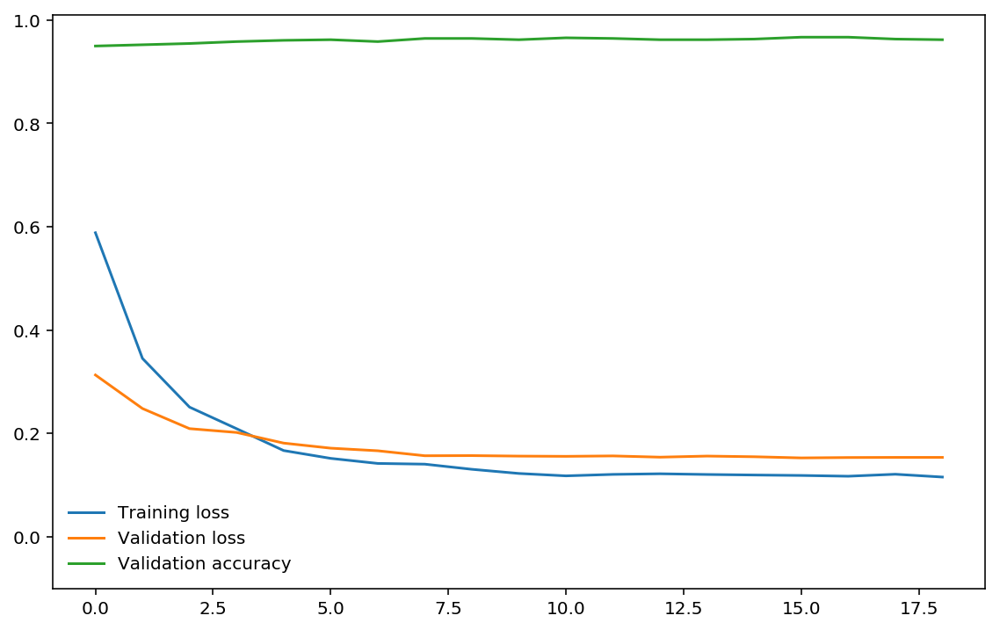

In [83]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[1:], label="Training loss")
plt.plot(valid_losses[1:], label="Validation loss")
plt.plot(val_acc_history[1:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

## Reloading best model from original modelling

## Reloading phase one best model with unfrozen layers for second phase of training

In [84]:
learning_rate=0.000001
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = optim.Adam(parameters, lr=learning_rate)

In [85]:
def reloadModelFromFrozen(state_dicts_name='resnet152_acc_One_17_model_and_opt.pth', learning_rate=0.000001, mult=False):
    
    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_epoch, epoch_loss_min
    global model
    global optimizer

    if train_on_gpu:
        state_dicts = torch.load(state_dicts_name)
    else:
        state_dicts = torch.load(state_dicts_name, map_location='cpu')   
    
    model.load_state_dict(state_dicts['model_statedict'])
    model.class_to_idx = state_dicts['class_to_idx']
    
    # Coming from unfrozen state so load optimizer before unfreezing...
    parameters = filter(lambda p: p.requires_grad, model.parameters())
    optimizer = optim.Adam(parameters, lr=learning_rate)
    optimizer.load_state_dict(state_dicts['optimizer_statedict'])    
    
    if mult==False:
        for layer in range(4,17):
            unfreeze(model[layer])

        parameters = filter(lambda p: p.requires_grad, model.parameters())
        optimizer = optim.Adam(parameters, lr=learning_rate)
    else:
        for param in model.parameters():
            param.requires_grad = True
            
        optimizer = optim.Adam(
                    [
                        {"params": model[9:].parameters(),  "lr": learning_rate},
                        {"params": model[6:8].parameters(), "lr": learning_rate/10},
                        {"params": model[:6].parameters(),  "lr": learning_rate/100},
                    ],
                    lr=learning_rate,
                )    
    
    best_epoch = state_dicts['best_epoch']
    
    train_losses = state_dicts['train_losses'][:best_epoch]
    valid_losses = state_dicts['valid_losses'][:best_epoch]
    val_acc_history = state_dicts['val_acc_history'][:best_epoch]
    lr_hist = state_dicts['lr_hist'][:best_epoch]
    
    best_acc = val_acc_history[-1]
    epoch_loss_min = valid_losses[-1]


In [86]:
state_dicts_name = 'resnet152_acc_One_17_model_and_opt.pth'
learning_rate=0.000001

reloadModelFromFrozen(state_dicts_name, learning_rate, mult=False)

In [87]:
exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

In [88]:
print(best_epoch)
print(best_acc)
print(epoch_loss_min)

17
0.9669926650366748
0.1525139184919138


In [89]:
print(lr_hist)

[[0.001], [0.001], [0.001], [0.001], [0.001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [1.0000000000000003e-05], [1.0000000000000003e-05], [1.0000000000000003e-05], [1.0000000000000003e-05], [1.0000000000000003e-05], [1.0000000000000002e-06], [1.0000000000000002e-06]]


### End of reloading for second phase

In [90]:
use_weights

False

In [91]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=20,
                    first_epoch=21,
                    ufilename="Two",
                    is_inception=(model_name=="inception"))

Epoch 21/40
-----------
Learning rate: [1e-06]
train Loss: 0.1959 Acc: 0.9525
valid Loss: 0.1571 Acc: 0.9621

Epoch 22/40
-----------
Learning rate: [1e-06]
train Loss: 0.1793 Acc: 0.9567
valid Loss: 0.1461 Acc: 0.9658
Validation loss decreased (0.152514 --> 0.146133).  Saving model as resnet152_Two_22...

Epoch 23/40
-----------
Learning rate: [1e-06]
train Loss: 0.1653 Acc: 0.9617
valid Loss: 0.1335 Acc: 0.9707
Accuracy has increased (0.966993 --> 0.970660).  Saving model as resnet152_acc_Two_23...
Validation loss decreased (0.146133 --> 0.133457).  Saving model as resnet152_Two_23...

Epoch 24/40
-----------
Learning rate: [1e-06]
train Loss: 0.1542 Acc: 0.9640
valid Loss: 0.1316 Acc: 0.9670
Validation loss decreased (0.133457 --> 0.131566).  Saving model as resnet152_Two_24...

Epoch 25/40
-----------
Learning rate: [1e-06]
train Loss: 0.1503 Acc: 0.9637
valid Loss: 0.1348 Acc: 0.9658

Epoch 26/40
-----------
Learning rate: [1e-06]
train Loss: 0.1354 Acc: 0.9690
valid Loss: 0.1314 

### Phase two results - should have numbered from 18 rather than 21...

**As best epoch from phase 1 was at 17...**
```
Epoch 21/40
-----------
Learning rate: [1e-06]
train Loss: 0.1959 Acc: 0.9525
valid Loss: 0.1571 Acc: 0.9621

Epoch 22/40
-----------
Learning rate: [1e-06]
train Loss: 0.1793 Acc: 0.9567
valid Loss: 0.1461 Acc: 0.9658
Validation loss decreased (0.152514 --> 0.146133).  Saving model as resnet152_Two_22...

Epoch 23/40
-----------
Learning rate: [1e-06]
train Loss: 0.1653 Acc: 0.9617
valid Loss: 0.1335 Acc: 0.9707
Accuracy has increased (0.966993 --> 0.970660).  Saving model as resnet152_acc_Two_23...
Validation loss decreased (0.146133 --> 0.133457).  Saving model as resnet152_Two_23...

Epoch 24/40
-----------
Learning rate: [1e-06]
train Loss: 0.1542 Acc: 0.9640
valid Loss: 0.1316 Acc: 0.9670
Validation loss decreased (0.133457 --> 0.131566).  Saving model as resnet152_Two_24...

Epoch 25/40
-----------
Learning rate: [1e-06]
train Loss: 0.1503 Acc: 0.9637
valid Loss: 0.1348 Acc: 0.9658

Epoch 26/40
-----------
Learning rate: [1e-06]
train Loss: 0.1354 Acc: 0.9690
valid Loss: 0.1314 Acc: 0.9670
Validation loss decreased (0.131566 --> 0.131362).  Saving model as resnet152_Two_26...

Epoch 27/40
-----------
Learning rate: [1e-06]
train Loss: 0.1353 Acc: 0.9690
valid Loss: 0.1231 Acc: 0.9707
Validation loss decreased (0.131362 --> 0.123061).  Saving model as resnet152_Two_27...

Epoch 28/40
-----------
Learning rate: [1e-06]
train Loss: 0.1279 Acc: 0.9739
valid Loss: 0.1186 Acc: 0.9707
Validation loss decreased (0.123061 --> 0.118628).  Saving model as resnet152_Two_28...

Epoch 29/40
-----------
Learning rate: [1e-06]
train Loss: 0.1277 Acc: 0.9719
valid Loss: 0.1190 Acc: 0.9731
Accuracy has increased (0.970660 --> 0.973105).  Saving model as resnet152_acc_Two_29...

Epoch 30/40
-----------
Learning rate: [1e-06]
train Loss: 0.1205 Acc: 0.9741
valid Loss: 0.1060 Acc: 0.9768
Accuracy has increased (0.973105 --> 0.976773).  Saving model as resnet152_acc_Two_30...
Validation loss decreased (0.118628 --> 0.105974).  Saving model as resnet152_Two_30...

Epoch 31/40
-----------
Learning rate: [1e-06]
train Loss: 0.1150 Acc: 0.9750
valid Loss: 0.1084 Acc: 0.9731

Epoch 32/40
-----------
Learning rate: [1e-06]
train Loss: 0.1105 Acc: 0.9756
valid Loss: 0.1108 Acc: 0.9743

Epoch 33/40
-----------
Learning rate: [1e-06]
train Loss: 0.1058 Acc: 0.9771
valid Loss: 0.1064 Acc: 0.9743

Epoch 34/40
-----------
Learning rate: [1e-06]
train Loss: 0.1027 Acc: 0.9786
valid Loss: 0.1057 Acc: 0.9743
Validation loss decreased (0.105974 --> 0.105719).  Saving model as resnet152_Two_34...

Epoch 35/40
-----------
Learning rate: [1e-06]
train Loss: 0.0982 Acc: 0.9803
valid Loss: 0.1084 Acc: 0.9719

Epoch 36/40
-----------
Learning rate: [1e-06]
train Loss: 0.0958 Acc: 0.9814
valid Loss: 0.1056 Acc: 0.9731
Validation loss decreased (0.105719 --> 0.105620).  Saving model as resnet152_Two_36...

Epoch 37/40
-----------
Learning rate: [5e-07]
train Loss: 0.0954 Acc: 0.9821
valid Loss: 0.1076 Acc: 0.9743

Epoch 38/40
-----------
Learning rate: [5e-07]
train Loss: 0.0931 Acc: 0.9789
valid Loss: 0.0970 Acc: 0.9756
Validation loss decreased (0.105620 --> 0.097037).  Saving model as resnet152_Two_38...

Epoch 39/40
-----------
Learning rate: [5e-07]
train Loss: 0.0869 Acc: 0.9846
valid Loss: 0.1023 Acc: 0.9768

Epoch 40/40
-----------
Learning rate: [5e-07]
train Loss: 0.0931 Acc: 0.9797
valid Loss: 0.0997 Acc: 0.9731

Training complete in 85m 45s
Best validation Accuracy: 0.976773
Best validation Loss    : 0.097037
Best epoch: 38
```

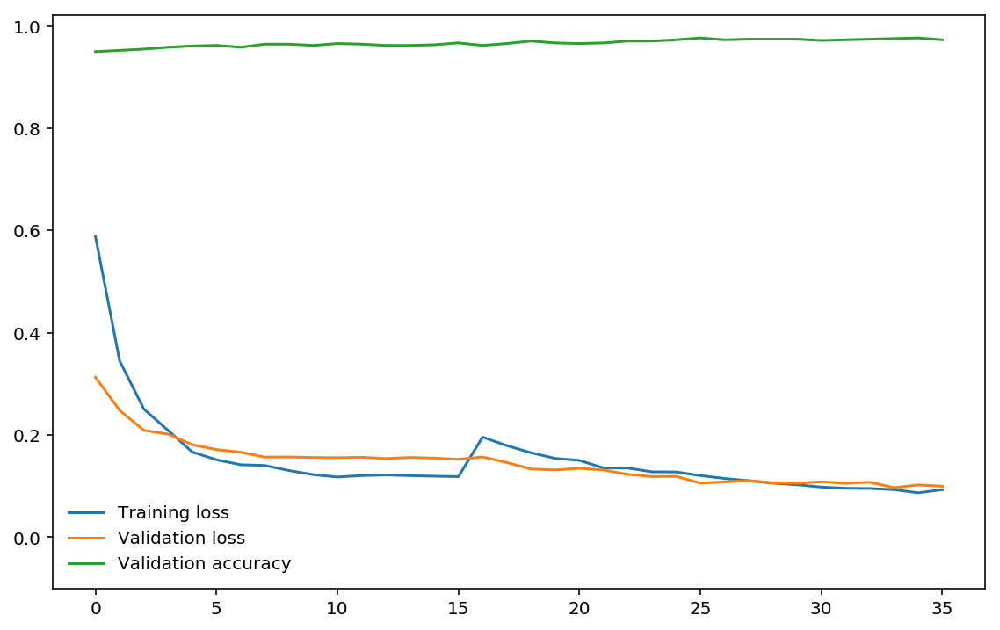

In [92]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[1:], label="Training loss")
plt.plot(valid_losses[1:], label="Validation loss")
plt.plot(val_acc_history[1:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

In [93]:
best_epoch

38

In [94]:
len(valid_losses), len(val_acc_history)

(37, 37)

In [95]:
print(valid_losses[36])
print(val_acc_history[36])
print(lr_hist[36])

0.09974346942015556
0.9731051344743277
[5e-07]


In [96]:
print(valid_losses[26])
print(val_acc_history[26])
print(lr_hist[26])

0.1059735176907192
0.9767726161369193
[1e-06]


### Reloading last best model as previous experiment (below) of resuming stage 2 didn't work

In [97]:
def reloadModelFromUnfrozen(state_dicts_name='resnet152_acc_Two_27_model_and_opt.pth', learning_rate=0.000001, mult=False):
    
    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_epoch, epoch_loss_min
    global model
    global optimizer

    if train_on_gpu:
        state_dicts = torch.load(state_dicts_name)
    else:
        state_dicts = torch.load(state_dicts_name, map_location='cpu')   
    
    model.load_state_dict(state_dicts['model_statedict'])
    model.class_to_idx = state_dicts['class_to_idx']
    
    # Coming from frozen state so load optimizer after unfreezing...
    parameters = filter(lambda p: p.requires_grad, model.parameters())
    optimizer = optim.Adam(parameters, lr=learning_rate)
    # optimizer.load_state_dict(state_dicts['optimizer_statedict'])    
    
    if mult==False:
        for layer in range(4,17):
            unfreeze(model[layer])

        parameters = filter(lambda p: p.requires_grad, model.parameters())
        optimizer = optim.Adam(parameters, lr=learning_rate)
    else:
        for param in model.parameters():
            param.requires_grad = True
            
        optimizer = optim.Adam(
                    [
                        {"params": model[9:].parameters(),  "lr": learning_rate},
                        {"params": model[6:8].parameters(), "lr": learning_rate/10},
                        {"params": model[:6].parameters(),  "lr": learning_rate/100},
                    ],
                    lr=learning_rate,
                )    
    
    # Reloading after unfreezing layers
    optimizer.load_state_dict(state_dicts['optimizer_statedict'])    

    best_epoch = state_dicts['best_epoch']
    
    train_losses = state_dicts['train_losses'][:best_epoch]
    valid_losses = state_dicts['valid_losses'][:best_epoch]
    val_acc_history = state_dicts['val_acc_history'][:best_epoch]
    lr_hist = state_dicts['lr_hist'][:best_epoch]
    
    best_acc = val_acc_history[-1]
    epoch_loss_min = valid_losses[-1]

In [98]:
state_dicts_name = 'resnet152_acc_Two_27_model_and_opt.pth'
learning_rate=1e-06
reloadModelFromUnfrozen(state_dicts_name, learning_rate, mult=False)

In [99]:
best_epoch, len(train_losses), len(valid_losses), len(val_acc_history), len(lr_hist)

(27, 27, 27, 27, 27)

### End of reload block

### Resume from the best accuracy at epoch 27, resetting numbering...

And set learning rate lower, from 1e-06 to 1e-07...

In [100]:
best_model = 'resnet152_acc_Two_30' # but actually corresponds to epoch 27

In [101]:
learning_rate=1e-07
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = optim.Adam(parameters, lr=learning_rate)

In [102]:
exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

In [103]:
best_epoch = 27

In [104]:
train_losses = train_losses[:best_epoch]
valid_losses = valid_losses[:best_epoch]
val_acc_history = val_acc_history[:best_epoch]
lr_hist = lr_hist [:best_epoch]

In [105]:
len(train_losses), len(valid_losses), len(val_acc_history), len(lr_hist)

(27, 27, 27, 27)

In [106]:
val_acc_history[-1]

0.9767726161369193

### End of resume block

In [107]:
use_weights

False

In [108]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=23,
                    first_epoch=28,
                    ufilename="Two_Pt2",
                    is_inception=(model_name=="inception"))

Epoch 28/50
-----------
Learning rate: [1e-06]
train Loss: 0.0767 Acc: 0.9905
valid Loss: 0.1150 Acc: 0.9694

Epoch 29/50
-----------
Learning rate: [1e-06]
train Loss: 0.0716 Acc: 0.9936
valid Loss: 0.1147 Acc: 0.9731

Epoch 30/50
-----------
Learning rate: [1e-06]
train Loss: 0.0680 Acc: 0.9942
valid Loss: 0.1095 Acc: 0.9756

Epoch 31/50
-----------
Learning rate: [1e-06]
train Loss: 0.0641 Acc: 0.9948
valid Loss: 0.1104 Acc: 0.9707

Epoch 32/50
-----------
Learning rate: [1e-06]
train Loss: 0.0635 Acc: 0.9948
valid Loss: 0.1157 Acc: 0.9719

Epoch 33/50
-----------
Learning rate: [1e-06]
train Loss: 0.0564 Acc: 0.9959
valid Loss: 0.1154 Acc: 0.9694

Epoch 34/50
-----------
Learning rate: [1e-06]
train Loss: 0.0573 Acc: 0.9966
valid Loss: 0.1097 Acc: 0.9707

Epoch 35/50
-----------
Learning rate: [1e-06]
train Loss: 0.0549 Acc: 0.9957
valid Loss: 0.1057 Acc: 0.9743
Validation loss decreased (0.105974 --> 0.105720).  Saving model as resnet152_Two_Pt2_35...

Epoch 36/50
-----------
Lear

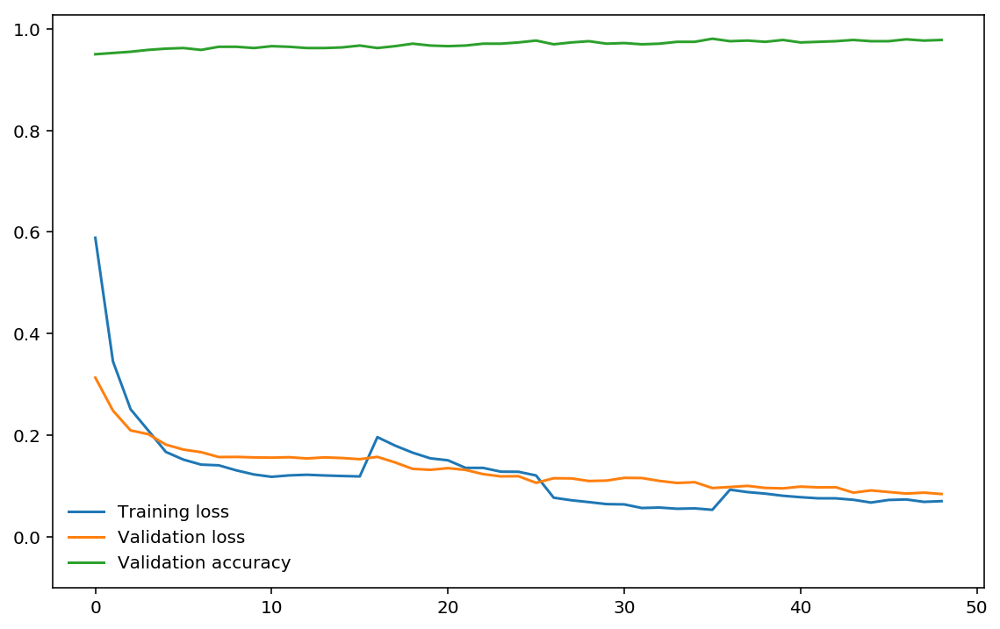

In [109]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[1:], label="Training loss")
plt.plot(valid_losses[1:], label="Validation loss")
plt.plot(val_acc_history[1:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

### Currently epoch 37 is loaded as it was the best for acuracy...

In [110]:
print(valid_losses[36])
print(val_acc_history[36])
print(lr_hist[36])

0.09569300911537301
0.980440097799511
[1e-06]


In [111]:
print(valid_losses[49])
print(val_acc_history[49])
print(lr_hist[49])

0.08389999930607953
0.9779951100244498
[1e-06]


In [112]:
best_epoch = 37

In [113]:
val_acc_history[:best_epoch]

[0.9046454767726161,
 0.9498777506112469,
 0.9523227383863081,
 0.9547677261613692,
 0.9584352078239609,
 0.960880195599022,
 0.9621026894865525,
 0.9584352078239609,
 0.9645476772616137,
 0.9645476772616137,
 0.9621026894865525,
 0.9657701711491442,
 0.9645476772616137,
 0.9621026894865525,
 0.9621026894865525,
 0.9633251833740831,
 0.9669926650366748,
 0.9621026894865525,
 0.9657701711491442,
 0.9706601466992665,
 0.9669926650366748,
 0.9657701711491442,
 0.9669926650366748,
 0.9706601466992665,
 0.9706601466992665,
 0.9731051344743277,
 0.9767726161369193,
 0.9694376528117359,
 0.9731051344743277,
 0.9755501222493888,
 0.9706601466992665,
 0.9718826405867971,
 0.9694376528117359,
 0.9706601466992665,
 0.9743276283618582,
 0.9743276283618582,
 0.980440097799511]

In [114]:
val_acc_history[best_epoch-1:]

[0.980440097799511,
 0.9755501222493888,
 0.9767726161369193,
 0.9743276283618582,
 0.9779951100244498,
 0.9731051344743277,
 0.9743276283618582,
 0.9755501222493888,
 0.9779951100244498,
 0.9755501222493888,
 0.9755501222493888,
 0.9792176039119804,
 0.9767726161369193,
 0.9779951100244498]

### Reset to start again from epoch 37, but try unlocking entire model with differential learning rates...

#### And images at 256

In [115]:
state_dicts_name = 'resnet152_acc_Two_Pt2_37_model_and_opt.pth'
learning_rate=0.0001
reloadModelFromUnfrozen(state_dicts_name, learning_rate, mult=False)

In [116]:
len(train_losses), len(valid_losses), len(val_acc_history), len(lr_hist)

(37, 37, 37, 37)

In [117]:
lr_hist[-1], val_acc_history[-1]

([1e-06], 0.980440097799511)

In [118]:
print("{:.10f}".format(1e-06))

0.0000010000


In [119]:
learning_rate = 0.0001

for param in model.parameters():
    param.requires_grad = True

optimizer = optim.Adam(
            [
                {"params": model[9:].parameters(),  "lr": learning_rate},
                {"params": model[6:8].parameters(), "lr": learning_rate/10},
                {"params": model[:6].parameters(),  "lr": learning_rate/100},
            ],
            lr=learning_rate,
        ) 

In [120]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=23,
                    first_epoch=38,
                    ufilename="Two_Pt3",
                    is_inception=(model_name=="inception"))

Epoch 38/60
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0753 Acc: 0.9878
valid Loss: 0.0892 Acc: 0.9792
Validation loss decreased (0.095693 --> 0.089165).  Saving model as resnet152_Two_Pt3_38...

Epoch 39/60
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0595 Acc: 0.9892
valid Loss: 0.0804 Acc: 0.9829
Accuracy has increased (0.980440 --> 0.982885).  Saving model as resnet152_acc_Two_Pt3_39...
Validation loss decreased (0.089165 --> 0.080389).  Saving model as resnet152_Two_Pt3_39...

Epoch 40/60
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0510 Acc: 0.9913
valid Loss: 0.0746 Acc: 0.9829
Validation loss decreased (0.080389 --> 0.074559).  Saving model as resnet152_Two_Pt3_40...

Epoch 41/60
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0429 Acc: 0.9918
valid Loss: 0.0725 Acc: 0.9817
Validation loss decreased (0.074559 --> 0.072535).  Saving model as resnet152_Two_Pt3_41...

Epoch 42/60
-----------
Learning rate: 

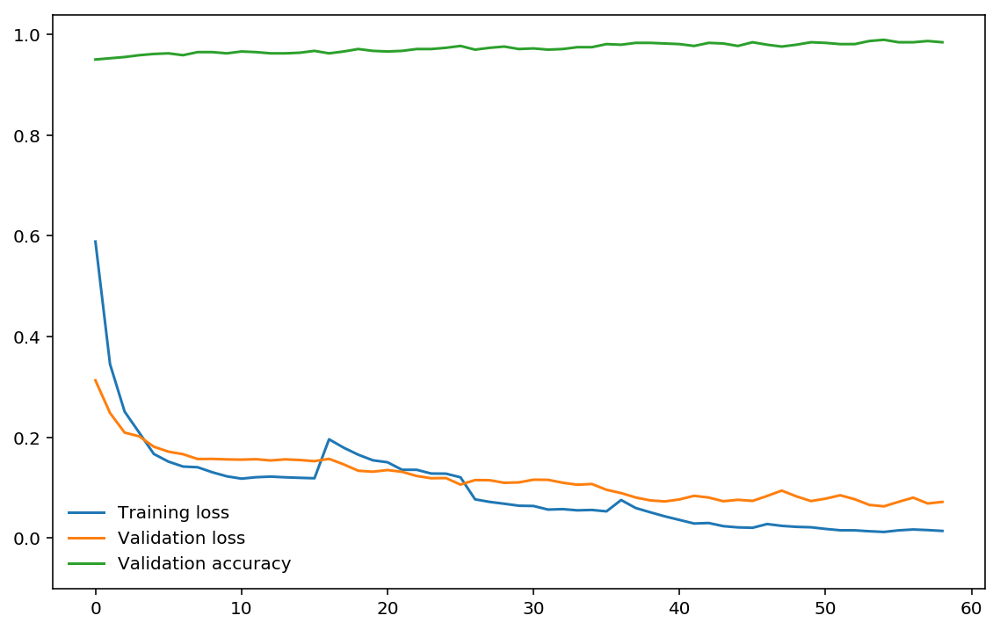

In [121]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[1:], label="Training loss")
plt.plot(valid_losses[1:], label="Validation loss")
plt.plot(val_acc_history[1:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

In [122]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=30,
                    first_epoch=61,
                    ufilename="Two_Pt4",
                    is_inception=(model_name=="inception"))

Epoch 61/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0161 Acc: 0.9963
valid Loss: 0.0617 Acc: 0.9866
Validation loss decreased (0.062847 --> 0.061672).  Saving model as resnet152_Two_Pt4_61...

Epoch 62/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0130 Acc: 0.9969
valid Loss: 0.0689 Acc: 0.9853

Epoch 63/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0139 Acc: 0.9969
valid Loss: 0.0619 Acc: 0.9902
Accuracy has increased (0.988998 --> 0.990220).  Saving model as resnet152_acc_Two_Pt4_63...

Epoch 64/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0134 Acc: 0.9971
valid Loss: 0.0687 Acc: 0.9866

Epoch 65/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0114 Acc: 0.9982
valid Loss: 0.0637 Acc: 0.9902

Epoch 66/90
-----------
Learning rate: [0.0001, 1e-05, 1e-06]
train Loss: 0.0161 Acc: 0.9960
valid Loss: 0.0612 Acc: 0.9878
Validation loss decreased (0.061672 --> 0.061157).  Saving model a

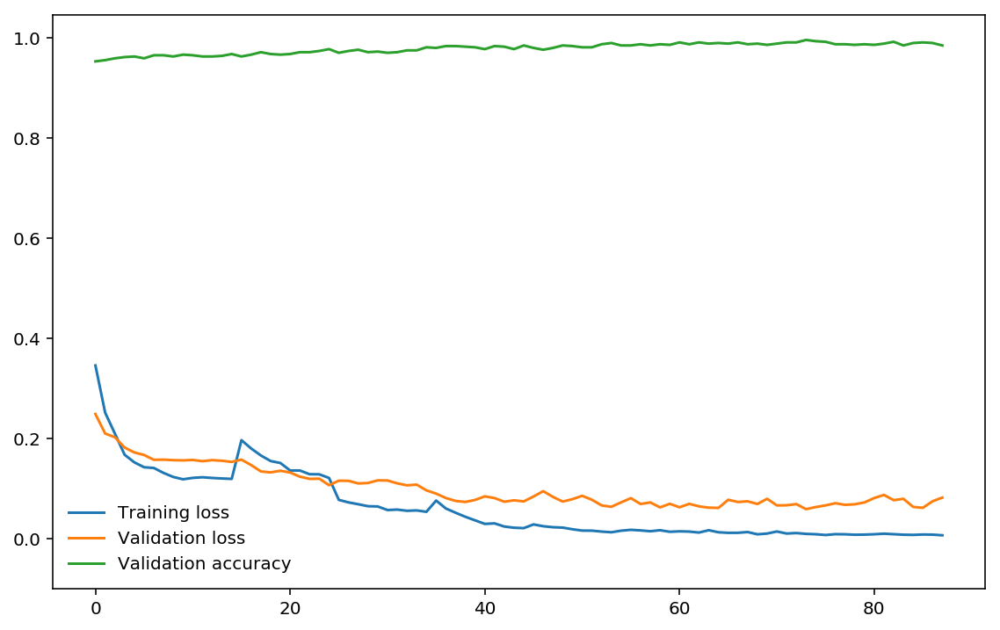

In [123]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

In [124]:
print(valid_losses[75])
print(val_acc_history[75])
print(lr_hist[75])

0.05813202123478747
0.9951100244498777
[0.0001, 1e-05, 1e-06]


In [125]:
print(valid_losses[44])
print(val_acc_history[44])
print(lr_hist[44])

0.07382286323603325
0.9853300733496333
[1.0000000000000002e-06]


In [126]:
print(valid_losses[41])
print(val_acc_history[41])
print(lr_hist[41])

0.07383529947556026
0.988997555012225
[1.0000000000000002e-06]


## Reloading last best model with unfrozen layers for third phase of training

In [127]:
del optimizer

In [128]:
#learning_rate=0.0000008
learning_rate=0.000001
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = optim.Adam(parameters, lr=learning_rate)

In [129]:
def reloadModelForStage3(state_dicts_name='resnet152_acc_Phase2_42_model_and_opt.pth', learning_rate=0.000001, mult=False):
    
    global train_losses, valid_losses, val_acc_history, lr_hist
    global best_acc, best_epoch, epoch_loss_min
    global model
    global optimizer
   
    if train_on_gpu:
        state_dicts = torch.load(state_dicts_name)
    else:
        state_dicts = torch.load(state_dicts_name, map_location='cpu')   
    
    model.load_state_dict(state_dicts['model_statedict'])
    model.class_to_idx = state_dicts['class_to_idx']
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    optimizer.load_state_dict(state_dicts['optimizer_statedict'])    
    
    if mult==False:
        for layer in range(4,17):
            unfreeze(model[layer])

        parameters = filter(lambda p: p.requires_grad, model.parameters())
        optimizer = optim.Adam(parameters, lr=learning_rate)
    else:
        for param in model.parameters():
            param.requires_grad = True
            
        optimizer = optim.Adam(
                    [
                        {"params": model[9:].parameters(),  "lr": 0.00001},
                        {"params": model[6:8].parameters(), "lr": 0.000001},
                        {"params": model[:6].parameters(),  "lr": 0.0000001},
                    ],
                    lr=learning_rate,
                )    
    
    best_epoch = state_dicts['best_epoch']
    
    train_losses = state_dicts['train_losses'][:best_epoch]
    valid_losses = state_dicts['valid_losses'][:best_epoch]
    val_acc_history = state_dicts['val_acc_history'][:best_epoch]
    lr_hist = state_dicts['lr_hist'][:best_epoch]
    
    best_acc = val_acc_history[-1]
    epoch_loss_min = valid_losses[-1]


In [130]:
state_dicts_name = 'resnet152_acc_Phase2_42_model_and_opt.pth'

reloadModelForStage3(state_dicts_name, learning_rate=0.000001, mult=False)

### Reset to unlock all layers and apply differential learning rate

In [131]:
for param in model.parameters():
    param.requires_grad = True

learning_rate = 0.00001

optimizer = optim.Adam(
            [
                {"params": model[9:].parameters(),  "lr": 0.00001},
                {"params": model[6:8].parameters(), "lr": 0.000001},
                {"params": model[:6].parameters(),  "lr": 0.0000001},
            ],
            lr=learning_rate,
        )    


In [132]:
exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [7, 14, 21], gamma=0.1)

In [133]:
exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5, min_lr=0.000001)

In [134]:
print(best_epoch)
print(best_acc)
print(epoch_loss_min)

42
0.988997555012225
0.07383529947556026


In [135]:
print(learning_rate)

1e-05


In [136]:
print(lr_hist)

[[0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [0.0001], [1e-05], [1e-05], [1e-05], [1e-05], [1e-05], [1e-05], [1e-05], [1.0000000000000002e-06], [1.0000000000000002e-06], [1.0000000000000002e-06], [1.0000000000000002e-06], [1.0000000000000002e-06]]


In [137]:
print(len(val_acc_history))
print(val_acc_history)

42
[0.8899755501222494, 0.9242053789731052, 0.9364303178484108, 0.9339853300733496, 0.9437652811735942, 0.941320293398533, 0.9486552567237164, 0.9449877750611246, 0.9535452322738386, 0.9462102689486552, 0.9425427872860636, 0.9364303178484108, 0.9449877750611246, 0.9523227383863081, 0.9596577017114915, 0.9572127139364303, 0.9572127139364303, 0.960880195599022, 0.9547677261613692, 0.9633251833740831, 0.9388753056234719, 0.9498777506112469, 0.9621026894865525, 0.9706601466992665, 0.9498777506112469, 0.9596577017114915, 0.960880195599022, 0.9596577017114915, 0.9669926650366748, 0.9706601466992665, 0.9743276283618582, 0.980440097799511, 0.9853300733496333, 0.9828850855745721, 0.9779951100244498, 0.9792176039119804, 0.980440097799511, 0.9853300733496333, 0.9853300733496333, 0.9816625916870415, 0.9853300733496333, 0.988997555012225]


### End of reloading for third phase

In [138]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=28,
                    first_epoch=43,
                    ufilename="Phase3A",
                    is_inception=(model_name=="inception"))

Epoch 43/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0086 Acc: 0.9979
valid Loss: 0.0749 Acc: 0.9817

Epoch 44/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0064 Acc: 0.9991
valid Loss: 0.0788 Acc: 0.9841

Epoch 45/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0056 Acc: 0.9995
valid Loss: 0.0777 Acc: 0.9866

Epoch 46/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0078 Acc: 0.9982
valid Loss: 0.0719 Acc: 0.9878
Validation loss decreased (0.073835 --> 0.071873).  Saving model as resnet152_Phase3A_46...

Epoch 47/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0072 Acc: 0.9985
valid Loss: 0.0748 Acc: 0.9841

Epoch 48/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0054 Acc: 0.9992
valid Loss: 0.0726 Acc: 0.9878

Epoch 49/70
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0057 Acc: 0.9994
valid Loss: 0.0703 Acc: 0.9890
Validation loss decreased (0.071873 --> 0

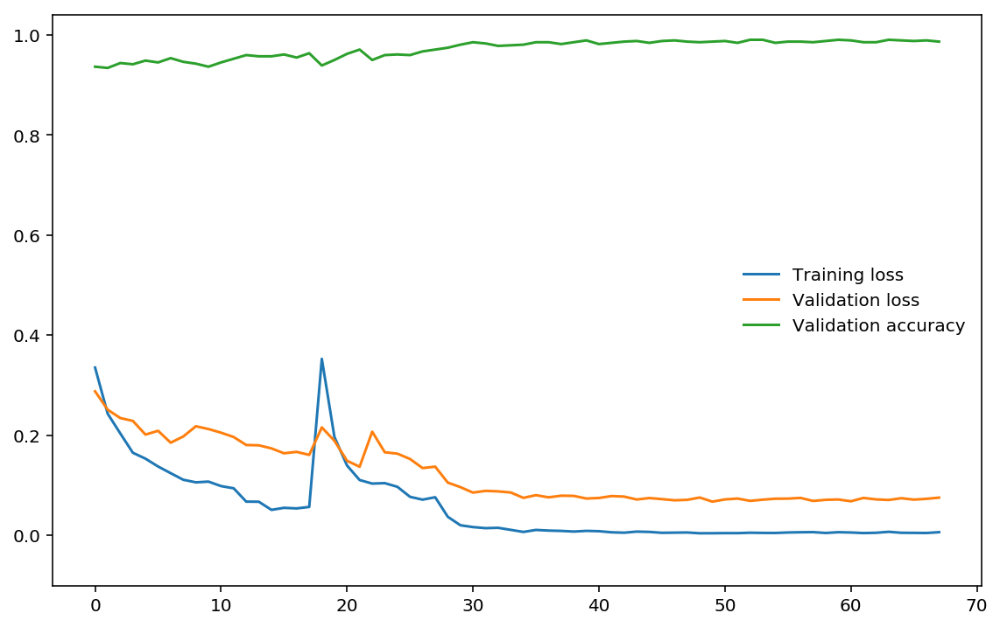

In [139]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

In [140]:
print("{:.10f}".format(1e-05))
print("{:.10f}".format(1e-06))
print("{:.10f}".format(1e-07))

0.0000100000
0.0000010000
0.0000001000


In [141]:
print("{:.10f}".format(1.0000000000000002e-06))
print("{:.10f}".format(1e-07))
print("{:.10f}".format(1e-08))

0.0000010000
0.0000001000
0.0000000100


In [142]:
print("{:.10f}".format(1.0000000000000002e-07))
print("{:.10f}".format(1.0000000000000002e-08))
print("{:.10f}".format(1e-09))

0.0000001000
0.0000000100
0.0000000010


In [143]:
print("{:.10f}".format(1.0000000000000004e-08))
print("{:.10f}".format(1.0000000000000003e-09))
print("{:.10f}".format(1.0000000000000002e-10))

0.0000000100
0.0000000010
0.0000000001


In [144]:
best_epoch

66

In [145]:
print(valid_losses[54])
print(val_acc_history[54])
print(lr_hist[54])

0.06916642072439777
0.9902200488997555
[1.0000000000000002e-06, 1e-07, 1e-08]


In [146]:
print("{:.10f}".format(lr_hist[54][0]))
print("{:.10f}".format(lr_hist[54][1]))
print("{:.10f}".format(lr_hist[54][2]))

0.0000010000
0.0000001000
0.0000000100


In [147]:
print(valid_losses[65])
print(val_acc_history[65])
print(lr_hist[65])

0.0687819327097409
0.9877750611246944
[1.25e-06, 1e-06, 1e-07]


In [148]:
print(valid_losses[41])
print(val_acc_history[41])
print(lr_hist[41])

0.07383529947556026
0.988997555012225
[1.0000000000000002e-06]


## Phase 4 - try and get better with fixed learning rate annealing

In [149]:
for param in model.parameters():
    param.requires_grad = True

learning_rate = 0.000001

optimizer = optim.Adam(
            [
                {"params": model[9:].parameters(),  "lr": 0.000001},
                {"params": model[6:8].parameters(), "lr": 0.0000001},
                {"params": model[:6].parameters(),  "lr": 0.00000001},
            ],
            lr=learning_rate,
        )    


In [150]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=False, 
                    use_weights=use_weights, 
                    num_epochs=30,
                    first_epoch=71,
                    ufilename="Phase4",
                    is_inception=(model_name=="inception"))

Epoch 71/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0052 Acc: 0.9991
valid Loss: 0.0771 Acc: 0.9853

Epoch 72/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0061 Acc: 0.9989
valid Loss: 0.0769 Acc: 0.9853

Epoch 73/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0065 Acc: 0.9989
valid Loss: 0.0718 Acc: 0.9890

Epoch 74/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0059 Acc: 0.9986
valid Loss: 0.0703 Acc: 0.9878

Epoch 75/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0046 Acc: 0.9995
valid Loss: 0.0684 Acc: 0.9890

Epoch 76/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0041 Acc: 0.9994
valid Loss: 0.0743 Acc: 0.9853

Epoch 77/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0048 Acc: 0.9991
valid Loss: 0.0781 Acc: 0.9853

Epoch 78/100
-----------
Learning rate: [1e-06, 1e-07, 1e-08]
train Loss: 0.0062 Acc: 0.9991
valid Loss: 0.0718 Acc: 0.9853



## Phase 5 - repeat Phase 4 but with higher learning rates

In [151]:
learning_rate = 0.00001

optimizer = optim.Adam(
            [
                {"params": model[9:].parameters(),  "lr": 0.00001},
                {"params": model[6:8].parameters(), "lr": 0.000001},
                {"params": model[:6].parameters(),  "lr": 0.0000001},
            ],
            lr=learning_rate,
        )    


In [152]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=False, 
                    use_weights=use_weights, 
                    num_epochs=30,
                    first_epoch=101,
                    ufilename="Phase5",
                    is_inception=(model_name=="inception"))

Epoch 101/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0056 Acc: 0.9991
valid Loss: 0.0724 Acc: 0.9878

Epoch 102/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0043 Acc: 0.9994
valid Loss: 0.0684 Acc: 0.9878

Epoch 103/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0048 Acc: 0.9992
valid Loss: 0.0705 Acc: 0.9878

Epoch 104/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0049 Acc: 0.9992
valid Loss: 0.0732 Acc: 0.9890

Epoch 105/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0039 Acc: 0.9997
valid Loss: 0.0711 Acc: 0.9866

Epoch 106/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0050 Acc: 0.9989
valid Loss: 0.0704 Acc: 0.9878

Epoch 107/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0042 Acc: 0.9994
valid Loss: 0.0717 Acc: 0.9878

Epoch 108/130
-----------
Learning rate: [1e-05, 1e-06, 1e-07]
train Loss: 0.0049 Acc: 0.9986
valid Loss: 0.0702 Acc: 

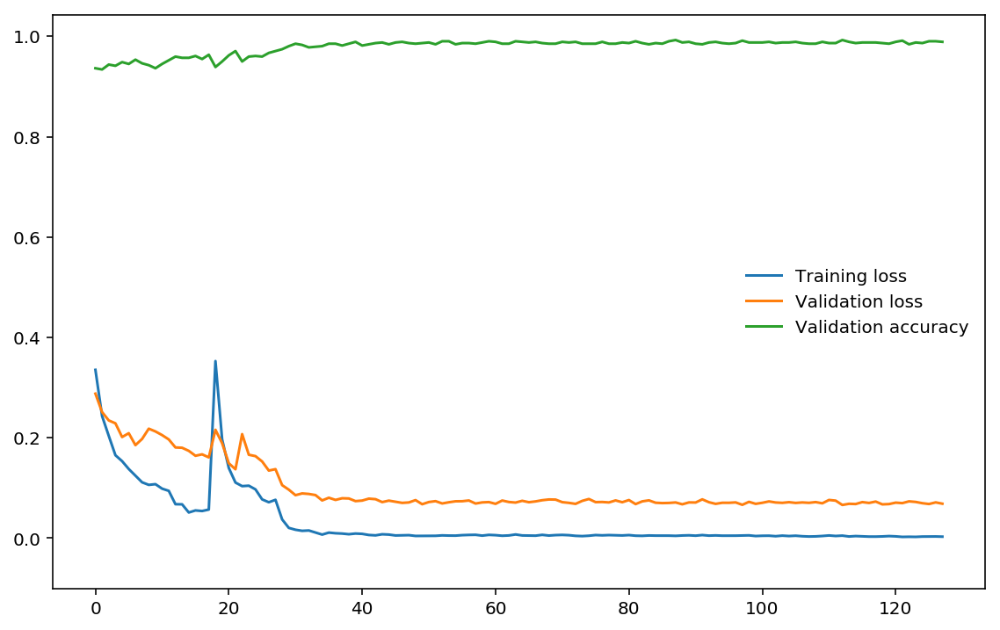

In [153]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

## Phase 6, reload Phase 5, repeat but with larger images and scheduler

In [154]:
state_dicts_name ='resnet152_Phase5_115_model_and_opt.pth'

reloadModelForStage3(state_dicts_name, learning_rate=0.00001, mult=True)

In [155]:
best_epoch, len(lr_hist)

(115, 152)

In [156]:
for param in model.parameters():
            param.requires_grad = True
        
learning_rate = 0.00001

optimizer = optim.Adam(
            [
                {"params": model[9:].parameters(),  "lr": 0.0000001},
                {"params": model[6:8].parameters(), "lr": 0.000000001},
                {"params": model[:6].parameters(),  "lr": 0.0000000001},
            ],
            lr=learning_rate,
        ) 

In [157]:
for param in model.parameters():
    param.requires_grad = False

for layer in range(4,17):
    unfreeze(model[layer])

parameters = filter(lambda p: p.requires_grad, model.parameters())

learning_rate = 0.000001    

optimizer = optim.Adam(parameters, lr=learning_rate)

In [158]:
learning_rate = 1.5e-10 # 0.000001    
parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = optim.Adam(parameters, lr=learning_rate)

In [159]:
exp_lr_scheduler = lr_scheduler.MultiStepLR(optimizer, [7, 14, 21], gamma=0.1)

In [160]:
exp_lr_scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5) # , min_lr=0.000001

In [161]:
train_losses = train_losses[:160]
valid_losses = valid_losses[:160]
val_acc_history = val_acc_history[:160]
lr_hist = lr_hist[:160]

In [162]:
model = train_model(model, 
                    criterion, 
                    optimizer,
                    exp_lr_scheduler, 
                    use_scheduler=True, 
                    use_weights=use_weights, 
                    num_epochs=20,
                    first_epoch=201,
                    ufilename="Phase6_224_4",
                    is_inception=(model_name=="inception"))

Epoch 201/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0502 Acc: 0.9852
valid Loss: 0.0713 Acc: 0.9890

Epoch 202/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0519 Acc: 0.9850
valid Loss: 0.0724 Acc: 0.9878

Epoch 203/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0467 Acc: 0.9861
valid Loss: 0.0732 Acc: 0.9902

Epoch 204/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0518 Acc: 0.9847
valid Loss: 0.0748 Acc: 0.9890

Epoch 205/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0489 Acc: 0.9866
valid Loss: 0.0700 Acc: 0.9866

Epoch 206/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0497 Acc: 0.9863
valid Loss: 0.0734 Acc: 0.9866

Epoch 207/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0483 Acc: 0.9861
valid Loss: 0.0710 Acc: 0.9878

Epoch 208/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0561 Acc: 0.9844
valid Loss: 0.0685 Acc: 0.9914

Epoch 209/220
-----------
Learning rate: [1.5e-09]
train Loss: 0.0512 Acc: 0.9855
valid 

In [163]:
print("{:.10f}".format(1.5625e-08))
print("{:.10f}".format(1e-08))
print("{:.10f}".format(1.5e-09))
print("{:.10f}".format(1e-09))

0.0000000156
0.0000000100
0.0000000015
0.0000000010


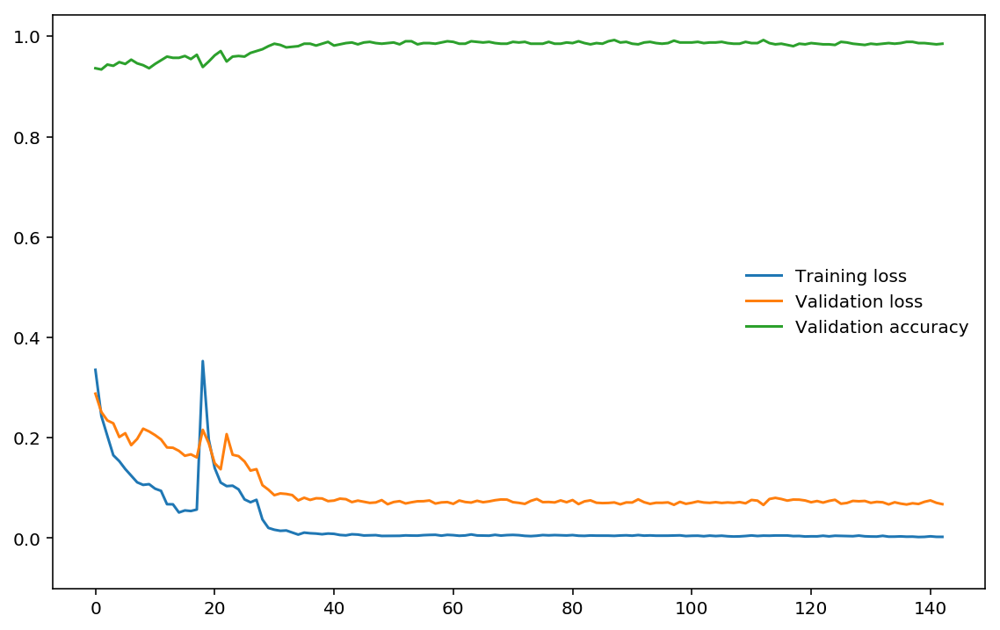

In [164]:
plt.rcParams['figure.figsize'] = [9.5, 6]

plt.plot(train_losses[2:], label="Training loss")
plt.plot(valid_losses[2:], label="Validation loss")
plt.plot(val_acc_history[2:], label="Validation accuracy")
plt.legend(frameon=False)
plt.ylim(ymin=-0.1) 
plt.show()

## Save checkpoint

In [165]:
def compare_dicts(dict_1, dict_2):
    dicts_differ = 0
    for key_item_1, key_item_2 in zip(dict_1.items(), dict_2.items()):
        if torch.equal(key_item_1[1], key_item_2[1]):
            pass
        else:
            dicts_differ += 1
            if (key_item_1[0] == key_item_2[0]):
                print('Mismtach found at', key_item_1[0])
            else:
                raise Exception
                
    if dicts_differ == 0:
        print('State_Dicts match perfectly! :)')

In [166]:
state_dict = torch.load('resnet152_acc_Two_Pt4_76.pt')
opt_state_dict = torch.load('resnet152_acc_Two_Pt4_76_optimizer.pt')

In [167]:
state_dict = torch.load('resnet152_acc_Two_Pt3_56.pt')
opt_state_dict = torch.load('resnet152_acc_Two_Pt3_56_optimizer.pt')

In [168]:
state_dict = torch.load('resnet152_acc_Two_Pt2_37.pt')
opt_state_dict = torch.load('resnet152_acc_Two_Pt2_37_optimizer.pt')

In [169]:
state_dict = torch.load('resnet152_acc_Two_30.pt')
opt_state_dict = torch.load('resnet152_acc_Two_30_optimizer.pt')

In [170]:
state_dict = torch.load('resnet152_acc_One_17.pt')
opt_state_dict = torch.load('resnet152_acc_One_17_optimizer.pt')

In [171]:
state_dict = torch.load('resnet152_acc_Step_One_16.pt')
opt_state_dict = torch.load('resnet152_acc_Step_One_16_optimizer.pt')

In [172]:
state_dict = torch.load('resnet152_acc_Phase_One_18.pt')
opt_state_dict = torch.load('resnet152_acc_Phase_One_18_optimizer.pt')

In [173]:
state_dict = torch.load('resnet152_Phase5_115.pt')
opt_state_dict = torch.load('resnet152_Phase5_115_optimizer.pt')

In [174]:
state_dict = torch.load('resnet152_acc_Phase4_90.pt')
opt_state_dict = torch.load('resnet152_acc_Phase4_90_optimizer.pt')

In [175]:
state_dict = torch.load('resnet152_acc_Phase3A_55.pt')
opt_state_dict = torch.load('resnet152_acc_Phase3A_55_optimizer.pt')

In [176]:
state_dict = torch.load('resnet152_Phase3_66.pt')
opt_state_dict = torch.load('resnet152_Phase3_66_optimizer.pt')

In [177]:
state_dict = torch.load('resnet152_acc_Phase2_42.pt')
opt_state_dict  = torch.load('resnet152_acc_Phase2_42_optimizer.pt')

In [178]:
state_dict = torch.load('resnet152_acc_schd_wgts_20.pt')
opt_state_dict  = torch.load('resnet152_acc_schd_wgts_20_optimizer.pt')

In [179]:
compare_dicts(model.state_dict(), state_dict)

State_Dicts match perfectly! :)


In [180]:
checkpt = 'resnet152_acc_Two_Pt4_76_model_and_opt.pth'

In [181]:
checkpt = 'resnet152_acc_Two_Pt3_56_model_and_opt.pth'

In [182]:
checkpt = 'resnet152_acc_Two_Pt2_37_model_and_opt.pth'

In [183]:
# The state files are numbered 30 but really epoch was 27
checkpt = 'resnet152_acc_Two_27_model_and_opt.pth'

In [184]:
checkpt = 'resnet152_acc_One_17_model_and_opt.pth'

In [185]:
checkpt = 'resnet152_acc_Step_One_16_model_and_opt.pth'

In [186]:
checkpt = 'resnet152_acc_Phase_One_18_model_and_opt.pth'

In [187]:
checkpt = 'resnet152_Phase5_115_model_and_opt.pth'

In [188]:
checkpt = 'resnet152_acc_Phase4_90_model_and_opt.pth'

In [189]:
checkpt = 'resnet152_acc_Phase3A_55_model_and_opt.pth'

In [190]:
checkpt = 'resnet152_Phase3_66_model_and_opt.pth'

In [191]:
checkpt = 'resnet152_acc_Phase2_42_model_and_opt.pth'

In [192]:
checkpt = 'resnet152_acc_schd_wgts_20_model_and_opt.pth'

In [193]:
model.class_to_idx = image_datasets['train'].class_to_idx

In [194]:
best_epoch = 76 # 56

In [195]:
best_epoch

76

In [196]:
torch.save({'model_statedict':model.state_dict(),
            'optimizer_statedict':optimizer.state_dict(), 
            'class_to_idx' : model.class_to_idx,
            'best_epoch'   : best_epoch,
            'train_losses' : train_losses, 
            'valid_losses' : valid_losses, 
            'val_acc_history' : val_acc_history, 
            'lr_hist'      : lr_hist}, 
           checkpt)

## Loading the checkpoint

In [197]:
state_dicts_name = 'resnet152_acc_Two_Pt4_76_model_and_opt.pth'

In [198]:
state_dicts_name = 'resnet152_acc_Two_Pt3_56_model_and_opt.pth'

In [199]:
state_dicts_name = 'resnet152_acc_Two_Pt2_37_model_and_opt.pth'

In [200]:
state_dicts_name = 'resnet152_acc_Two_27_model_and_opt.pth'

In [201]:
state_dicts_name = 'resnet152_acc_One_17_model_and_opt.pth'

In [202]:
state_dicts_name = 'resnet152_acc_Step_One_16_model_and_opt.pth'

In [203]:
state_dicts_name = 'resnet152_acc_Phase_One_18_model_and_opt.pth'

In [204]:
# Best from original project...
state_dicts_name = 'resnet152_acc_LROnPlateau_78_model_and_opt.pth'

In [205]:
state_dicts_name = 'resnet152_Phase5_115_model_and_opt.pth'

In [206]:
state_dicts_name ='resnet152_acc_Phase4_90_model_and_opt.pth'

In [207]:
state_dicts_name = 'resnet152_acc_Phase3A_55_model_and_opt.pth'

In [208]:
state_dicts_name = 'resnet152_Phase3_66_model_and_opt.pth'

In [209]:
state_dicts_name = 'resnet152_acc_Phase2_42_model_and_opt.pth' 

In [210]:
state_dicts_name = 'resnet152_acc_schd_wgts_20_model_and_opt.pth' 

In [211]:
if train_on_gpu:
    state_dicts = torch.load(state_dicts_name)
else:
    state_dicts = torch.load(state_dicts_name, map_location='cpu')

In [212]:
state_dicts_name

'resnet152_acc_One_17_model_and_opt.pth'

In [213]:
state_dicts.keys()

dict_keys(['model_statedict', 'optimizer_statedict', 'class_to_idx', 'best_epoch', 'train_losses', 'valid_losses', 'val_acc_history', 'lr_hist'])

In [214]:
model.load_state_dict(state_dicts['model_statedict'])

In [215]:
optimizer.load_state_dict(state_dicts['optimizer_statedict'])

In [216]:
model.class_to_idx = state_dicts['class_to_idx']

In [217]:
best_epoch = state_dicts['best_epoch']

In [218]:
best_epoch

17

In [219]:
state_dicts['lr_hist']

[[0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [0.0001],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000003e-05],
 [1.0000000000000002e-06],
 [1.0000000000000002e-06],
 [1.0000000000000002e-06],
 [1.0000000000000002e-06],
 [1.0000000000000002e-06]]

In [220]:
state_dicts['val_acc_history']

[0.9046454767726161,
 0.9498777506112469,
 0.9523227383863081,
 0.9547677261613692,
 0.9584352078239609,
 0.960880195599022,
 0.9621026894865525,
 0.9584352078239609,
 0.9645476772616137,
 0.9645476772616137,
 0.9621026894865525,
 0.9657701711491442,
 0.9645476772616137,
 0.9621026894865525,
 0.9621026894865525,
 0.9633251833740831,
 0.9669926650366748,
 0.9669926650366748,
 0.9633251833740831,
 0.9621026894865525]

In [221]:
train_losses = state_dicts['train_losses']
valid_losses = state_dicts['valid_losses']
val_acc_history = state_dicts['val_acc_history']
lr_hist = state_dicts['lr_hist']

In [222]:
train_losses_bak = copy.deepcopy(train_losses)
valid_losses_bak = copy.deepcopy(valid_losses)
val_acc_history_bak = copy.deepcopy(val_acc_history)
lr_hist_bak = copy.deepcopy(lr_hist)

In [223]:
train_losses = train_losses[:best_epoch]
valid_losses = valid_losses[:best_epoch]
val_acc_history = val_acc_history[:best_epoch]
lr_hist = lr_hist [:best_epoch]

# Evaluation

## Evaluate model - method 1 - validation data

In [224]:
# track test loss 
# over 102 flower classes
test_loss = 0.0
class_correct = list(0. for i in range(102))
class_total = list(0. for i in range(102))

model.to(device)
model.eval() # eval mode

with torch.no_grad():
    # iterate over test data
    for data, target in dataloaders['valid']:

        # move tensors to GPU if CUDA is available
        data, target = data.to(device), target.to(device)

        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)

        # calculate the batch loss
        loss = criterion(output, target)

        # update  test loss 
        test_loss += loss.item() * (1 if use_weights==True else data.size(0))
        
        # print(loss.item(), loss.item() * (1 if use_weights==True else data.size(0)), test_loss)
        
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)    

        # compare predictions to true label
        correct_tensor = pred.eq(target.data.view_as(pred))
        correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())

        # calculate test accuracy for each object class
        for i in range(batch_size):
            if target.data.size(0) > i:
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1
                
# calculate avg test loss
test_loss = test_loss/len(dataloaders['valid'].dataset)          

In [225]:
valid_accuracy_result = []

for i in range(102):
    if class_total[i] > 0:
        valid_accuracy_result.append([idx_to_class[i], cat_to_name[idx_to_class[i]], 
                                np.sum(class_correct[i]), np.sum(class_total[i]),
                                100 * class_correct[i] / class_total[i]])
    else:
        print('Valid Accuracy of %5s: N/A (no training examples)' % (classes[i]))

In [226]:
print(state_dicts_name)
print()
print('Report on Valid dataset')
print('-----------------------')
print('Best Epoch: {}'.format(best_epoch))
print('Validation Loss: {:.6f}'.format(test_loss))
print('\nValidation Accuracy (Overall): %0.2f%% (%2d/%2d)\n' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

sorted_valid_accuracy = sorted(valid_accuracy_result, key=lambda x: int(x[0]))
print('Accuracy per class: ')
for res in sorted_valid_accuracy:
    print('{:<3} {:<30} {:>5}/{:<10} {:>10.2f}%'.format(res[0], res[1], res[2].astype(int), res[3].astype(int), res[4]))

resnet152_acc_Two_Pt4_76_model_and_opt.pth

Report on Valid dataset
-----------------------
Best Epoch: 76
Validation Loss: 0.058132

Validation Accuracy (Overall): 99.51% (814/818)

Accuracy per class: 
1   pink primrose                      8/8              100.00%
2   hard-leaved pocket orchid          6/6              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          6/6              100.00%
5   english marigold                   7/7              100.00%
6   tiger lily                         1/1              100.00%
7   moon orchid                        0/1                0.00%
8   bird of paradise                   5/5              100.00%
9   monkshood                          3/3              100.00%
10  globe thistle                      4/4              100.00%
11  snapdragon                        10/10             100.00%
12  colt's foot                        5/5              100.00%
13  king protea             

### Phase one: 
```
resnet152_acc_One_17_model_and_opt.pth

Report on Valid dataset
-----------------------
Best Epoch: 17
Validation Loss: 0.152514

Validation Accuracy (Overall): 96.70% (791/818)

Accuracy per class: 
1   pink primrose                      8/8              100.00%
2   hard-leaved pocket orchid          6/6              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          4/6               66.67%
5   english marigold                   7/7              100.00%
6   tiger lily                         1/1              100.00%
7   moon orchid                        1/1              100.00%
8   bird of paradise                   5/5              100.00%
9   monkshood                          3/3              100.00%
10  globe thistle                      4/4              100.00%
11  snapdragon                        10/10             100.00%
12  colt's foot                        5/5              100.00%
13  king protea                        5/5              100.00%
14  spear thistle                      1/1              100.00%
15  yellow iris                        7/7              100.00%
16  globe-flower                       2/2              100.00%
17  purple coneflower                 16/16             100.00%
18  peruvian lily                     11/11             100.00%
19  balloon flower                     4/4              100.00%
20  giant white arum lily              6/7               85.71%
21  fire lily                          4/4              100.00%
22  pincushion flower                  8/8              100.00%
23  fritillary                        12/12             100.00%
24  red ginger                         5/5              100.00%
25  grape hyacinth                     2/2              100.00%
26  corn poppy                         3/3              100.00%
27  prince of wales feathers           1/1              100.00%
28  stemless gentian                   5/5              100.00%
29  artichoke                          7/7              100.00%
30  sweet william                      8/10              80.00%
31  carnation                          2/2              100.00%
32  garden phlox                       3/3              100.00%
33  love in the mist                   6/7               85.71%
34  mexican aster                      7/7              100.00%
35  alpine sea holly                   3/4               75.00%
36  ruby-lipped cattleya               4/6               66.67%
37  cape flower                        8/8              100.00%
38  great masterwort                   4/4              100.00%
39  siam tulip                         3/3              100.00%
40  lenten rose                        5/5              100.00%
41  barbeton daisy                    16/16             100.00%
42  daffodil                           6/6              100.00%
43  sword lily                        13/14              92.86%
44  poinsettia                         9/9              100.00%
45  bolero deep blue                   4/4              100.00%
46  wallflower                        17/18              94.44%
47  marigold                           3/3              100.00%
48  buttercup                          7/9               77.78%
49  oxeye daisy                        8/8              100.00%
50  common dandelion                  11/11             100.00%
51  petunia                           27/28              96.43%
52  wild pansy                        10/10             100.00%
53  primula                            7/9               77.78%
54  sunflower                         10/10             100.00%
55  pelargonium                        8/8              100.00%
56  bishop of llandaff                 9/9              100.00%
57  gaura                              6/6              100.00%
58  geranium                          14/14             100.00%
59  orange dahlia                      4/4              100.00%
60  pink-yellow dahlia                14/14             100.00%
61  cautleya spicata                   6/6              100.00%
62  japanese anemone                   3/3              100.00%
63  black-eyed susan                   8/8              100.00%
64  silverbush                         5/5              100.00%
65  californian poppy                  7/7              100.00%
66  osteospermum                       6/6              100.00%
67  spring crocus                      2/2              100.00%
68  bearded iris                       7/8               87.50%
69  windflower                         5/5              100.00%
70  tree poppy                         7/7              100.00%
71  gazania                            4/5               80.00%
72  azalea                             8/8              100.00%
73  water lily                        19/19             100.00%
74  rose                              14/15              93.33%
75  thorn apple                       12/12             100.00%
76  morning glory                     18/20              90.00%
77  passion flower                    21/21             100.00%
78  lotus                             11/11             100.00%
79  toad lily                          4/4              100.00%
80  anthurium                         12/12             100.00%
81  frangipani                        18/18             100.00%
82  clematis                          13/13             100.00%
83  hibiscus                          13/13             100.00%
84  columbine                         10/10             100.00%
85  desert-rose                        5/5              100.00%
86  tree mallow                        4/5               80.00%
87  magnolia                           6/6              100.00%
88  cyclamen                          24/25              96.00%
89  watercress                        16/16             100.00%
90  canna lily                         2/2              100.00%
91  hippeastrum                        9/9              100.00%
92  bee balm                           2/2              100.00%
93  ball moss                          5/6               83.33%
94  foxglove                          14/14             100.00%
95  bougainvillea                     13/13             100.00%
96  camellia                           8/10              80.00%
97  mallow                             7/7              100.00%
98  mexican petunia                   10/10             100.00%
99  bromelia                           5/6               83.33%
100 blanket flower                     6/6              100.00%
101 trumpet creeper                    5/5              100.00%
102 blackberry lily                    6/6              100.00%
```

**After Phase 3, at 224x224** 
```
resnet152_Phase3_66_model_and_opt.pth

Report on Valid dataset
-----------------------
Best Epoch: 66
Validation Loss: 0.073239

Validation Accuracy (Overall): 98.90% (809/818)
```
**After Phase 3, at 256x256** 
```
Report on Valid dataset
-----------------------
Best Epoch: 66
Validation Loss: 0.082188

Validation Accuracy (Overall): 98.29% (804/818)
```

## Evaluate model - method 1 - test data

In [227]:
# track test loss 
# over 102 flower classes
test_loss = 0.0
class_correct = list(0. for i in range(102))
class_total = list(0. for i in range(102))

model.to(device)
model.eval() # eval mode

with torch.no_grad():
    # iterate over test data
    for data, target in dataloaders['test']:

        # move tensors to GPU if CUDA is available
        data, target = data.to(device), target.to(device)

        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)

        # calculate the batch loss
        loss = criterion(output, target)
        
        # update  test loss 
        test_loss += loss.item() * (1 if use_weights==True else data.size(0))
        
        # convert output probabilities to predicted class
        _, pred = torch.max(output, 1)    

        # compare predictions to true label
        correct_tensor = pred.eq(target.data.view_as(pred))
        correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())

        # calculate test accuracy for each object class
        for i in range(batch_size):
            if target.data.size(0) > i:
                label = target.data[i]
                class_correct[label] += correct[i].item()
                class_total[label] += 1

# calculate avg test loss
test_loss = test_loss/len(dataloaders['test'].dataset)

In [228]:
test_accuracy_result = []

for i in range(102):
    if class_total[i] > 0:
        test_accuracy_result.append([idx_to_class[i], cat_to_name[idx_to_class[i]], 
                                np.sum(class_correct[i]), np.sum(class_total[i]),
                                100 * class_correct[i] / class_total[i]])
    else:
        print('Test Accuracy of %5s: N/A (no test examples)' % (classes[i]))

In [229]:
print(state_dicts_name)
print()
print('Report on Test dataset')
print('----------------------')
print('Best Epoch: {}'.format(best_epoch))
print('Test Loss: {:.6f}'.format(test_loss))
print('\nTest Accuracy (Overall): %0.2f%% (%2d/%2d)\n' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

sorted_test_accuracy = sorted(test_accuracy_result, key=lambda x: int(x[0]))
print('Accuracy per class: ')
for res in sorted_test_accuracy:
    print('{:<3} {:<30} {:>5}/{:<10} {:>10.2f}%'.format(res[0], res[1], res[2].astype(int), res[3].astype(int), res[4]))

resnet152_acc_Two_Pt4_76_model_and_opt.pth

Report on Test dataset
----------------------
Best Epoch: 76
Test Loss: 0.060279

Test Accuracy (Overall): 99.15% (812/819)

Accuracy per class: 
1   pink primrose                      5/5              100.00%
2   hard-leaved pocket orchid          5/5              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          5/6               83.33%
5   english marigold                   4/4              100.00%
6   tiger lily                         9/9              100.00%
7   moon orchid                        6/6              100.00%
8   bird of paradise                  10/10             100.00%
9   monkshood                          2/2              100.00%
10  globe thistle                      3/3              100.00%
11  snapdragon                         9/9              100.00%
12  colt's foot                        9/9              100.00%
13  king protea                        6/6

### Phase One:
```
resnet152_acc_One_17_model_and_opt.pth

Report on Test dataset
----------------------
Best Epoch: 17
Test Loss: 0.205814

Test Accuracy (Overall): 94.99% (778/819)

Accuracy per class: 
1   pink primrose                      4/5               80.00%
2   hard-leaved pocket orchid          5/5              100.00%
3   canterbury bells                   2/2              100.00%
4   sweet pea                          2/6               33.33%
5   english marigold                   4/4              100.00%
6   tiger lily                         9/9              100.00%
7   moon orchid                        5/6               83.33%
8   bird of paradise                  10/10             100.00%
9   monkshood                          2/2              100.00%
10  globe thistle                      3/3              100.00%
11  snapdragon                         8/9               88.89%
12  colt's foot                        8/9               88.89%
13  king protea                        4/6               66.67%
14  spear thistle                      3/3              100.00%
15  yellow iris                        4/4              100.00%
16  globe-flower                       3/3              100.00%
17  purple coneflower                  9/9              100.00%
18  peruvian lily                      6/6              100.00%
19  balloon flower                     6/7               85.71%
20  giant white arum lily              1/3               33.33%
21  fire lily                          2/2              100.00%
22  pincushion flower                  4/4              100.00%
23  fritillary                         7/7              100.00%
24  red ginger                         2/2              100.00%
25  grape hyacinth                     5/5              100.00%
26  corn poppy                         4/5               80.00%
27  prince of wales feathers           3/3              100.00%
28  stemless gentian                   6/6              100.00%
29  artichoke                          8/9               88.89%
30  sweet william                     14/14             100.00%
31  carnation                          1/2               50.00%
32  garden phlox                       6/6              100.00%
33  love in the mist                   7/8               87.50%
34  mexican aster                      4/5               80.00%
35  alpine sea holly                   5/6               83.33%
36  ruby-lipped cattleya               7/7              100.00%
37  cape flower                        7/8               87.50%
38  great masterwort                   8/8              100.00%
39  siam tulip                         5/5              100.00%
40  lenten rose                        5/8               62.50%
41  barbeton daisy                    14/14             100.00%
42  daffodil                           4/4              100.00%
43  sword lily                        15/16              93.75%
44  poinsettia                        11/11             100.00%
45  bolero deep blue                   3/3              100.00%
46  wallflower                        21/21             100.00%
47  marigold                           3/3              100.00%
48  buttercup                          5/5              100.00%
49  oxeye daisy                        3/3              100.00%
50  common dandelion                   7/8               87.50%
51  petunia                           22/24              91.67%
52  wild pansy                         8/8              100.00%
53  primula                           11/14              78.57%
54  sunflower                          3/4               75.00%
55  pelargonium                        7/7              100.00%
56  bishop of llandaff                 8/8              100.00%
57  gaura                             11/11             100.00%
58  geranium                          14/14             100.00%
59  orange dahlia                      7/7              100.00%
60  pink-yellow dahlia                10/10             100.00%
61  cautleya spicata                   8/8              100.00%
62  japanese anemone                   3/4               75.00%
63  black-eyed susan                   4/4              100.00%
64  silverbush                         5/5              100.00%
65  californian poppy                  7/7              100.00%
66  osteospermum                       4/4              100.00%
67  spring crocus                      4/4              100.00%
68  bearded iris                       3/3              100.00%
69  windflower                         3/3              100.00%
70  tree poppy                         4/4              100.00%
71  gazania                            9/9              100.00%
72  azalea                            10/11              90.91%
73  water lily                        28/28             100.00%
74  rose                              14/14             100.00%
75  thorn apple                       13/13             100.00%
76  morning glory                      3/4               75.00%
77  passion flower                    25/25             100.00%
78  lotus                             14/14             100.00%
79  toad lily                          3/3              100.00%
80  anthurium                         11/11             100.00%
81  frangipani                        13/13             100.00%
82  clematis                          17/17             100.00%
83  hibiscus                          13/14              92.86%
84  columbine                         10/10             100.00%
85  desert-rose                        9/10              90.00%
86  tree mallow                        5/5              100.00%
87  magnolia                           6/6              100.00%
88  cyclamen                          13/13             100.00%
89  watercress                        15/15             100.00%
90  canna lily                        13/14              92.86%
91  hippeastrum                        8/8              100.00%
92  bee balm                          11/11             100.00%
93  ball moss                          6/6              100.00%
94  foxglove                          16/16             100.00%
95  bougainvillea                     14/14             100.00%
96  camellia                           7/9               77.78%
97  mallow                             4/5               80.00%
98  mexican petunia                    3/4               75.00%
99  bromelia                           7/7              100.00%
100 blanket flower                     8/8              100.00%
101 trumpet creeper                    4/4              100.00%
102 blackberry lily                    6/6              100.00%

resnet152_acc_LROnPlateau_78_model_and_opt.pth
```

**Best from original training**
```
resnet152_acc_LROnPlateau_78_model_and_opt.pth

Report on Test dataset
----------------------
Test Loss: 0.073412

Test Accuracy (Overall): 98.66% (808/819)
```

**After Phase 3, at 224x224** 
```
resnet152_Phase3_66_model_and_opt.pth

Report on Test dataset
----------------------
Best Epoch: 66
Test Loss: 0.068545

Test Accuracy (Overall): 98.17% (804/819)
```
**After Phase 3, at 256x256** 
```
resnet152_Phase3_66_model_and_opt.pth

Report on Test dataset
----------------------
Best Epoch: 66
Test Loss: 0.072878

Test Accuracy (Overall): 97.80% (801/819)
```

## Evaluate model - method 2

In [230]:
class_name_map = np.vectorize(lambda x: cat_to_name[x])

In [131]:
def analyze_accuracy(model, device, idx_to_class, class_name_map, dataloaders, data, inclpath=False):
    model.eval()
    model.to(device) 

    image_matches = []
    
    result = pd.DataFrame.from_dict(idx_to_class, orient="index").rename(columns={0: "class"})
    result["class_name"] = result["class"].apply(class_name_map)
    result["count"] = 0
    result["correct"] = 0
    
    iteration = 0
    
    pathstr = ""
    
    if data == "valid":
        pathstr = str.replace(valid_dir, "/", "\\")
    elif data == "test":
        pathstr = str.replace(test_dir, "/", "\\")
    elif data == "testset":
        pathstr = str.replace(testset_subdir, "/", "\\")
 
    global state_dicts_name
    
    print(state_dicts_name)
    print('-' * 80)
    print()

    with torch.no_grad():
        for dataload in dataloaders[data]:
            data = dataload[0]
            target = dataload[1]
            paths = None if len(dataload) == 2 else dataload[2]
            
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, pred = torch.max(output, 1)
            
            equality = (target.data == pred)

            np_labels = target.cpu().numpy()
            result["count"] = result["count"].add(pd.Series(np_labels).value_counts(), fill_value=0)
            result["correct"] = result["correct"].add(pd.Series(np_labels[np.where(equality)]).value_counts(), fill_value=0)
                
            iteration += 1

            print("Iteration {}".format(iteration))
            print("------------")
            print("Labels:")
            print(target.data)
            print("Predictions:")
            print(pred)
            print("Equality:")
            print(equality)
            if paths is not None:
                print("Mismatched Image File Names:")
                for i in range(len(target.data)):
                    image_arr = [str.replace(paths[i], pathstr, '' if inclpath==False else pathstr), 
                                 idx_to_class[pred[i].item()], 
                                 idx_to_class[target.data[i].item()],
                                 "Mismatch" if idx_to_class[pred[i].item()] != idx_to_class[target.data[i].item()] else ""
                                ]
                    image_matches.append(image_arr)
                    if equality[i] == 0:
                        print(str.replace(paths[i], pathstr, ''))
                print()
                
    image_matches = pd.DataFrame(image_matches, columns = ["Image", "Prediction", "Label", "Status"])
    
    print()
    print()
    print(state_dicts_name)
    print('-' * 50)
    result["accuracy"] = result["correct"] / result["count"]
    print("Top 5 class")
    display(result.sort_values("accuracy", ascending=False).head())
    print("Bottom 5 class")
    display(result.sort_values("accuracy", ascending=False).tail())
    overall_accuracy = result["correct"].sum() / result["count"].sum()
    print(f"Overall Accuracy: {overall_accuracy:.2%}")
    
    return (result, image_matches)

### Evaluate model - method 2 - valid data

In [232]:
idx_to_class_valid = {v:k for k, v in image_datasets["valid"].class_to_idx.items()}

In [233]:
valid_result, valid_images = analyze_accuracy(model, device, 
                          idx_to_class_valid, 
                          class_name_map, 
                          dataloaders, "valid")

resnet152_acc_Two_Pt4_76_model_and_opt.pth
--------------------------------------------------------------------------------

Iteration 1
------------
Labels:
tensor([86, 82, 82, 43, 46, 31, 18, 49, 79, 28, 30, 82, 76, 99, 45, 43],
       device='cuda:0')
Predictions:
tensor([86, 82, 82, 43, 46, 31, 18, 49, 79, 28, 30, 82, 76, 99, 45, 43],
       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Iteration 2
------------
Labels:
tensor([ 39,  89,   6,  47,  49,  82,  48,  96,  89,  73,   7,  40,  43,  50,
         51, 101], device='cuda:0')
Predictions:
tensor([ 39,  89,   6,  47,  49,  82,  48,  96,  89,  73,   7,  40,  43,  50,
         51, 101], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Iteration 3
------------
Labels:
tensor([98, 84, 49, 62, 73, 42, 33, 99, 38, 36, 56, 80, 87, 59, 11, 73],
       device='cuda:0')
Predictions

         64,  74], device='cuda:0')
Predictions:
tensor([ 75,  96,  49,  59,  83,  27,   3,  41,  89,  90,  91,  12, 100,  11,
         64,  74], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Iteration 47
------------
Labels:
tensor([ 36,  97,  75,  37,  89, 101,  36,  74,  96,  23,  52,  14,  12,   8,
         29,  32], device='cuda:0')
Predictions:
tensor([ 36,  97,  75,  37,  89, 101,  36,  74,  96,  23,  52,  14,  12,   8,
         29,  32], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Iteration 48
------------
Labels:
tensor([ 67,  97,  75,  43,  70,  43,  49,  81,  99,  89,  96, 100,  54,  32,
         67,  85], device='cuda:0')
Predictions:
tensor([ 67,  97,  75,  43,  70,  43,  49,  81,  99,  89,  96, 100,  54,  32,
         67,  85], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],


,class,class_name,count,correct,accuracy
0,1,pink primrose,8.0,8.0,1.0
75,75,thorn apple,12.0,12.0,1.0
73,73,water lily,19.0,19.0,1.0
72,72,azalea,8.0,8.0,1.0
71,71,gazania,5.0,5.0,1.0


Bottom 5 class


,class,class_name,count,correct,accuracy
101,99,bromelia,6.0,6.0,1.000000
98,96,camellia,10.0,9.0,0.900000
15,20,giant white arum lily,7.0,6.0,0.857143
95,93,ball moss,6.0,5.0,0.833333
69,7,moon orchid,1.0,0.0,0.000000


Overall Accuracy: 99.51%


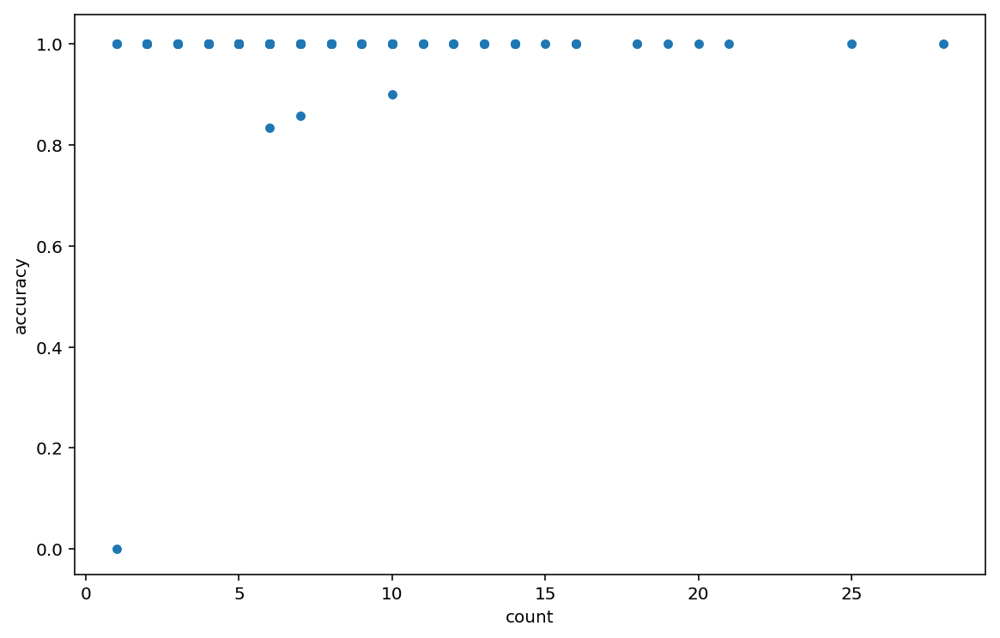

In [234]:
plt.rcParams['figure.figsize'] = [9.5, 6]

valid_result.plot.scatter(x="count", y="accuracy")
plt.ylim(ymin=-0.05)  
plt.show()

### Fetch file names

In [125]:
idx_to_class_valid = {v:k for k, v in test_datasets["valid"].class_to_idx.items()}

In [132]:
valid_result, valid_images = analyze_accuracy(model, device, 
                          idx_to_class_valid, 
                          class_name_map, 
                          test_dataloaders, "valid", True)

resnet152_acc_Two_Pt4_76_model_and_opt.pth
--------------------------------------------------------------------------------

Iteration 1
------------
Labels:
tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2], device='cuda:0')
Predictions:
tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 2
------------
Labels:
tensor([2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 5, 5, 5], device='cuda:0')
Predictions:
tensor([2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 5, 5, 5], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 3
------------
Labels:
tensor([5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7], device='cuda:0')
Predictions:
tensor([5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 7, 7, 7, 7], device='cuda:0')
Equality:
ten

       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 23
------------
Labels:
tensor([50, 50, 50, 50, 50, 50, 50, 50, 51, 51, 51, 51, 51, 51, 51, 51],
       device='cuda:0')
Predictions:
tensor([50, 50, 50, 50, 50, 50, 50, 50, 51, 51, 51, 51, 51, 51, 51, 51],
       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 24
------------
Labels:
tensor([51, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 53, 53, 53, 53, 53],
       device='cuda:0')
Predictions:
tensor([51, 52, 52, 52, 52, 52, 52, 52, 52, 52, 52, 53, 53, 53, 53, 53],
       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 25
------------
Labels:
tensor([53, 53, 53, 54, 54, 54, 54, 54, 

,class,class_name,count,correct,accuracy
0,1,pink primrose,8.0,8.0,1.0
75,75,thorn apple,12.0,12.0,1.0
73,73,water lily,19.0,19.0,1.0
72,72,azalea,8.0,8.0,1.0
71,71,gazania,5.0,5.0,1.0


Bottom 5 class


,class,class_name,count,correct,accuracy
101,99,bromelia,6.0,6.0,1.000000
98,96,camellia,10.0,9.0,0.900000
15,20,giant white arum lily,7.0,6.0,0.857143
95,93,ball moss,6.0,5.0,0.833333
69,7,moon orchid,1.0,0.0,0.000000


Overall Accuracy: 99.51%


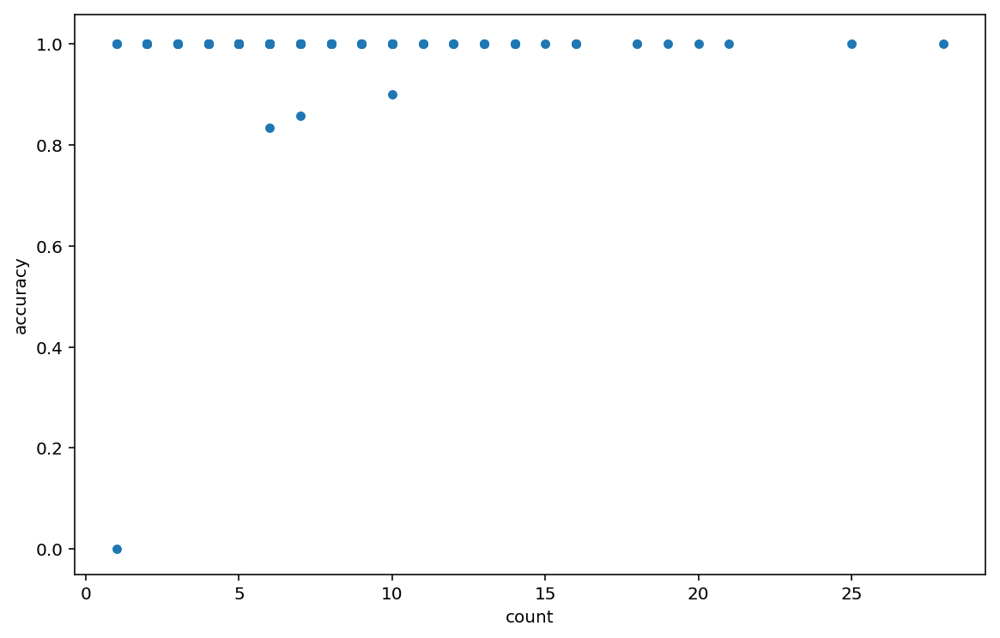

In [127]:
plt.rcParams['figure.figsize'] = [9.5, 6]

valid_result.plot.scatter(x="count", y="accuracy")
plt.ylim(ymin=-0.05)  
plt.show()

In [133]:
valid_images.loc[valid_images.Status == "Mismatch"]

,Image,Prediction,Label,Status
100,flower_data\valid\20\image_04927.jpg,75,20,Mismatch
485,flower_data\valid\7\image_07216.jpg,75,7,Mismatch
756,flower_data\valid\93\image_07303.jpg,94,93,Mismatch
794,flower_data\valid\96\image_07677.jpg,97,96,Mismatch


```
resnet152_acc_schd_wgts_20_model_and_opt.pth
--------------------------------------------------------------------------------


resnet152_acc_schd_wgts_20_model_and_opt.pth
--------------------------------------------------
Top 5 class
class	class_name	        count	correct	accuracy
 0	 1	pink primrose	    8.0     8.0	    1.0
63	64	silverbush	        5.0     5.0	    1.0
61	62	japanese anemone	3.0     3.0	    1.0
60	61	cautleya spicata	6.0     6.0	    1.0
59	60	pink-yellow dahlia	14.0    14.0    1.0

Bottom 5 class
class	class_name	        count	correct	accuracy
98	96	camellia	        10.0	8.0	    0.80
26	30	sweet william	    10.0	8.0	    0.80
72	72	azalea	            8.0	    6.0	    0.75
36	4	sweet pea	        6.0	    3.0	    0.50
27	31	carnation	        2.0	    1.0	    0.50

Overall Accuracy: 96.33%
```
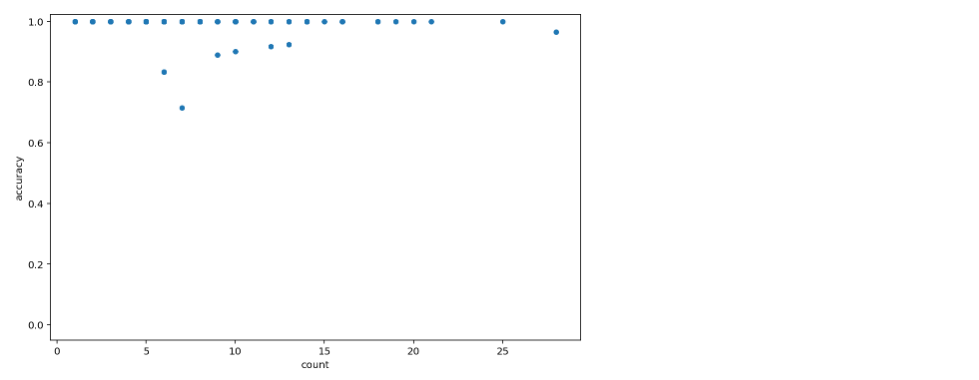

### Evaluate model - method 2 - test data

In [134]:
idx_to_class_test = {v:k for k, v in test_datasets["test"].class_to_idx.items()}

In [136]:
test_result, test_images = analyze_accuracy(model, device, 
                          idx_to_class_test, 
                          class_name_map, 
                          test_dataloaders, "test");

resnet152_acc_Two_Pt4_76_model_and_opt.pth
--------------------------------------------------------------------------------

Iteration 1
------------
Labels:
tensor([0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
Predictions:
tensor([0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 2
------------
Labels:
tensor([3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5], device='cuda:0')
Predictions:
tensor([3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5], device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 3
------------
Labels:
tensor([5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7], device='cuda:0')
Predictions:
tensor([5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7], device='cuda:0')
Equality:
ten

       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 23
------------
Labels:
tensor([51, 51, 51, 51, 52, 52, 52, 52, 53, 53, 53, 53, 53, 53, 53, 54],
       device='cuda:0')
Predictions:
tensor([51, 51, 51, 51, 52, 52, 52, 52, 53, 53, 53, 53, 53, 53, 53, 54],
       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 24
------------
Labels:
tensor([54, 54, 54, 54, 54, 54, 54, 55, 55, 55, 55, 55, 55, 55, 55, 55],
       device='cuda:0')
Predictions:
tensor([54, 54, 54, 54, 54, 54, 54, 55, 55, 55, 55, 55, 55, 55, 55, 55],
       device='cuda:0')
Equality:
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       device='cuda:0', dtype=torch.uint8)
Mismatched Image File Names:

Iteration 25
------------
Labels:
tensor([55, 55, 56, 56, 56, 56, 56, 56, 

,class,class_name,count,correct,accuracy
0,1,pink primrose,5.0,5.0,1.0
74,74,rose,14.0,14.0,1.0
72,72,azalea,11.0,11.0,1.0
71,71,gazania,9.0,9.0,1.0
70,70,tree poppy,4.0,4.0,1.0


Bottom 5 class


,class,class_name,count,correct,accuracy
37,40,lenten rose,8.0,7.0,0.875000
36,4,sweet pea,6.0,5.0,0.833333
21,26,corn poppy,5.0,4.0,0.800000
98,96,camellia,9.0,7.0,0.777778
100,98,mexican petunia,4.0,3.0,0.750000


Overall Accuracy: 99.15%


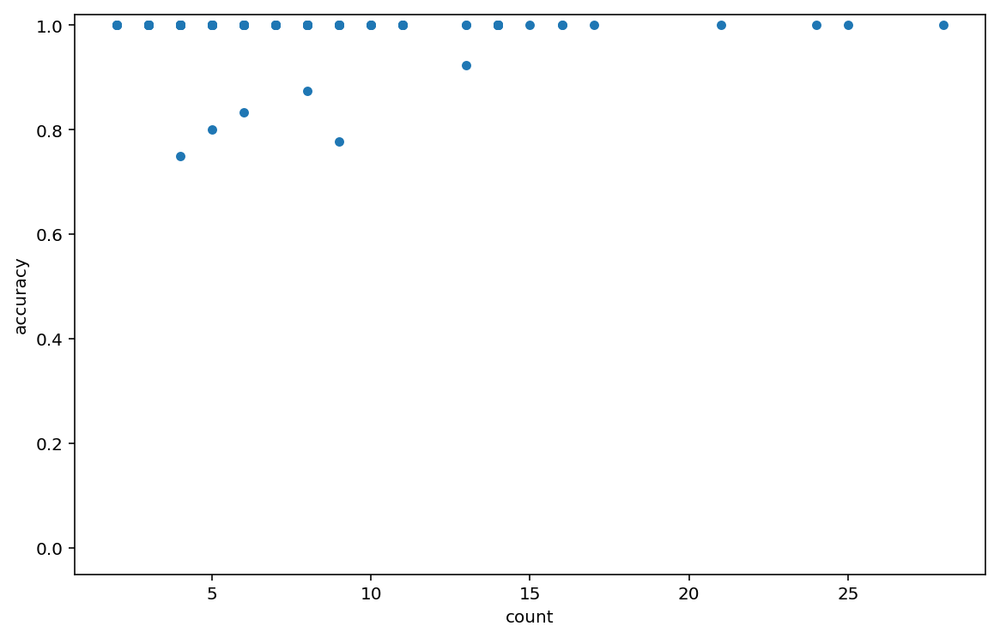

In [238]:
plt.rcParams['figure.figsize'] = [9.5, 6]

test_result.plot.scatter(x="count", y="accuracy")
plt.ylim(ymin=-0.05)  
plt.show()

In [239]:
test_images.head()

,Image,Prediction,Label,Status
0,1\image_06743.jpg,1,1,
1,1\image_06752.jpg,1,1,
2,1\image_06754.jpg,1,1,
3,1\image_06760.jpg,1,1,
4,1\image_06764.jpg,1,1,


In [240]:
test_images.loc[test_images.Status == "Mismatch"]

,Image,Prediction,Label,Status
111,26\image_06498.jpg,31,26,Mismatch
207,4\image_05653.jpg,9,4,Mismatch
211,40\image_04568.jpg,84,40,Mismatch
548,75\image_02144.jpg,76,75,Mismatch
801,96\image_07676.jpg,97,96,Mismatch
802,96\image_07683.jpg,97,96,Mismatch
809,98\image_07758.jpg,19,98,Mismatch


In [241]:
mismatches = list(pd.Series(test_images.loc[test_images.Status == "Mismatch"]['Label']).unique())
mismatches

['26', '4', '40', '75', '96', '98']

In [242]:
test_result.head()

,class,class_name,count,correct,accuracy
0,1,pink primrose,5.0,5.0,1.0
1,10,globe thistle,3.0,3.0,1.0
2,100,blanket flower,8.0,8.0,1.0
3,101,trumpet creeper,4.0,4.0,1.0
4,102,blackberry lily,6.0,6.0,1.0


In [243]:
test_result[test_result['class'].isin(mismatches)]

,class,class_name,count,correct,accuracy
21,26,corn poppy,5.0,4.0,0.800000
36,4,sweet pea,6.0,5.0,0.833333
37,40,lenten rose,8.0,7.0,0.875000
75,75,thorn apple,13.0,12.0,0.923077
98,96,camellia,9.0,7.0,0.777778
100,98,mexican petunia,4.0,3.0,0.750000


In [244]:
test_result.loc[test_result.accuracy != 1]

,class,class_name,count,correct,accuracy
21,26,corn poppy,5.0,4.0,0.800000
36,4,sweet pea,6.0,5.0,0.833333
37,40,lenten rose,8.0,7.0,0.875000
75,75,thorn apple,13.0,12.0,0.923077
98,96,camellia,9.0,7.0,0.777778
100,98,mexican petunia,4.0,3.0,0.750000


# Inference for Classification

In [245]:
def resize_image(image, size):
    ''' Resize image so shortest side is 'size' pixels,
        maintain aspect ratio  
    '''
    w, h = image.size

    if h > w:
        # Set width to 'size' and scale height to maintain aspect ratio
        h = int(max(h * size / w, 1))
        w = int(size)
    else:
        # Set height to 'size' and scale width to maintain aspect ratio
        w = int(max(w * size / h, 1))
        h = int(size)

    return image.resize((w, h))


def crop_image(image, size):
    ''' Return a cropped square region from centre of image
    '''
    w, h = image.size
    x0 = (w - size) / 2
    y0 = (h - size) / 2
    x1 = x0 + size
    y1 = y0 + size

    return image.crop((x0, y0, x1, y1))

def process_image(image_path, img_sz=224, max_sz=None):
    ''' 
    Scales, crops, and normalizes a PIL image for a PyTorch       
    model, returns an Numpy array
    '''
    global img_means, img_std
    
    if img_means is not None:
        imgmeans = img_means
    else: 
        imgmeans = [0.485, 0.456, 0.406]

    if img_std is not None:
        imgstd = img_std
    else: 
        imgstd = [0.229, 0.224, 0.225]
        
    if max_sz is None:
        max_sz = img_sz + (img_sz // 7)
        
    # Open the image
    from PIL import Image
    img = Image.open(image_path)
    
    # Resize image so shortest side is 256 pixels (for 224 image, 341 is standard for 229)
    img = resize_image(img, max_sz)
    
    # Crop image
    img = crop_image(img, img_sz)

    # Normalize
    img = np.array(img)/255
    
    mean = np.array(imgmeans) #provided mean
    std = np.array(imgstd) #provided std
    
    img = (img - mean)/std
    
    # Move color channels to first dimension as expected by PyTorch
    # PIL assumes is the third dimension    
    img = img.transpose((2, 0, 1))
    
    return img

In [246]:
testimg = process_image('flower_data/train/12/image_03999.jpg', image_size)

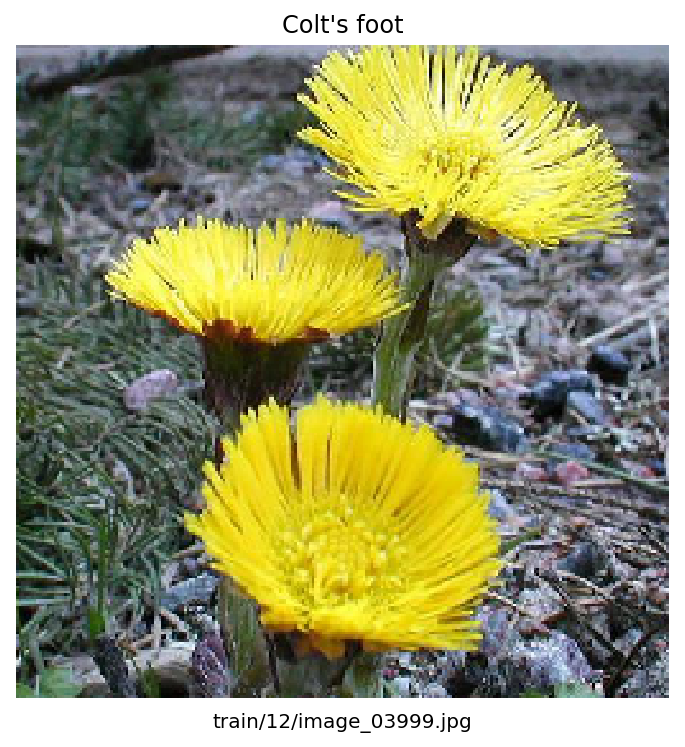

In [247]:
imshow(testimg, title="Colt's foot", filename = 'train/12/image_03999.jpg')

In [248]:
def predict(image_path, model, topk=5, img_sz=224, max_sz=None):

    img = process_image(image_path, img_sz, max_sz)
    img_tensor = torch.from_numpy(img).type(torch.FloatTensor)
    
    img_tensor.unsqueeze_(0)
    
    model.cpu()
    model.eval()
    
    with torch.no_grad():
        log_ps = torch.softmax(model.forward(img_tensor), dim=1)
        probs, classes = torch.topk(log_ps, k=topk)

        probs = probs.view(topk).detach().numpy().tolist()
        classes = classes.view(topk).detach().numpy().tolist()

        idx_to_class =  {y:x for x,y in model.class_to_idx.items()}
        classes = [idx_to_class[ii] for ii in classes]
        classnames = [cat_to_name[cls] for cls in classes]
        
    return probs, classes, classnames    

In [122]:
imgpth = 'flower_data/train/12/image_03999.jpg'
pred = predict(imgpth, model, 5, image_size)

In [250]:
print(pred)
print()
print(pred[0])
print()
print(pred[1])
print()
print(pred[2])

([0.9367625117301941, 0.04772449657320976, 0.006835282780230045, 0.002103156642988324, 0.0018425137968733907], ['12', '14', '50', '68', '48'], ["colt's foot", 'spear thistle', 'common dandelion', 'bearded iris', 'buttercup'])

[0.9367625117301941, 0.04772449657320976, 0.006835282780230045, 0.002103156642988324, 0.0018425137968733907]

['12', '14', '50', '68', '48']

["colt's foot", 'spear thistle', 'common dandelion', 'bearded iris', 'buttercup']


In [251]:
def plot_solution(image_path, model, topk=5, img_sz=224, max_sz=None):
    # Set up plot
    plt.figure(figsize = (4,10))
    ax = plt.subplot(2,1,1)

    # Set up title
    flower_num = image_path.split('/')[2]
    title_ = cat_to_name[flower_num]

    # Plot flower
    img = process_image(image_path, img_sz, max_sz)
    imshow(img, ax, title = title_, filename=str.replace(image_path, data_dir, ''));
    
    # Make prediction
    probs, labs, flowers = predict(image_path, model, topk, img_sz, max_sz) 
    
    # Plot bar chart
    ax2 = plt.subplot(2,1,2)
    sns.barplot(x=probs, y=flowers, color=sns.color_palette()[0]);
    ax2.set_xlim(0, 1.05)
    plt.show()

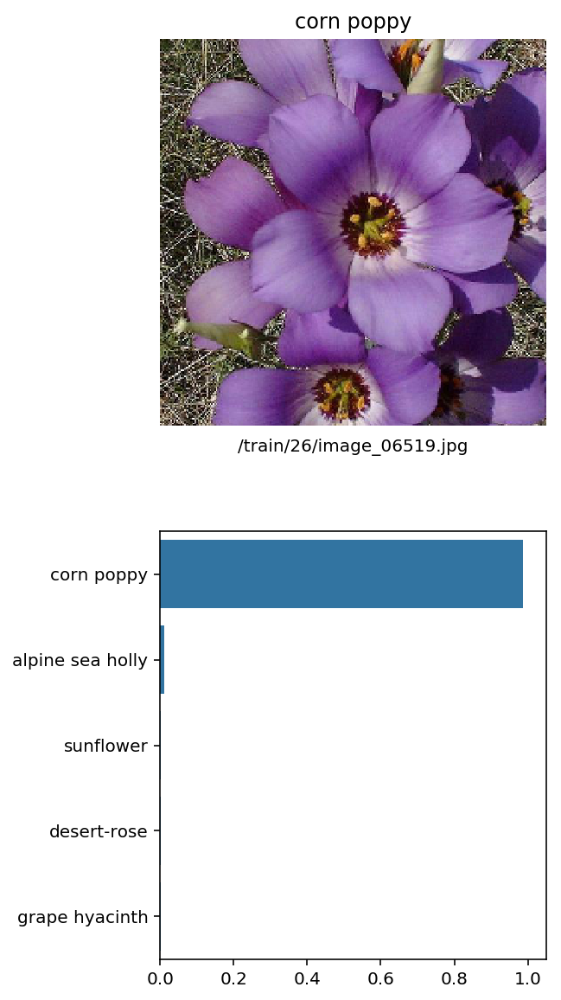

In [252]:
plot_solution('flower_data/train/26/image_06519.jpg', model, 5, image_size)

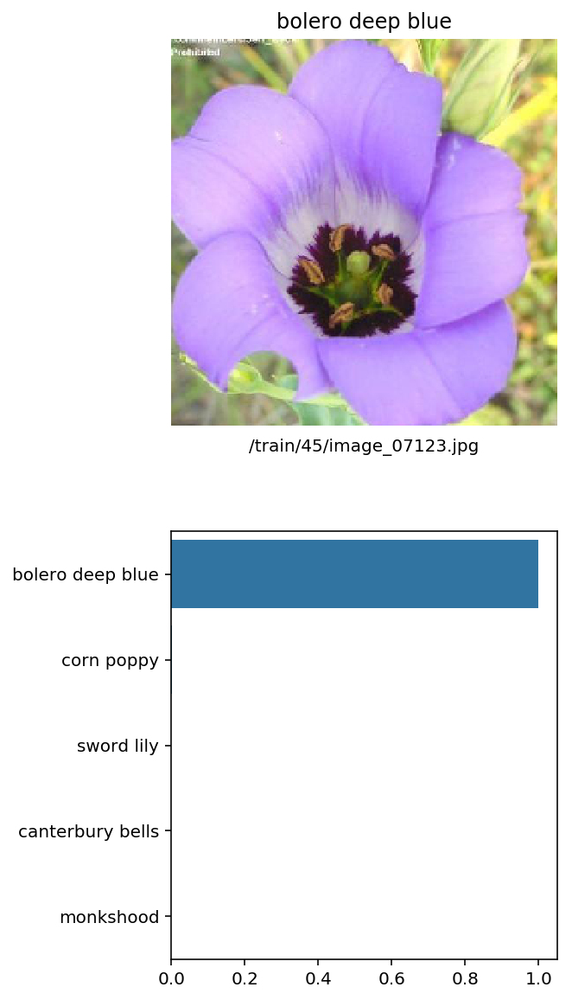

In [253]:
plot_solution('flower_data/train/45/image_07123.jpg', model, 5, image_size)

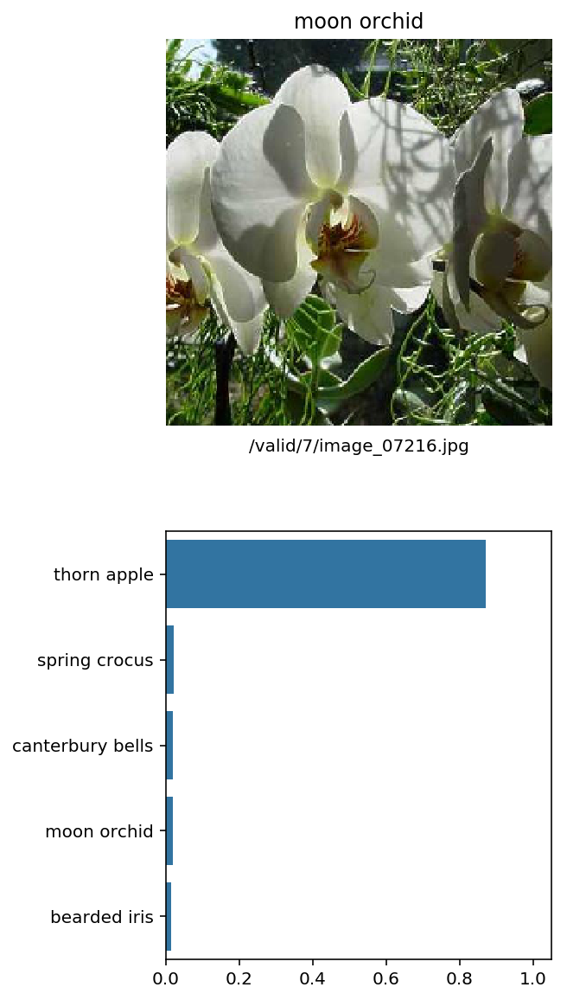

In [254]:
plot_solution('flower_data/valid/7/image_07216.jpg', model, 5, image_size)

### The actual misclassified valid images (at 99.5% accuracy, 256 image size):
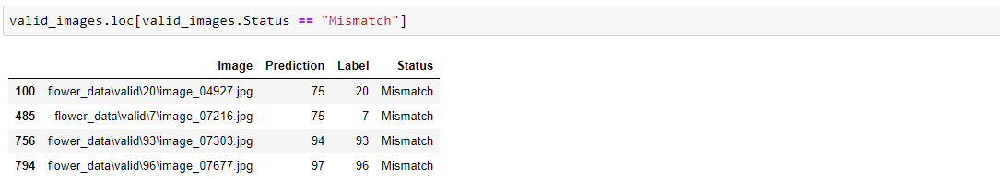

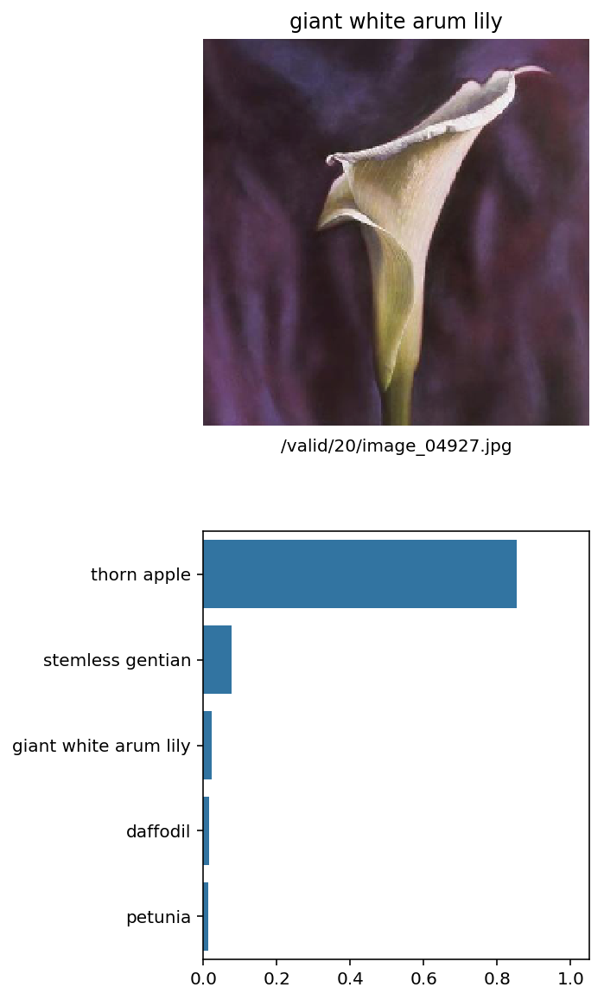

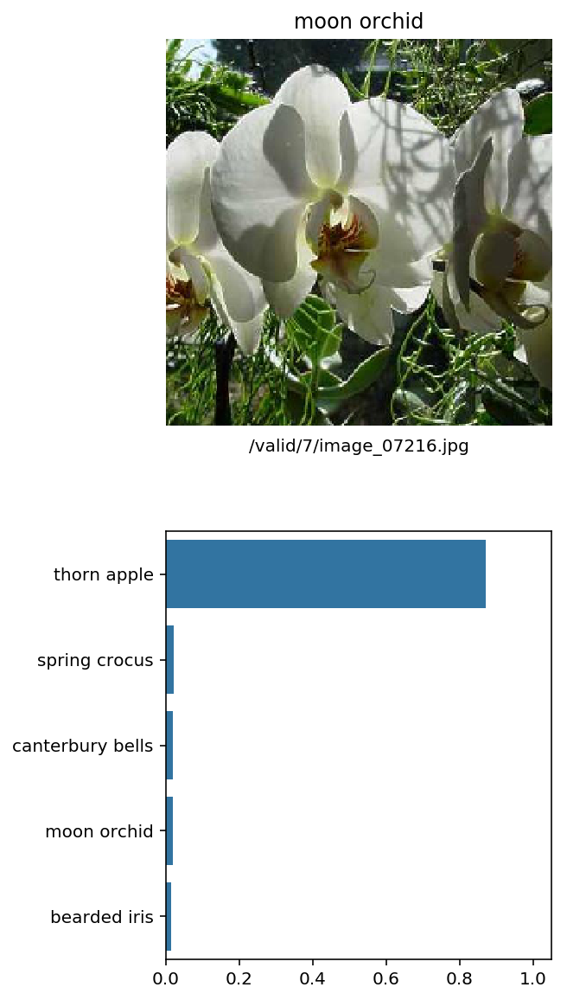

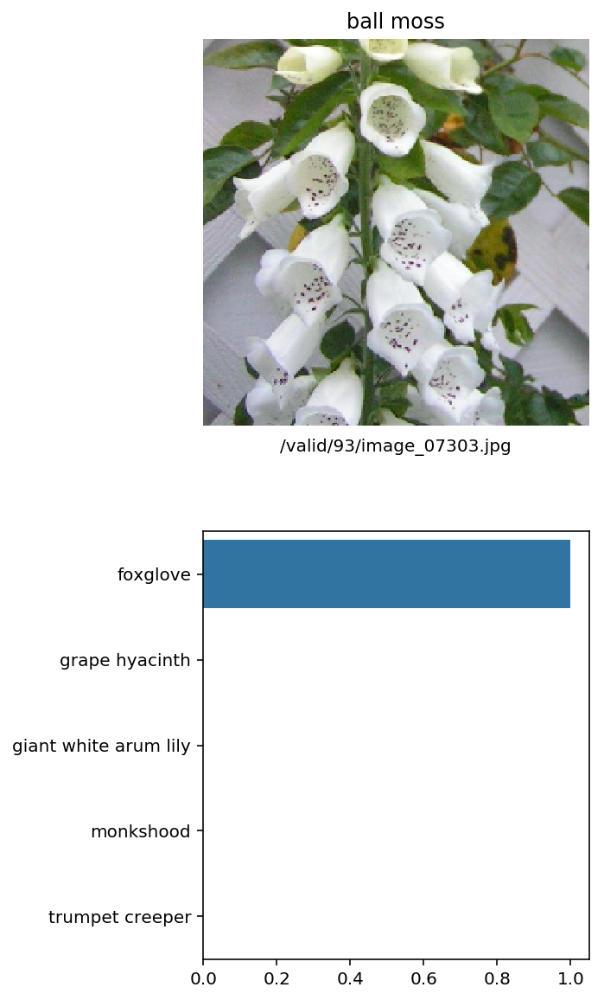

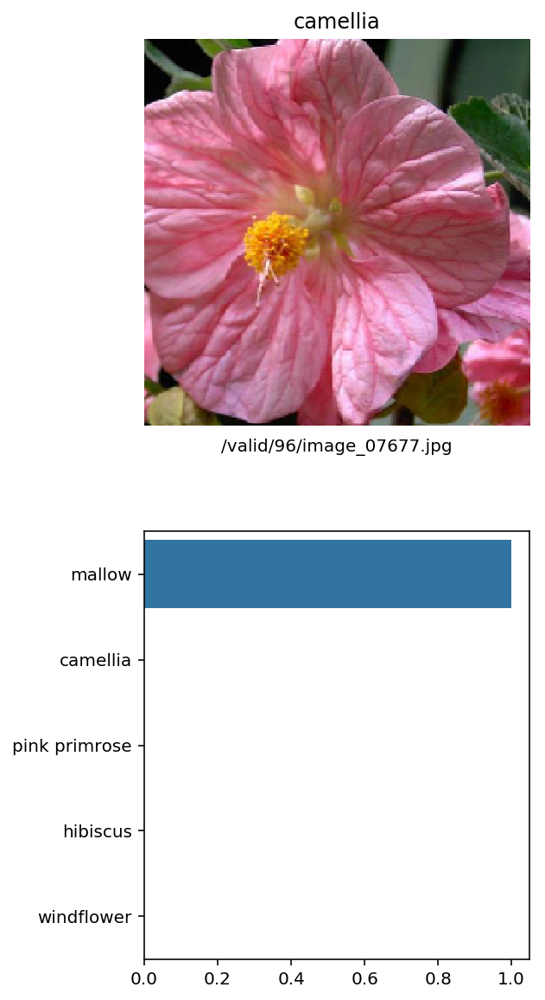

In [139]:
valid_misclassified = list(valid_images.loc[valid_images.Status == "Mismatch"]["Image"])

for imgname in valid_misclassified:
    img = imgname.replace(os.sep, '/')
    plot_solution(img, model, 5, image_size)

### The actual misclassified test images  (at 99.15% accuracy, 256 image size):
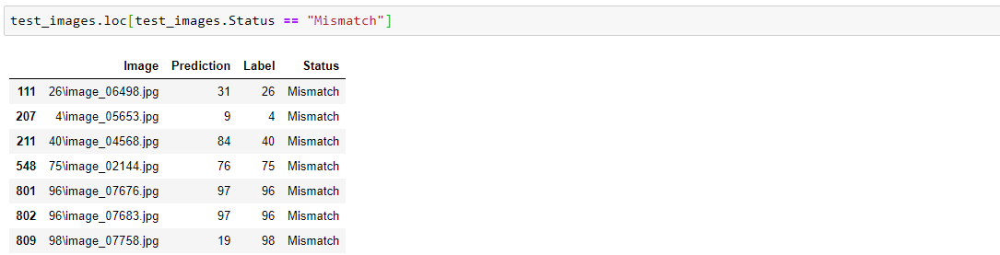

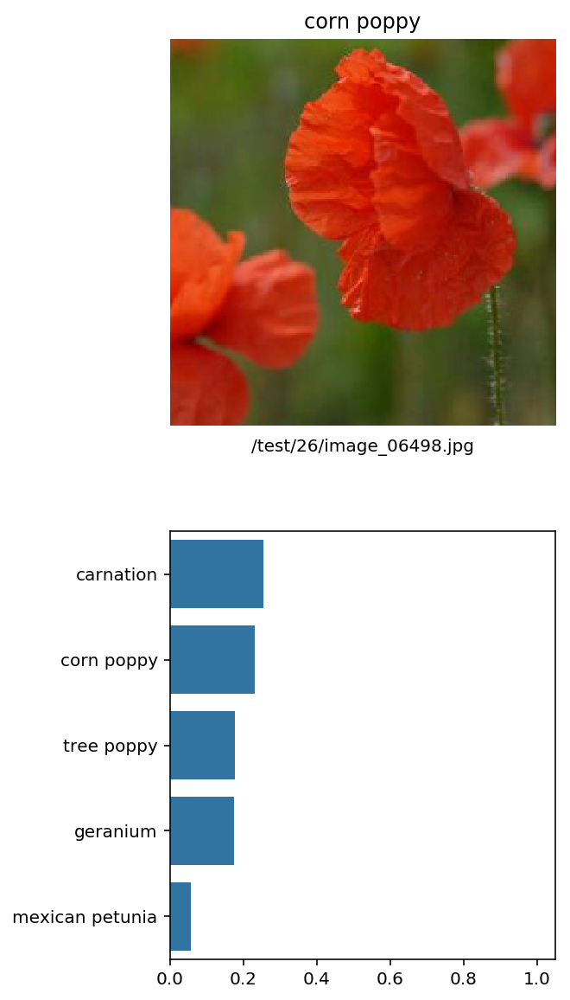

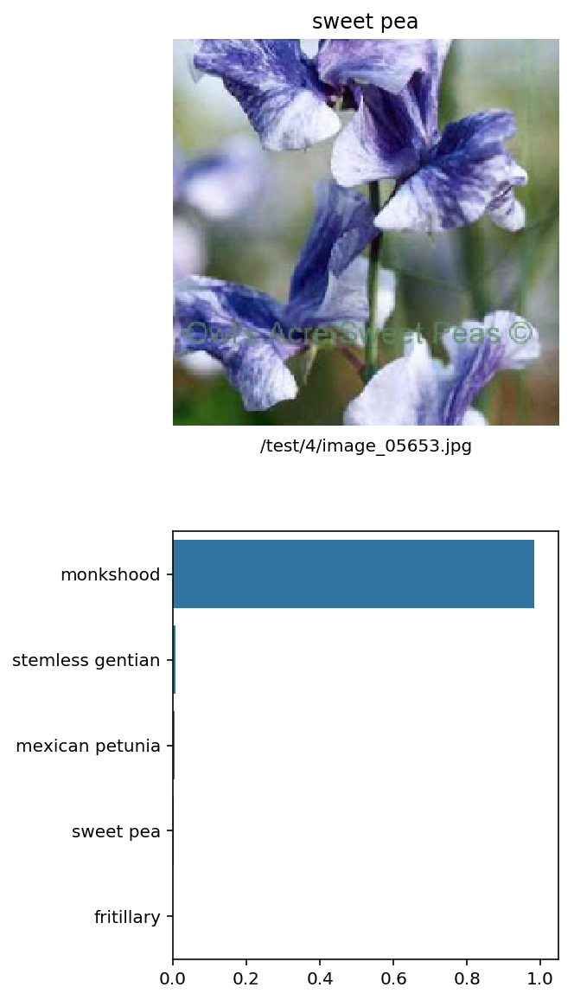

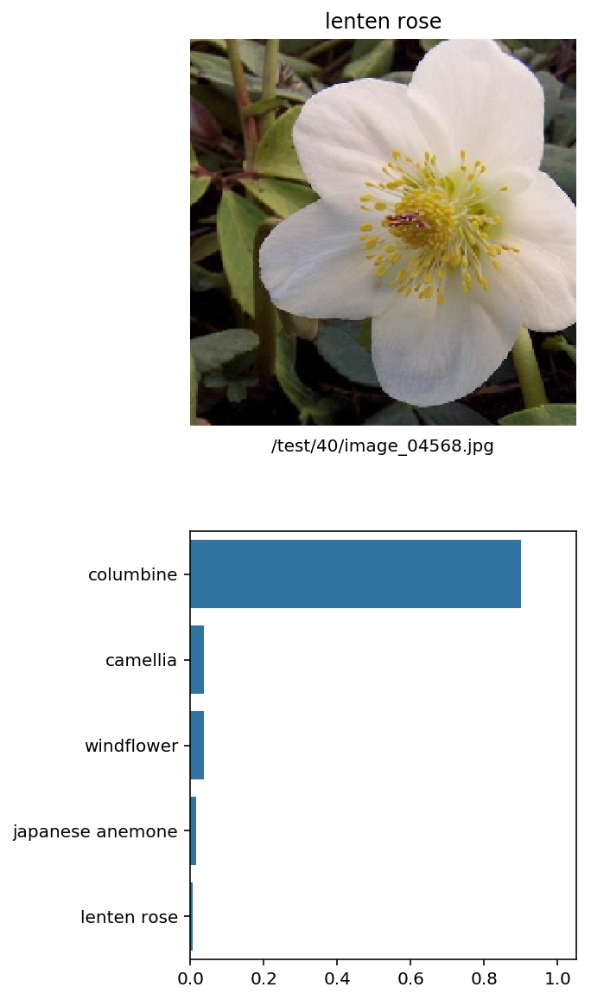

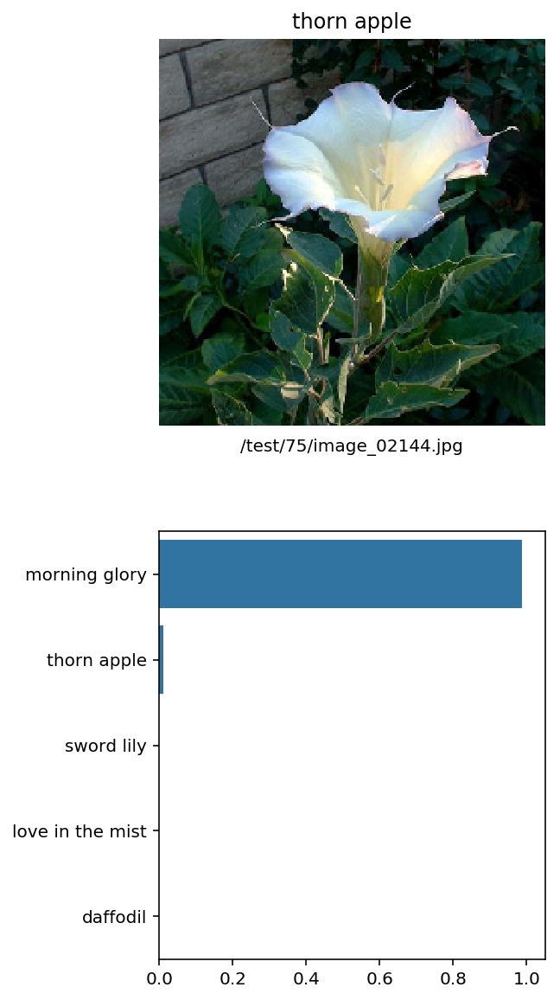

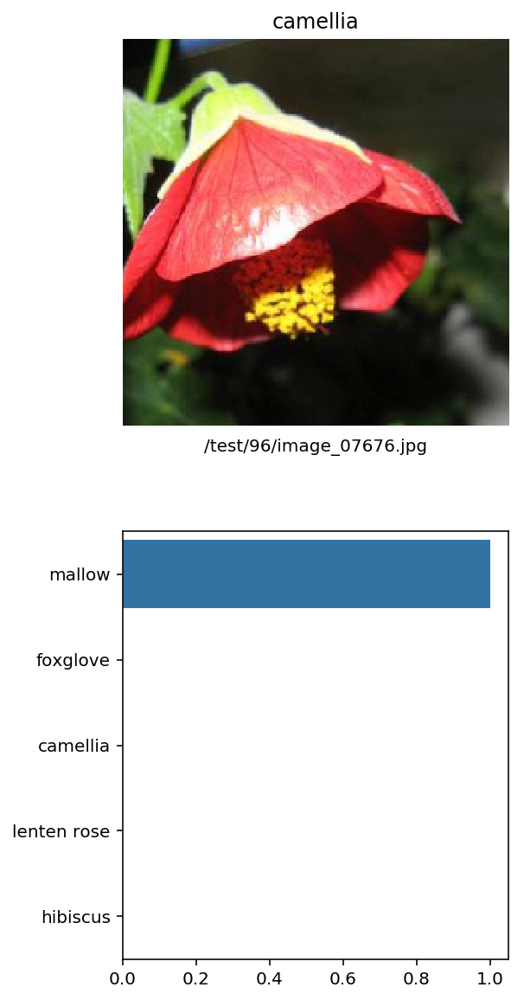

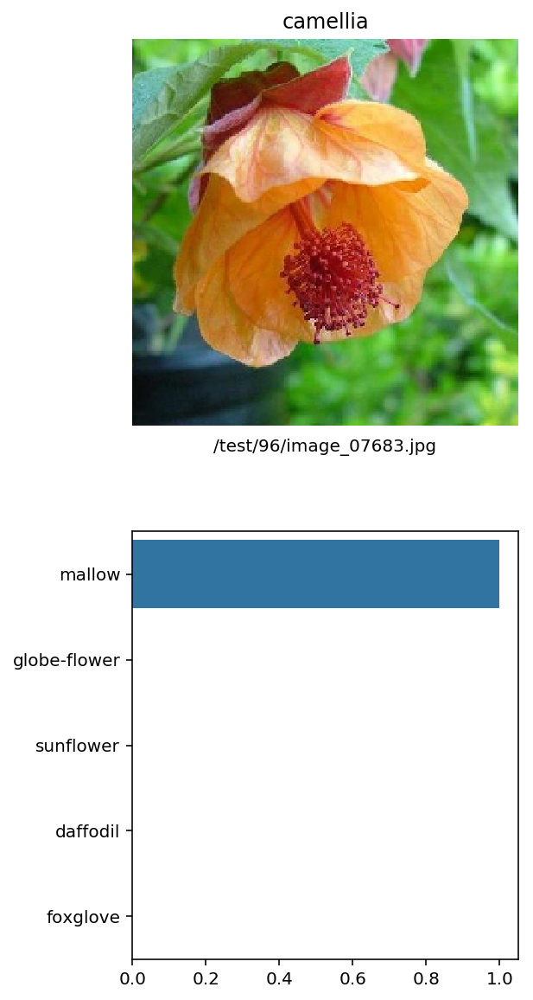

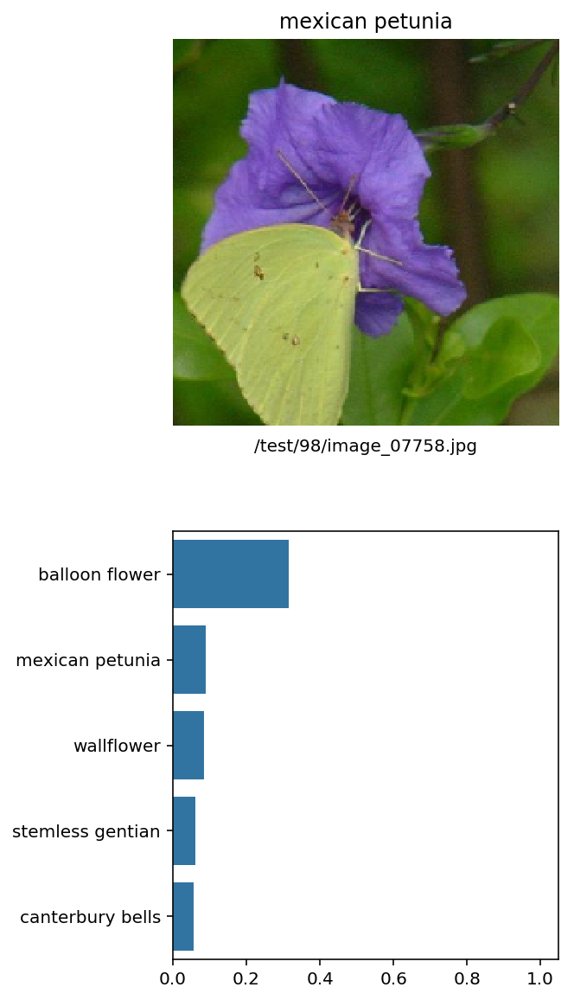

In [123]:
misclassified = list(str.replace(test_dir, "/", "\\")+test_images.loc[test_images.Status == "Mismatch"]["Image"])

for imgname in misclassified:
    img = imgname.replace(os.sep, '/')
    plot_solution(img, model, 5, image_size)

### Look at lenten rose, in tests above none are misclassified, but here 2 are...

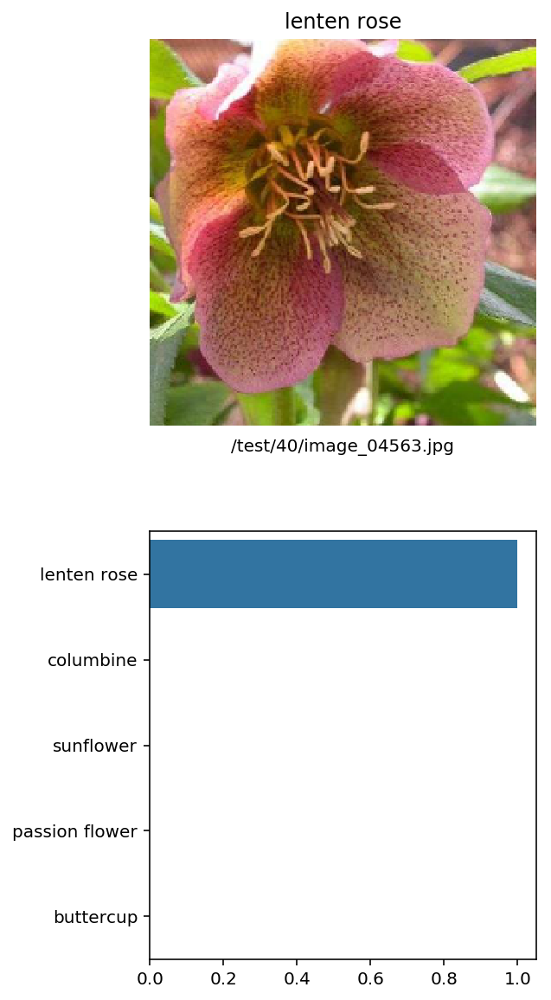

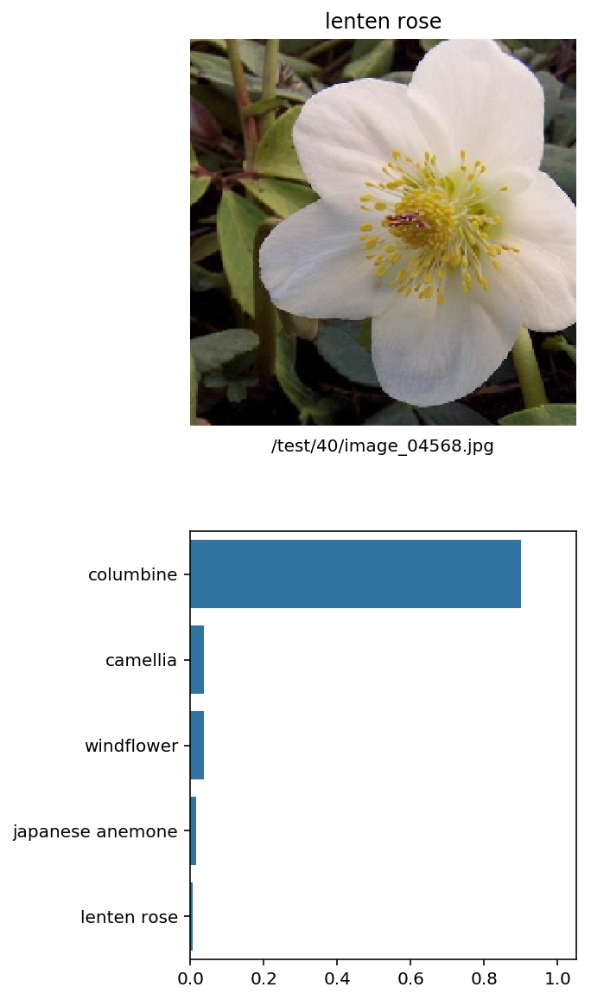

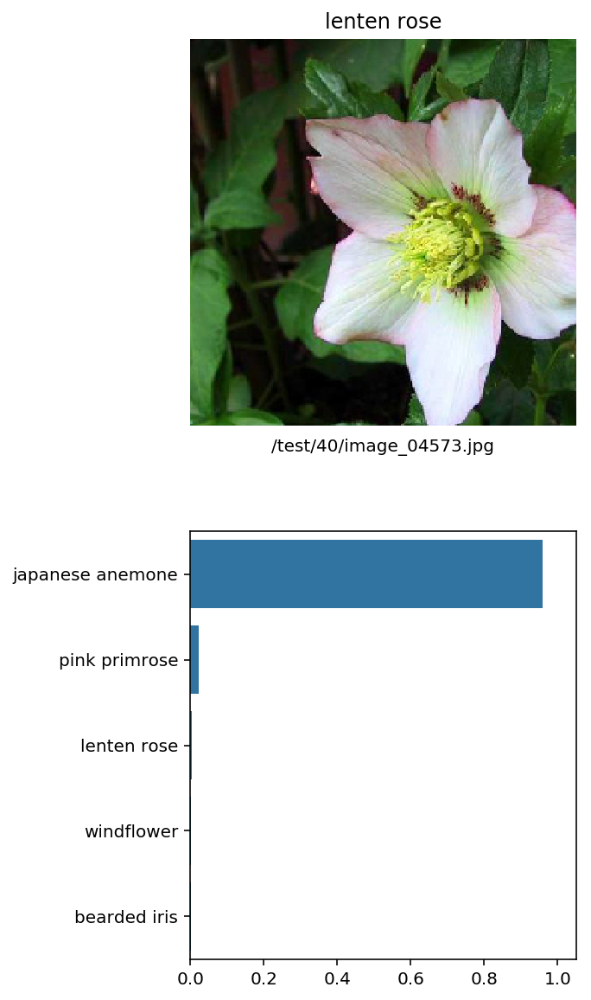

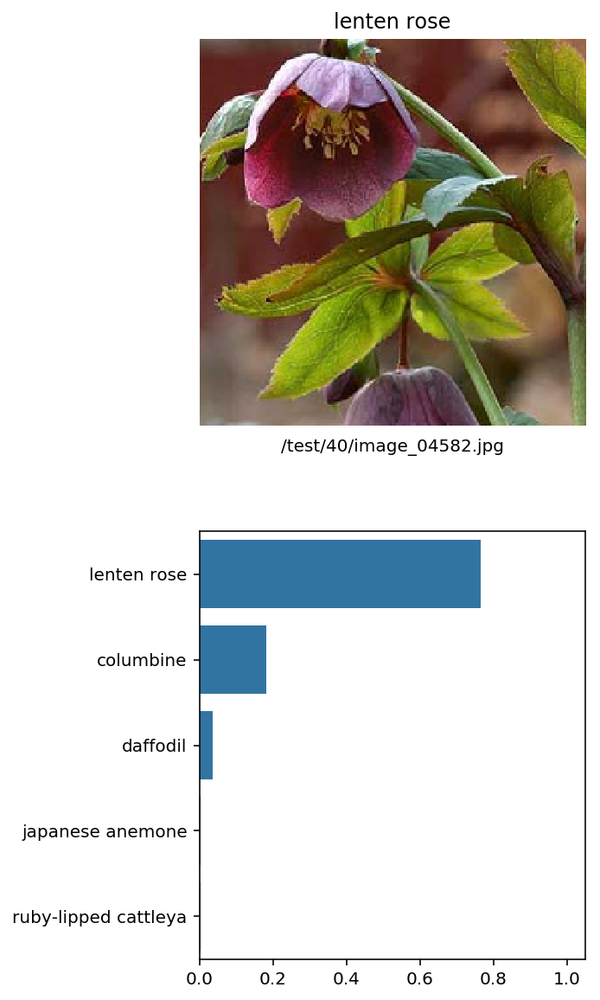

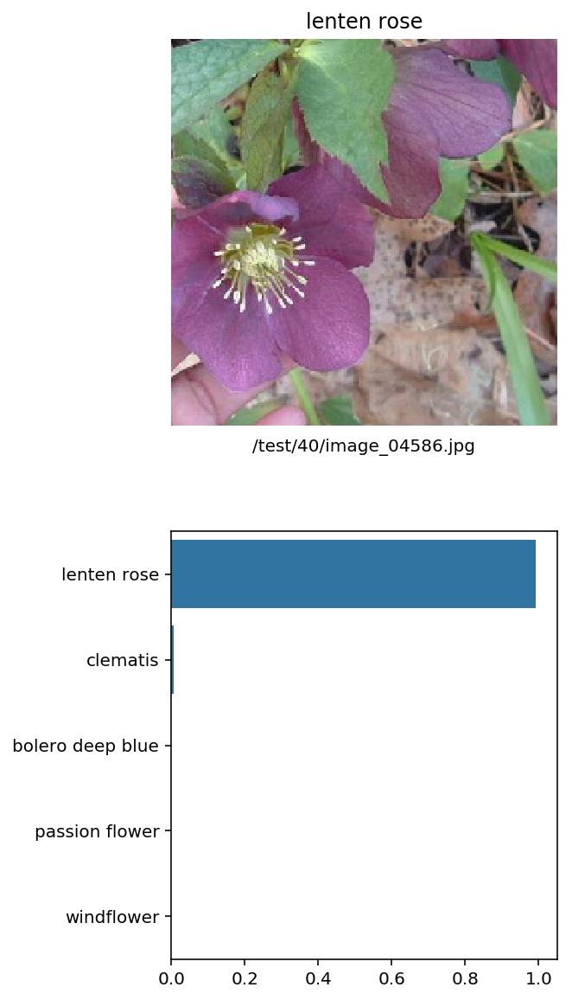

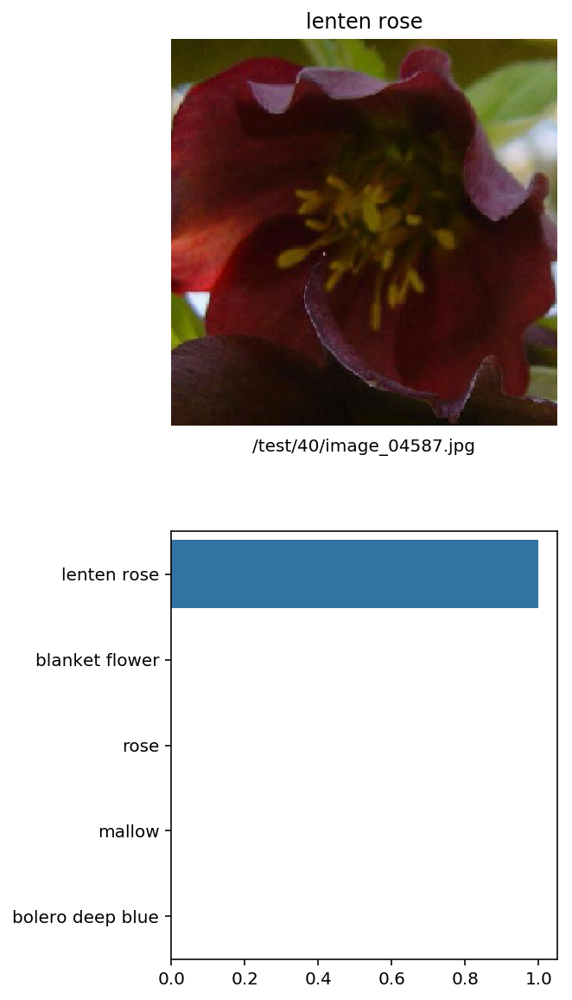

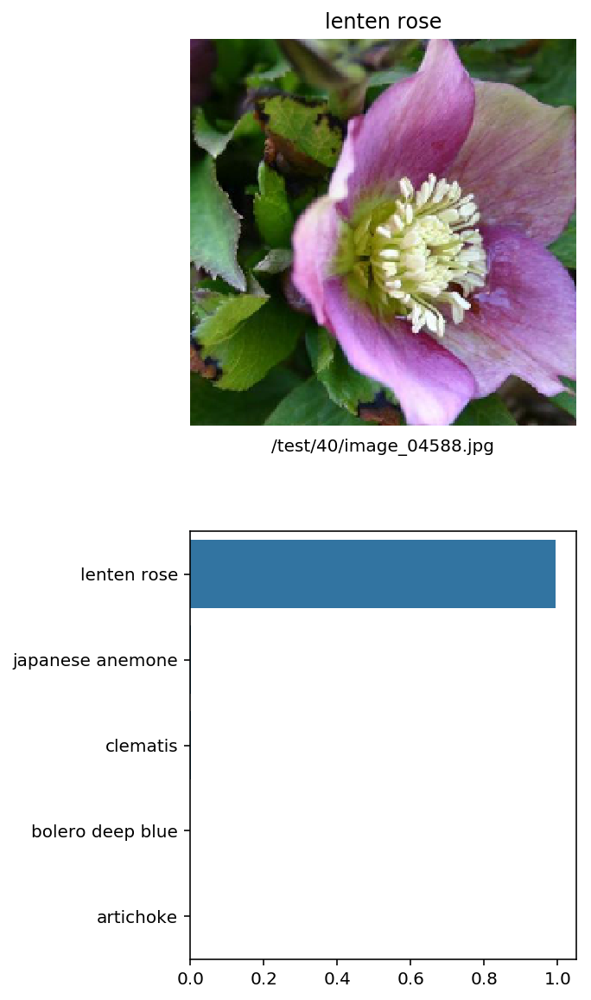

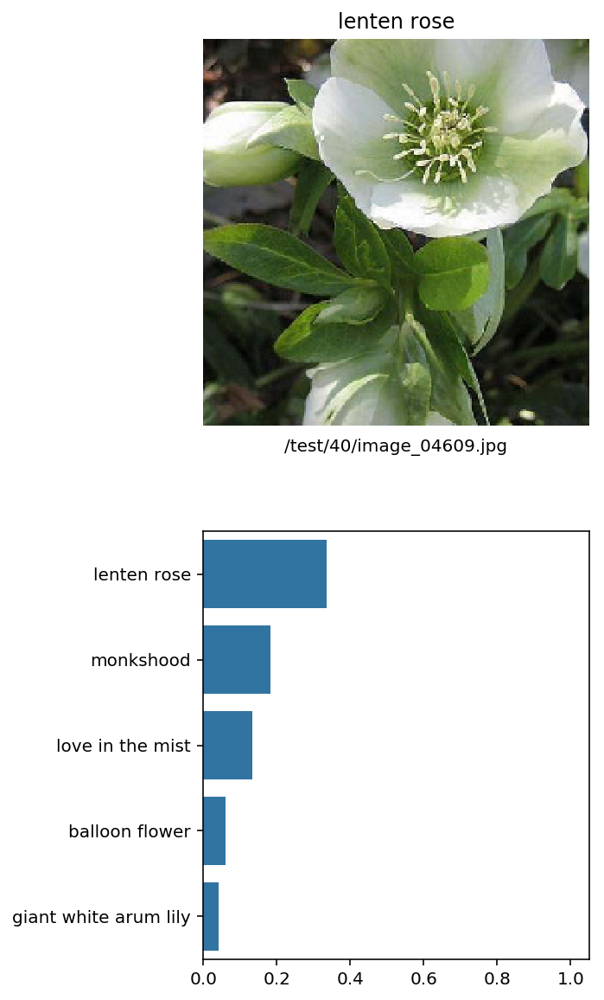

In [255]:
foldername = 'flower_data/test/40/'
files = os.listdir(foldername)

for imgname in files:
    img = foldername + imgname
    plot_solution(img, model, 5, image_size)

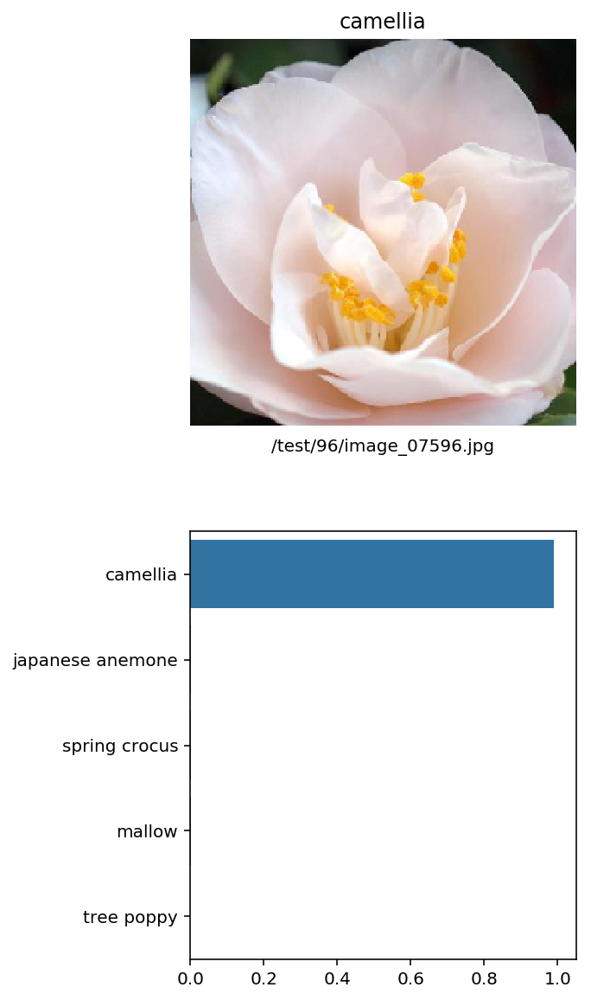

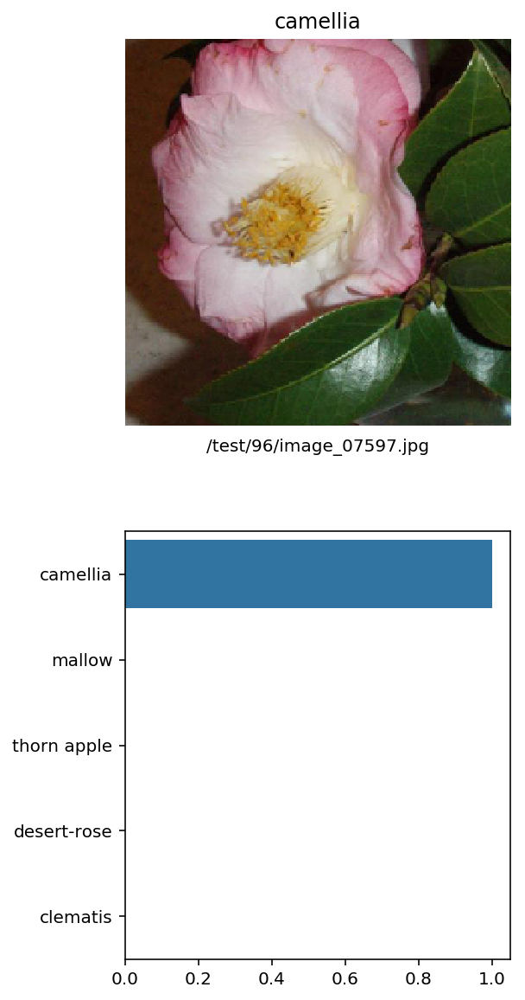

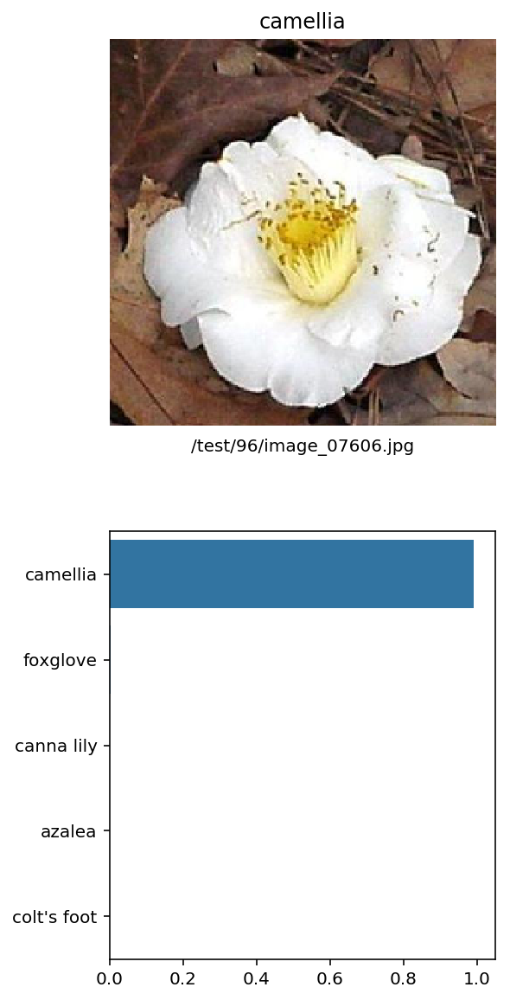

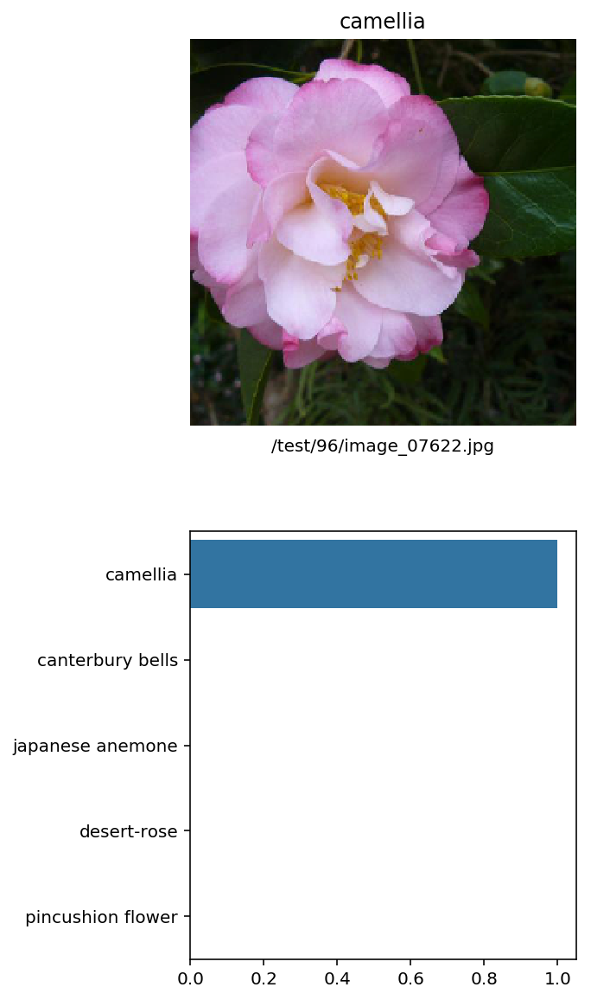

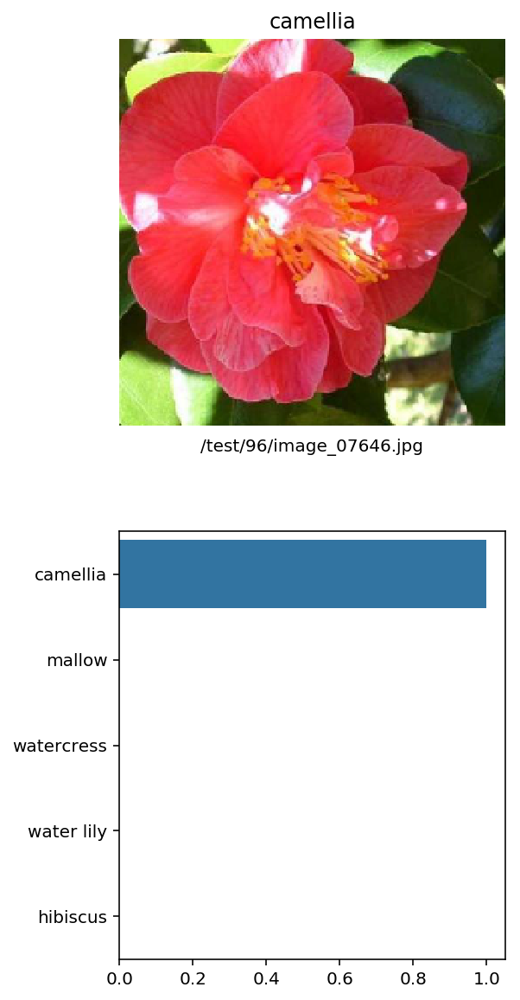

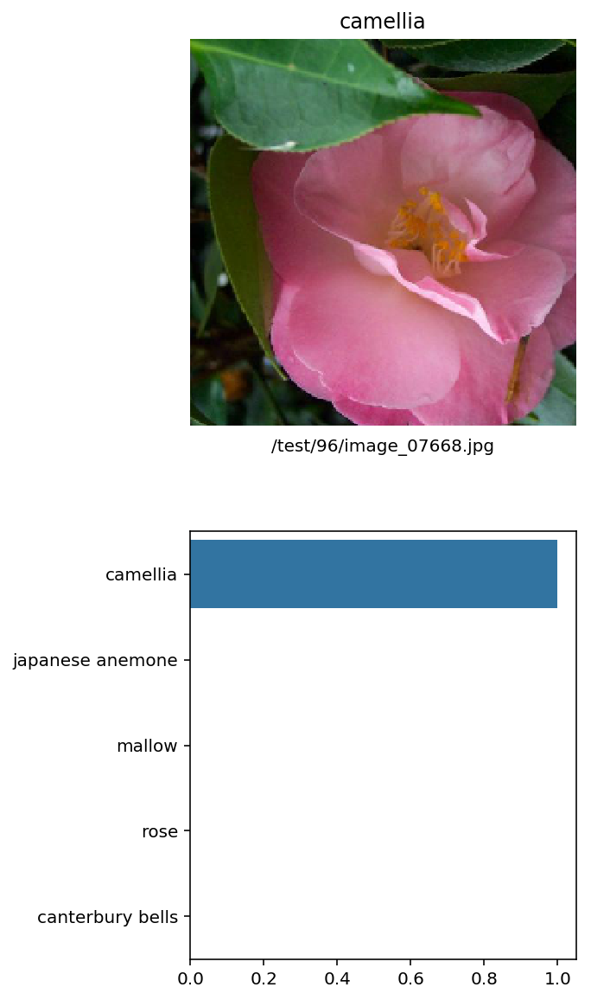

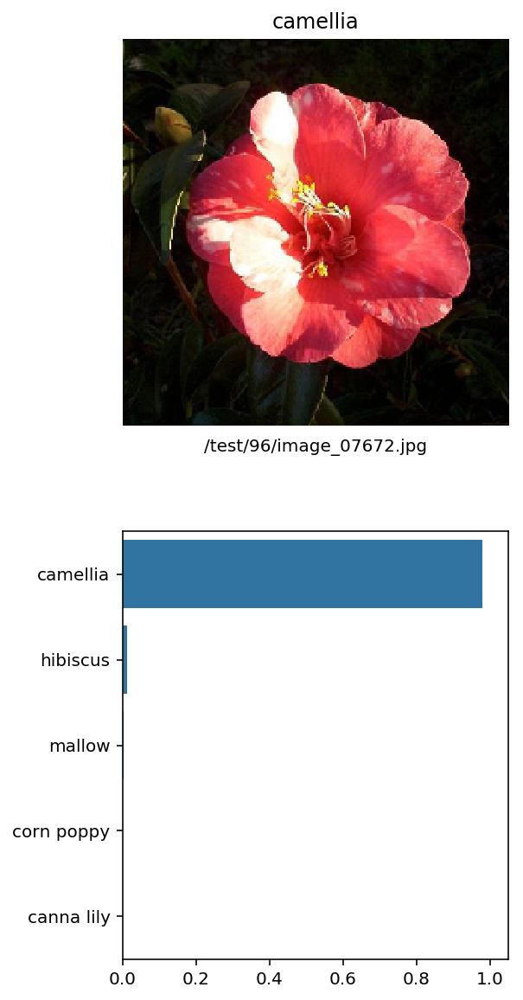

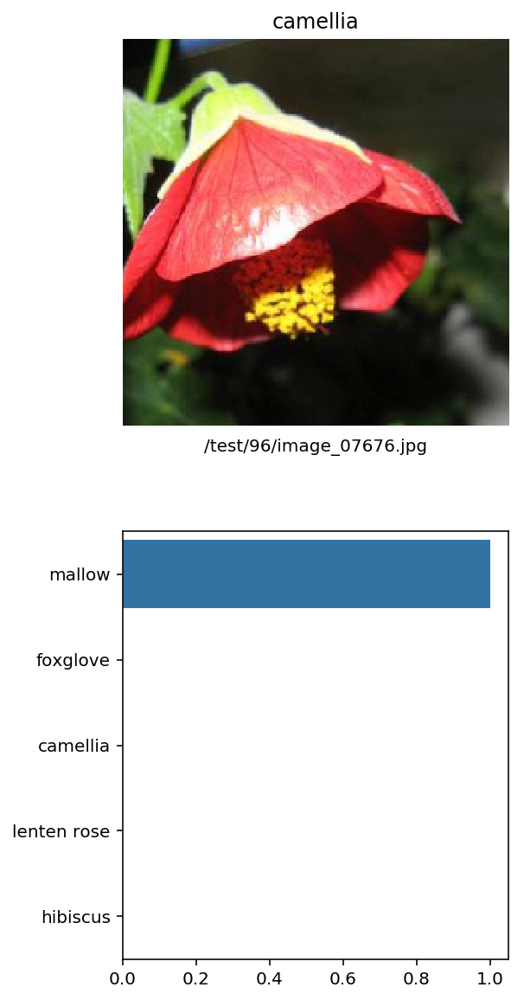

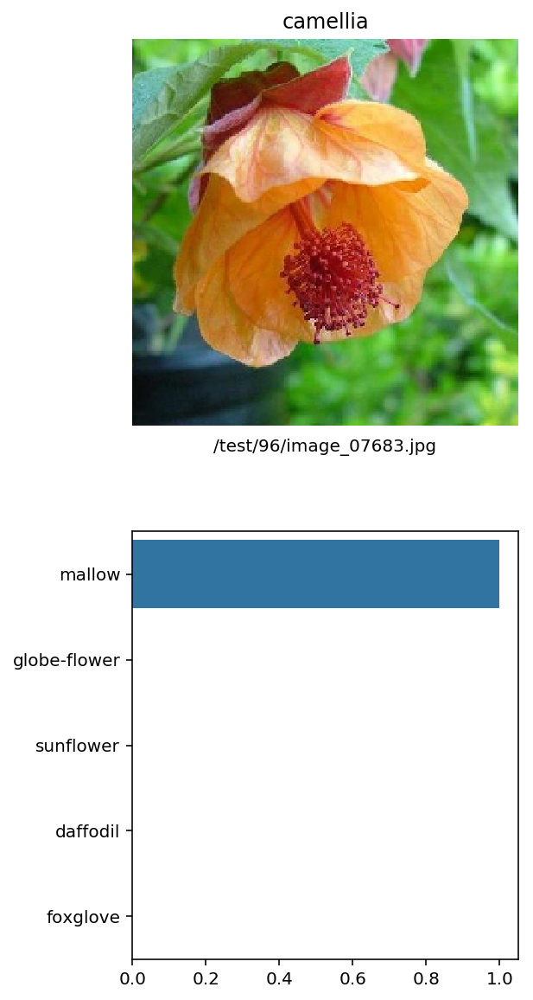

In [111]:
foldername = 'flower_data/test/96/'
files = os.listdir(foldername)

for imgname in files:
    img = foldername + imgname
    plot_solution(img, model, 5, image_size)

# Prepare for Kaggle

In [257]:
def kaggle_prep(model, device, idx_to_class, dataloaders, data):
    
    # Requires use of test_dataloader as it has paths component
    
    model.eval()
    model.to(device) 

    image_matches = []
    
    pathstr = ""
    if data == "test":
        pathstr = str.replace(test_dir, "/", "\\")
    elif data == "testset":
        pathstr = str.replace(testset_subdir, "/", "\\")

    with torch.no_grad():
        for dataload in dataloaders[data]:
            data = dataload[0]
            target = dataload[1]
            paths  = dataload[2]
            
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, pred = torch.max(output, 1)
            
            for i in range(len(target.data)):
                image_arr = [str.replace(paths[i], pathstr, ''), 
                             idx_to_class[pred[i].item()], 
                             idx_to_class[target.data[i].item()]
                            ]
                image_matches.append(image_arr)
                
    image_matches = pd.DataFrame(image_matches, columns = ["Image", "Prediction", "Label"])
    
    return (image_matches)

In [258]:
idx_to_class_test = {v:k for k, v in test_datasets["test"].class_to_idx.items()}

In [259]:
%%time

kaggle_test_images = kaggle_prep(model, device, 
                          idx_to_class_test, 
                          test_dataloaders, "test");

Wall time: 17.7 s


In [260]:
kaggle_test_images

,Image,Prediction,Label
0,1\image_06743.jpg,1,1
1,1\image_06752.jpg,1,1
2,1\image_06754.jpg,1,1
3,1\image_06760.jpg,1,1
4,1\image_06764.jpg,1,1
5,10\image_07090.jpg,10,10
6,10\image_07104.jpg,10,10
7,10\image_07117.jpg,10,10
8,100\image_07896.jpg,100,100
9,100\image_07897.jpg,100,100


In [261]:
kaggle_test_images[kaggle_test_images.Prediction != kaggle_test_images.Label]

,Image,Prediction,Label
111,26\image_06498.jpg,31,26
207,4\image_05653.jpg,9,4
211,40\image_04568.jpg,84,40
548,75\image_02144.jpg,76,75
801,96\image_07676.jpg,97,96
802,96\image_07683.jpg,97,96
809,98\image_07758.jpg,19,98


In [262]:
kaggle_test_images_export = copy.deepcopy(kaggle_test_images)

In [263]:
kaggle_test_images_export['Image'] = kaggle_test_images_export['Image'].apply(lambda x: os.path.basename(x))

In [264]:
kaggle_test_images_export.to_csv('submission_withlabels.csv', index=False)

### Using kaggle_prep, which uses model directly...

In [265]:
idx_to_class_testset = {v:k for k, v in test_datasets["testset"].class_to_idx.items()}

In [266]:
idx_to_class_testset

{0: 'testdir'}

In [267]:
%%time

kaggle_testset_images = kaggle_prep(model, device, 
                          idx_to_class_test, 
                          test_dataloaders, "testset");

Wall time: 20.9 s


In [268]:
kaggle_testset_images[['Image', 'Prediction']].head()

,Image,Prediction
0,image_00005.jpg,77
1,image_00006.jpg,77
2,image_00024.jpg,77
3,image_00025.jpg,77
4,image_00029.jpg,77


In [269]:
kaggle_testset_images[['Image', 'Prediction']].to_csv('submission.csv', header=["file_name","id"], index=False)

### Using predict function...

In [270]:
%%time

from os import listdir

test_path = "flower_data/testset"
test_files = [f for f in listdir(test_path) if f.endswith(".jpg")]

test_result_dict = {}
test_result_list = []

print("Testing...")

for test_file in test_files:
    image_path = test_path + "/" + test_file
    _, classes, classnames = predict(image_path, model, topk=5, image_size)
    
    test_result_dict[test_file] = classes[0]  
    test_result_list.append((test_file, classes[0]))

print("done.")
print()

Testing...
done.



In [271]:
import csv

with open('submission.csv', mode='w', newline='') as submission_file:
    submission_writer = csv.writer(submission_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)

    submission_writer.writerow(("file_name", "id"))
    
    for row in test_result_list:
        submission_writer.writerow(row)

### Submitting to Kaggle:

The data supplied by the Kaggle competition has the test images in one folder called test. There are no subdirectories that allow us to see what classes the test images belong to, but that data is available elsewhere so we can assess correctly against test data if we want to. However, for the following description I am working on the assumption we have the kaggle test data.

One approach is to use the predict function to process all of the test images, then create a CSV from that.

For instance:
```
%%time

from os import listdir

test_path = "flower_data/test"
test_files = [f for f in listdir(test_path) if f.endswith(".jpg")]

test_result_dict = {}
test_result_list = []

print("Testing...")

for test_file in test_files:
    image_path = test_path + "/" + test_file
    _, classes, classnames = predict(image_path, model)
    
    test_result_dict[test_file] = classes[0]  
    test_result_list.append((test_file, classes[0]))

print("done.")
```

Then:
```
import csv

with open('submission.csv', mode='w', newline='') as submission_file:
    submission_writer = csv.writer(submission_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)

    submission_writer.writerow(("file_name", "id"))
    
    for row in test_result_list:
        submission_writer.writerow(row)
```

However, I had 2 problems with this approach: (a) I wasn't confident that my predict function was working correctly as it sometimes gave me unexpected answers, and (b) it takes a long time to run. Therefore I developed a second approach that uses a data loader:

To set this up, the dataloader requires files to be in subdirectories, so I simply shifted the data into a single subdirectory under test (I called it testdir), which means that all images would be given a label of 0 - but that's OK as we are not using the label. Then I (a) used a variation of a loader (from https://gist.github.com/andrewjong/6b02ff237533b3b2c554701fb53d5c4d) that includes path information and (b) a validation function that processes the data using the model directly as is done during the validation phase of training.

(a) Get image path information
```
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
```

When creating dataloaders, do not specify num_workers, this approach only seems to work with the default value of zero:
```
test_datasets = {x: ImageFolderWithPaths(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['test']}

test_dataloaders = {x: torch.utils.data.DataLoader(test_datasets[x], 
                                              batch_size=batch_size,
                                              shuffle=False)
              for x in ['test']}
```

To work with this, using the model directly - test_dir is the path to the parent test directory:
```
def kaggle_prep(model, device, idx_to_class, dataloaders, data):
    
    # Requires use of test_dataloader as it has paths component
    
    model.eval()
    model.to(device) 

    image_matches = []
    iteration = 0
    
    pathstr = ""
    if data == "test":
        pathstr = str.replace(test_dir, "/", "\\")

    with torch.no_grad():
        for data, target, paths in dataloaders[data]:
            
            data, target = data.to(device), target.to(device)
            output = model(data)
            _, pred = torch.max(output, 1)
            
            iteration += 1

            for i in range(len(target.data)):
                image_arr = [str.replace(paths[i], pathstr, ''), 
                             idx_to_class[pred[i].item()], 
                             idx_to_class[target.data[i].item()]  # will be zero for kaggle test data...
                            ]
                image_matches.append(image_arr)
                
    image_matches = pd.DataFrame(image_matches, columns = ["Image", "Prediction", "Label"])
    
    return (image_matches)
```
Using it:
```
idx_to_class_testset = {v:k for k, v in test_datasets["test"].class_to_idx.items()}
idx_to_class_testset
```
`{0: 'testdir'}`

```
%%time

kaggle_test_images = kaggle_prep(model, device, 
                          idx_to_class_test, 
                          test_dataloaders, "test");
                          
kaggle_testset_images[['Image', 'Prediction']].to_csv('submission.csv', header=["file_name","id"], index=False)
```



# Publishing to Airtable leaderboard

In [140]:
import sys
sys.path.insert(0, 'g:\\deeplearning\\deep-learning-flower-identifier')

In [141]:
from test_model_pytorch_facebook_challenge import calc_accuracy

In [142]:
calc_accuracy(model, input_image_size=256)

100.0% 35053568 / 35050314


Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.9375
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.9375
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Mean accuracy: 0.9867788553237915


0.98677886

In [143]:
calc_accuracy(model, input_image_size=224)

Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.90625
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Mean accuracy: 0.9831730723381042


0.9831731

In [144]:
from test_model_pytorch_facebook_challenge import publish_evaluated_model

In [145]:
publish_evaluated_model(model, input_image_size=256,  username="@Chris Palmer", model_name="Resnet152", optim="Adam",
                        criteria="CrossEntropyLoss", scheduler="StepLR,ReduceLROnPlateau", epoch=76)

Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.9375
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.9375
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 0.96875
Batch accuracy (Size 32): 1.0
Batch accuracy (Size 32): 1.0
Mean accuracy: 0.9867788553237915


AttributeError: 'HTTPError' object has no attribute 'message'

# Appendix

In [272]:
%%javascript

// Sourced from http://nbviewer.jupyter.org/gist/minrk/5d0946d39d511d9e0b5a

$("#renumber-button").parent().remove();

function renumber() {
    // renumber cells in order
    var i=1;
    IPython.notebook.get_cells().map(function (cell) {
        if (cell.cell_type == 'code') {
            // set the input prompt
            cell.set_input_prompt(i);
            // set the output prompt (in two places)
            cell.output_area.outputs.map(function (output) {
                if (output.output_type == 'execute_result') {
                    output.execution_count = i;
                    cell.element.find(".output_prompt").text('Out[' + i + ']:');
                }
            });
            i += 1;
        }
    });
}

IPython.toolbar.add_buttons_group([{
  'label'   : 'Renumber',
  'icon'    : 'fa-list-ol',
  'callback': renumber,
  'id'      : 'renumber-button'
}]);

<IPython.core.display.Javascript object>

### Examination of optimizer and saved optimizer state groups

In [273]:
len(optimizer.state_dict())

2

In [274]:
curr_stategroup = optimizer.state_dict()

In [275]:
len(curr_stategroup)

2

In [276]:
curr_stategroup

{'param_groups': [{'amsgrad': False,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'lr': 1e-05,
   'params': [2882695274928,
    2882695274784,
    2882695274568,
    2882695274640,
    2882695278528,
    2882786353224,
    2882786353512,
    2882786353584],
   'weight_decay': 0},
  {'amsgrad': False,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'lr': 1e-06,
   'params': [2882693973912,
    2882693973984,
    2882693974056,
    2882693974488,
    2882693974560,
    2882693974632,
    2882693975064,
    2882693975136,
    2882693975208,
    2882693973264,
    2882693972688,
    2882693973336,
    2882693975784,
    2882693975856,
    2882693975928,
    2882694357352,
    2882694357424,
    2882694357496,
    2882694357928,
    2882694358000,
    2882694358072,
    2882694358648,
    2882694358720,
    2882694358792,
    2882694359224,
    2882694359296,
    2882694359368,
    2882694359800,
    2882694359872,
    2882694359944,
    2882694360520,
    2882694360592,
    2882694360664,
 

In [277]:
curr_stategroup.items()

dict_items([('state', {}), ('param_groups', [{'lr': 1e-05, 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False, 'params': [2882695274928, 2882695274784, 2882695274568, 2882695274640, 2882695278528, 2882786353224, 2882786353512, 2882786353584]}, {'lr': 1e-06, 'betas': (0.9, 0.999), 'eps': 1e-08, 'weight_decay': 0, 'amsgrad': False, 'params': [2882693973912, 2882693973984, 2882693974056, 2882693974488, 2882693974560, 2882693974632, 2882693975064, 2882693975136, 2882693975208, 2882693973264, 2882693972688, 2882693973336, 2882693975784, 2882693975856, 2882693975928, 2882694357352, 2882694357424, 2882694357496, 2882694357928, 2882694358000, 2882694358072, 2882694358648, 2882694358720, 2882694358792, 2882694359224, 2882694359296, 2882694359368, 2882694359800, 2882694359872, 2882694359944, 2882694360520, 2882694360592, 2882694360664, 2882694406216, 2882694406288, 2882694406360, 2882694406792, 2882694406864, 2882694406936, 2882694407512, 2882694407584, 2882694407656, 28826

In [278]:
curr_stategroup['param_groups'][0].items()

dict_items([('lr', 2.5e-06), ('betas', (0.9, 0.999)), ('eps', 1e-08), ('weight_decay', 0), ('amsgrad', False), ('params', [2020656578704, 2018679299744, 2018679612040, 2018679646032, 2018679646752, 2020656637848, 2020656637776, 2020656638208, 2020656637920, 2018679549240, 2020655894888, 2020655896256, 2018679647904, 2018679646536, 2018679646104, 2018679891288, 2018679893880, 2018679891000, 2018679891144, 2018679890064, 2018679890496, 2018679819648, 2018679820224, 2018679818928, 2020656512744, 2020656511376, 2020656512888, 2018679603992, 2018679956896, 2018679955528, 2018679956320, 2018679956104, 2018679955816, 2018679957040, 2018679956968, 2018679957544, 2018679957472, 2018679957904, 2018679957976, 2018679958336, 2018679958192, 2018679958048, 2018679956608, 2018679957328, 2018679957400, 2018679958696, 2018679959272, 2018679959056, 2018679958912, 2018679959416, 2018679959344, 2018681550816, 2018681550960, 2018681550240, 2018681549160, 2018681549232, 2018681549304, 2018681549736, 2018681

In [279]:
len(curr_stategroup.get('param_groups'))

3

In [280]:
curr_stategroup.get('param_groups')

[{'amsgrad': False,
  'betas': (0.9, 0.999),
  'eps': 1e-08,
  'lr': 1e-05,
  'params': [2882695274928,
   2882695274784,
   2882695274568,
   2882695274640,
   2882695278528,
   2882786353224,
   2882786353512,
   2882786353584],
  'weight_decay': 0},
 {'amsgrad': False,
  'betas': (0.9, 0.999),
  'eps': 1e-08,
  'lr': 1e-06,
  'params': [2882693973912,
   2882693973984,
   2882693974056,
   2882693974488,
   2882693974560,
   2882693974632,
   2882693975064,
   2882693975136,
   2882693975208,
   2882693973264,
   2882693972688,
   2882693973336,
   2882693975784,
   2882693975856,
   2882693975928,
   2882694357352,
   2882694357424,
   2882694357496,
   2882694357928,
   2882694358000,
   2882694358072,
   2882694358648,
   2882694358720,
   2882694358792,
   2882694359224,
   2882694359296,
   2882694359368,
   2882694359800,
   2882694359872,
   2882694359944,
   2882694360520,
   2882694360592,
   2882694360664,
   2882694406216,
   2882694406288,
   2882694406360,
   2882694406

In [281]:
curr_paramgroups = curr_stategroup['param_groups']
len(curr_paramgroups), curr_paramgroups

(3,
 [{'amsgrad': False,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'lr': 1e-05,
   'params': [2882695274928,
    2882695274784,
    2882695274568,
    2882695274640,
    2882695278528,
    2882786353224,
    2882786353512,
    2882786353584],
   'weight_decay': 0},
  {'amsgrad': False,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'lr': 1e-06,
   'params': [2882693973912,
    2882693973984,
    2882693974056,
    2882693974488,
    2882693974560,
    2882693974632,
    2882693975064,
    2882693975136,
    2882693975208,
    2882693973264,
    2882693972688,
    2882693973336,
    2882693975784,
    2882693975856,
    2882693975928,
    2882694357352,
    2882694357424,
    2882694357496,
    2882694357928,
    2882694358000,
    2882694358072,
    2882694358648,
    2882694358720,
    2882694358792,
    2882694359224,
    2882694359296,
    2882694359368,
    2882694359800,
    2882694359872,
    2882694359944,
    2882694360520,
    2882694360592,
    2882694360664,
    288269440

In [282]:
params_dict = {}
for i, x in enumerate(curr_stategroup.items()):
    if i==0:
        print("index: {}, key: {}, value: {}".format(i, x[0], x[1]))
    else:
        print("index: {}".format(i))
        subdict = x[1][0]
        for ii, (k, v) in enumerate(subdict.items()):
            print("sub-index: {}, key: {}, value: {}".format(ii, k, v))
            if ii==5:
                params_dict = v    

index: 0, key: state, value: {}
index: 1
sub-index: 0, key: lr, value: 1e-05
sub-index: 1, key: betas, value: (0.9, 0.999)
sub-index: 2, key: eps, value: 1e-08
sub-index: 3, key: weight_decay, value: 0
sub-index: 4, key: amsgrad, value: False
sub-index: 5, key: params, value: [2882695274928, 2882695274784, 2882695274568, 2882695274640, 2882695278528, 2882786353224, 2882786353512, 2882786353584]


In [283]:
len(params_dict)

8

In [284]:
optim_stategroup = torch.load('resnet152_acc_LROnPlateau_78_optimizer.pt')

FileNotFoundError: [Errno 2] No such file or directory: 'resnet152_acc_LROnPlateau_78_optimizer.pt'

In [285]:
len(optim_stategroup)

2

In [286]:
optim_stategroup

{'state': {1662278483328: {'step': 1638,
   'exp_avg': tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             ...,
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],
   
            [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             ...,
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
             [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],
   
  

In [287]:
optim_paramgroups = optim_stategroup['param_groups']
len(optim_paramgroups), optim_paramgroups

(1,
 [{'lr': 2.5e-06,
   'betas': (0.9, 0.999),
   'eps': 1e-08,
   'weight_decay': 0,
   'amsgrad': False,
   'params': [1662278483328,
    1662384738952,
    1662278481744,
    1662385169032,
    1662385169464,
    1662385170040,
    1662385061536,
    1662385061104,
    1662385099256,
    1662385099976,
    1662385102712,
    1662385099760,
    1662385171768,
    1662385169824,
    1662385170472,
    1662385099544,
    1662385099184,
    1662385102424,
    1662385046728,
    1662278596432,
    1662278596720,
    1662278596000,
    1662278596360,
    1662278595280,
    1662278595856,
    1662278595640,
    1662278595928,
    1662386832728,
    1662386833088,
    1662386833664,
    1662386835032,
    1662386835104,
    1662386835248,
    1662386833520,
    1662386833592,
    1662386833376,
    1662386833016,
    1662386833304,
    1662386833232,
    1662386833448,
    1662386832224,
    1662386833808,
    1662386834888,
    1662386834240,
    1662386834528,
    1662386832800,
    1662

In [288]:
optim_params_dict = {}
for i, x in enumerate(optim_stategroup.items()):
    if i==0:
        print("index: {}, key: {}, value: {}".format(i, x[0], x[1]))
    else:
        print("index: {}".format(i))
        subdict = x[1][0]
        for ii, (k, v) in enumerate(subdict.items()):
            print("sub-index: {}, key: {}, value: {}".format(ii, k, v))
            if ii==5:
                optim_params_dict = v    

index: 0, key: state, value: {1662278483328: {'step': 1638, 'exp_avg': tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0

       device='cuda:0')}}
index: 1
sub-index: 0, key: lr, value: 2.5e-06
sub-index: 1, key: betas, value: (0.9, 0.999)
sub-index: 2, key: eps, value: 1e-08
sub-index: 3, key: weight_decay, value: 0
sub-index: 4, key: amsgrad, value: False
sub-index: 5, key: params, value: [1662278483328, 1662384738952, 1662278481744, 1662385169032, 1662385169464, 1662385170040, 1662385061536, 1662385061104, 1662385099256, 1662385099976, 1662385102712, 1662385099760, 1662385171768, 1662385169824, 1662385170472, 1662385099544, 1662385099184, 1662385102424, 1662385046728, 1662278596432, 1662278596720, 1662278596000, 1662278596360, 1662278595280, 1662278595856, 1662278595640, 1662278595928, 1662386832728, 1662386833088, 1662386833664, 1662386835032, 1662386835104, 1662386835248, 1662386833520, 1662386833592, 1662386833376, 1662386833016, 1662386833304, 1662386833232, 1662386833448, 1662386832224, 1662386833808, 1662386834888, 1662386834240, 1662386834528, 1662386832800, 1662386832080, 1662386831576, 166238

In [289]:
len(optim_params_dict)

473

In [290]:
curr_lens = (len(g['params']) for g in curr_paramgroups)
optim_lens = (len(g['params']) for g in optim_paramgroups)

In [291]:
[(p_len, s_len) for p_len, s_len in zip(curr_lens, optim_lens)]

[(473, 473)]

In [292]:
optimizer.load_state_dict(torch.load('resnet152_acc_LROnPlateau_78_optimizer.pt'))

ValueError: loaded state dict contains a parameter group that doesn't match the size of optimizer's group

### Was getting error between state_dicts 
**Due to altering from passing model.parameters() to a filtered version using just active parameters**

```
---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<ipython-input-43-2829380c96c2> in <module>()
----> 1 optimizer.load_state_dict(torch.load('resnet152_acc_LROnPlateau_78_optimizer.pt'))

G:\Anaconda3\lib\site-packages\torch\optim\optimizer.py in load_state_dict(self, state_dict)
    105         saved_lens = (len(g['params']) for g in saved_groups)
    106         if any(p_len != s_len for p_len, s_len in zip(param_lens, saved_lens)):
--> 107             raise ValueError("loaded state dict contains a parameter group "
    108                              "that doesn't match the size of optimizer's group")
    109 

ValueError: loaded state dict contains a parameter group that doesn't match the size of optimizer's group
```